# Business Objectives
This case study aims to identify patterns which indicate if a client has difficulty paying their instalments which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate, etc. This will ensure that the consumers capable of repaying the loan are not rejected. Identification of such applicants using EDA is the aim of this case study.

 

In other words, the company wants to understand the driving factors (or driver variables) behind loan default, i.e. the variables which are strong indicators of default.  The company can utilise this knowledge for its portfolio and risk assessment.


#### Import Necessary Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns ; sns.set(color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import statistics
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
pd.set_option('float_format','{:.2f}'.format)

#### Read the data set

In [2]:
application_data =pd.read_csv('application_data.csv')
previous_application = pd.read_csv('previous_application.csv')

application_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.00,406597.50,24700.50,351000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.02,-9461,-637,-3648.00,-2120,NaN,1,1,0,1,1,0,Laborers,1.00,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.08,0.26,0.14,0.02,0.04,0.97,0.62,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,0.03,0.04,0.97,0.63,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,0.03,0.04,0.97,0.62,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,reg oper account,block of flats,0.01,"Stone, brick",No,2.00,2.00,2.00,2.00,-1134.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.00,1.00
1,100003,0,Cash loans,F,N,N,0,270000.00,1293502.50,35698.50,1129500.00,Family,State servant,Higher education,Married,House / apartment,0.00,-16765,-1188,-1186.00,-291,NaN,1,1,0,1,1,0,Core staff,2.00,1,1,MONDAY,11,0,0,0,0,0,0,School,0.31,0.62,NaN,0.10,0.05,0.99,0.80,0.06,0.08,0.03,0.29,0.33,0.01,0.08,0.05,0.00,0.01,0.09,0.05,0.99,0.80,0.05,0.08,0.03,0.29,0.33,0.01,0.08,0.06,0.00,0.00,0.10,0.05,0.99,0.80,0.06,0.08,0.03,0.29,0.33,0.01,0.08,0.06,0.00,0.01,reg oper account,block of flats,0.07,Block,No,1.00,0.00,1.00,0.00,-828.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00
2,100004,0,Revolving loans,M,Y,Y,0,67500.00,135000.00,6750.00,135000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.01,-19046,-225,-4260.00,-2531,26.00,1,1,1,1,1,0,Laborers,1.00,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.56,0.73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.00,-815.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.0

In [3]:
application_data.shape

(307511, 122)

#### Missing Value Treatment

In [4]:
missing_in_application_data = application_data.isnull().sum()/len(application_data.index) *100
missing_in_application_data.sort_values(ascending=False).head(50)

COMMONAREA_MEDI                69.87
COMMONAREA_AVG                 69.87
COMMONAREA_MODE                69.87
NONLIVINGAPARTMENTS_MODE       69.43
NONLIVINGAPARTMENTS_AVG        69.43
NONLIVINGAPARTMENTS_MEDI       69.43
FONDKAPREMONT_MODE             68.39
LIVINGAPARTMENTS_MODE          68.35
LIVINGAPARTMENTS_AVG           68.35
LIVINGAPARTMENTS_MEDI          68.35
FLOORSMIN_AVG                  67.85
FLOORSMIN_MODE                 67.85
FLOORSMIN_MEDI                 67.85
YEARS_BUILD_MEDI               66.50
YEARS_BUILD_MODE               66.50
YEARS_BUILD_AVG                66.50
OWN_CAR_AGE                    65.99
LANDAREA_MEDI                  59.38
LANDAREA_MODE                  59.38
LANDAREA_AVG                   59.38
BASEMENTAREA_MEDI              58.52
BASEMENTAREA_AVG               58.52
BASEMENTAREA_MODE              58.52
EXT_SOURCE_1                   56.38
NONLIVINGAREA_MODE             55.18
NONLIVINGAREA_AVG              55.18
NONLIVINGAREA_MEDI             55.18
E

There are lot of columns with more than 40% missing values. Most of the missing values  are mean , median or mode so we cannot impute these values and analyze. Other columns have significantly less missing values and can be used for analysis. 

In [5]:

application_data = application_data.loc[:,missing_in_application_data<40] 

In [6]:
(application_data.isnull().sum()/len(application_data.index) *100).sort_values(ascending=False).head(30)

OCCUPATION_TYPE              31.35
EXT_SOURCE_3                 19.83
AMT_REQ_CREDIT_BUREAU_YEAR   13.50
AMT_REQ_CREDIT_BUREAU_QRT    13.50
AMT_REQ_CREDIT_BUREAU_MON    13.50
AMT_REQ_CREDIT_BUREAU_WEEK   13.50
AMT_REQ_CREDIT_BUREAU_DAY    13.50
AMT_REQ_CREDIT_BUREAU_HOUR   13.50
NAME_TYPE_SUITE               0.42
OBS_30_CNT_SOCIAL_CIRCLE      0.33
DEF_30_CNT_SOCIAL_CIRCLE      0.33
OBS_60_CNT_SOCIAL_CIRCLE      0.33
DEF_60_CNT_SOCIAL_CIRCLE      0.33
EXT_SOURCE_2                  0.21
AMT_GOODS_PRICE               0.09
AMT_ANNUITY                   0.00
CNT_FAM_MEMBERS               0.00
DAYS_LAST_PHONE_CHANGE        0.00
FLAG_DOCUMENT_17              0.00
FLAG_DOCUMENT_18              0.00
FLAG_DOCUMENT_21              0.00
FLAG_DOCUMENT_20              0.00
FLAG_DOCUMENT_19              0.00
FLAG_DOCUMENT_2               0.00
FLAG_DOCUMENT_3               0.00
FLAG_DOCUMENT_4               0.00
FLAG_DOCUMENT_5               0.00
FLAG_DOCUMENT_16              0.00
FLAG_DOCUMENT_6     

In [7]:
#these coluns are required in analysis as there no clear information regarding what are these documents (all ae boolean 0 0r 1)
remove_unwanted = ['FLAG_DOCUMENT_2','FLAG_DOCUMENT_3','FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5','FLAG_DOCUMENT_6','FLAG_DOCUMENT_7','FLAG_DOCUMENT_8','FLAG_DOCUMENT_9','FLAG_DOCUMENT_10','FLAG_DOCUMENT_11','FLAG_DOCUMENT_12',
'FLAG_DOCUMENT_13','FLAG_DOCUMENT_15','FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17','FLAG_DOCUMENT_18','FLAG_DOCUMENT_19','FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21','FLAG_DOCUMENT_14']

application_data = application_data.drop(remove_unwanted,axis=1)

In [8]:
# Lets analyze these columns one by one.

# OCCUPATION_TYPE               31.345545
# EXT_SOURCE_3                  19.825307
# AMT_REQ_CREDIT_BUREAU_YEAR    13.501631
# AMT_REQ_CREDIT_BUREAU_QRT     13.501631
# AMT_REQ_CREDIT_BUREAU_MON     13.501631
# AMT_REQ_CREDIT_BUREAU_WEEK    13.501631
# AMT_REQ_CREDIT_BUREAU_DAY     13.501631
# AMT_REQ_CREDIT_BUREAU_HOUR    13.501631

### OCCUPATION_TYPE

In [9]:
application_data.OCCUPATION_TYPE.head()

0      Laborers
1    Core staff
2      Laborers
3      Laborers
4    Core staff
Name: OCCUPATION_TYPE, dtype: object

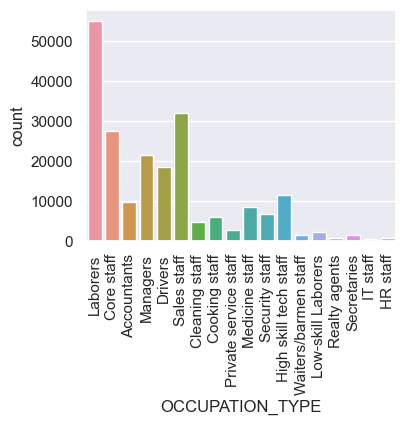

In [10]:
plt.figure(figsize = (4,3))
sns.countplot(data = application_data, x ='OCCUPATION_TYPE');
plt.xticks(rotation=90);

- OCCUPATION_TYPE column, though has 31% missing value it may give some useful insights. However imputing the missing values with mode - Laborers (as it is categorcial) wil distort the data. So we will not do any missing value treatment here and leave it as it is.

### EXT_SOURCE_3

Normalized score from external data source

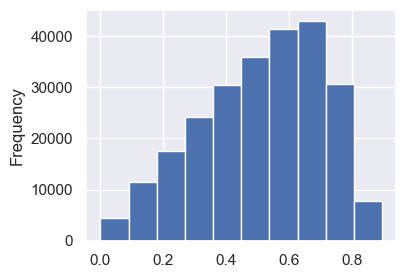

In [11]:
plt.figure(figsize = (4,3))
application_data.EXT_SOURCE_3.plot.hist();

In [12]:
application_data.EXT_SOURCE_3.mean()

0.5108529061800121

In [13]:
application_data.EXT_SOURCE_3.mode()

0   0.75
Name: EXT_SOURCE_3, dtype: float64

In [14]:
application_data.EXT_SOURCE_3.skew()

-0.4093904596160267

This data is left skewed normal distribution 

### AMT_REQ_CREDIT_BUREAU_YEAR

Number of enquiries to Credit Bureau about the client one day year (excluding last 3 months before application)

In [15]:
application_data.AMT_REQ_CREDIT_BUREAU_YEAR.describe()

count   265992.00
mean         1.90
std          1.87
min          0.00
25%          0.00
50%          1.00
75%          3.00
max         25.00
Name: AMT_REQ_CREDIT_BUREAU_YEAR, dtype: float64

In [16]:
application_data.AMT_REQ_CREDIT_BUREAU_YEAR.mode()

0   0.00
Name: AMT_REQ_CREDIT_BUREAU_YEAR, dtype: float64

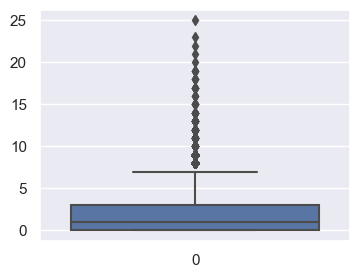

In [17]:
plt.figure(figsize = (4,3))
sns.boxplot(application_data.AMT_REQ_CREDIT_BUREAU_YEAR);

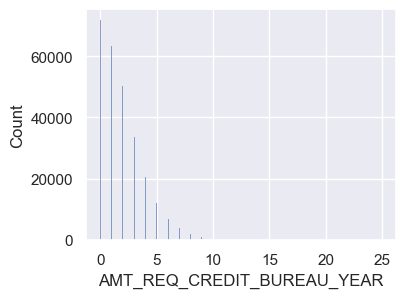

In [18]:
plt.figure(figsize = (4,3))
sns.histplot(application_data.AMT_REQ_CREDIT_BUREAU_YEAR);

- Since this is the Number of enquiries to Credit Bureau about the client we cannot assume the count of enquiry, we can impute with mode 0 if needed


### AMT_REQ_CREDIT_BUREAU_QRT 

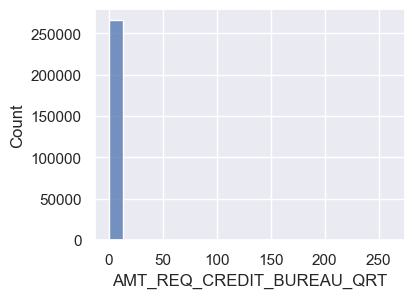

In [19]:
plt.figure(figsize = (4,3))
sns.histplot(application_data.AMT_REQ_CREDIT_BUREAU_QRT);

In [20]:
application_data.AMT_REQ_CREDIT_BUREAU_QRT.value_counts()

0.00      215417
1.00       33862
2.00       14412
3.00        1717
4.00         476
5.00          64
6.00          28
8.00           7
7.00           7
261.00         1
19.00          1
Name: AMT_REQ_CREDIT_BUREAU_QRT, dtype: int64

In [21]:
application_data.AMT_REQ_CREDIT_BUREAU_QRT.mode()

0   0.00
Name: AMT_REQ_CREDIT_BUREAU_QRT, dtype: float64

In [22]:
application_data.AMT_REQ_CREDIT_BUREAU_QRT.describe()

count   265992.00
mean         0.27
std          0.79
min          0.00
25%          0.00
50%          0.00
75%          0.00
max        261.00
Name: AMT_REQ_CREDIT_BUREAU_QRT, dtype: float64

- As it is taking discrete values as number of enquiries we can impute with mode 0 if requuired

### AMT_REQ_CREDIT_BUREAU_MON

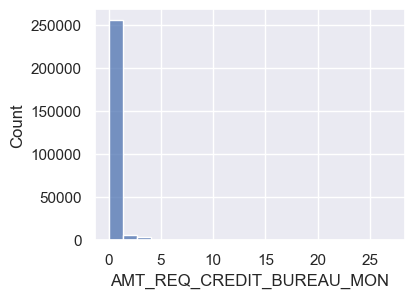

In [23]:
plt.figure(figsize = (4,3))
sns.histplot(application_data.AMT_REQ_CREDIT_BUREAU_MON);

In [24]:
application_data.AMT_REQ_CREDIT_BUREAU_MON.value_counts()

0.00     222233
1.00      33147
2.00       5386
3.00       1991
4.00       1076
5.00        602
6.00        343
7.00        298
9.00        206
8.00        185
10.00       132
11.00       119
12.00        77
13.00        72
14.00        40
15.00        35
16.00        23
17.00        14
18.00         6
19.00         3
24.00         1
23.00         1
27.00         1
22.00         1
Name: AMT_REQ_CREDIT_BUREAU_MON, dtype: int64

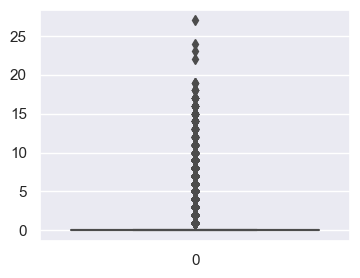

In [25]:
plt.figure(figsize = (4,3))
sns.boxplot(application_data.AMT_REQ_CREDIT_BUREAU_MON);

In this columns most of the entries are 0 and has no much variation, so we can ignore this columns

### AMT_REQ_CREDIT_BUREAU_WEEK

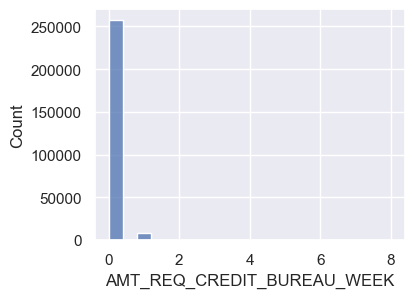

In [26]:
plt.figure(figsize = (4,3))
sns.histplot(application_data.AMT_REQ_CREDIT_BUREAU_WEEK);

- Just like the previous columns this is also mostly zero and can be ignored

### AMT_REQ_CREDIT_BUREAU_DAY

In [27]:
application_data.AMT_REQ_CREDIT_BUREAU_DAY.describe()

count   265992.00
mean         0.01
std          0.11
min          0.00
25%          0.00
50%          0.00
75%          0.00
max          9.00
Name: AMT_REQ_CREDIT_BUREAU_DAY, dtype: float64

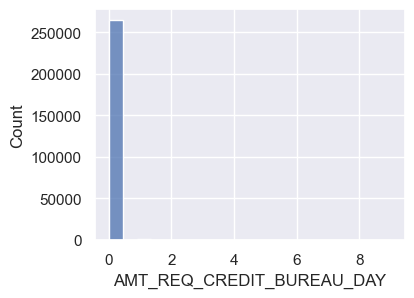

In [28]:
plt.figure(figsize = (4,3))
sns.histplot(application_data.AMT_REQ_CREDIT_BUREAU_DAY);

- Again most of the values are 0, so cant ignore this for analysis.

### AMT_REQ_CREDIT_BUREAU_HOUR

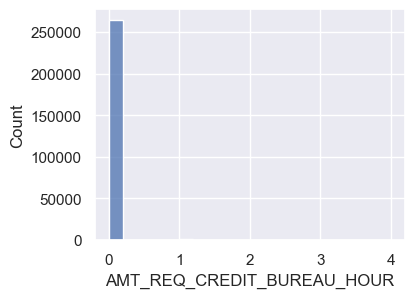

In [29]:
plt.figure(figsize = (4,3))
sns.histplot(application_data.AMT_REQ_CREDIT_BUREAU_HOUR);

- Again most of the values are 0, so cant ignore this for analysis.

In [30]:
application_data.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_C

### DAYS_BIRTH

In [31]:
application_data.DAYS_BIRTH.describe()

count   307511.00
mean    -16037.00
std       4363.99
min     -25229.00
25%     -19682.00
50%     -15750.00
75%     -12413.00
max      -7489.00
Name: DAYS_BIRTH, dtype: float64

In [32]:
# The age in days is shown in -ve for all. Can convet it to positive and years for ease of analysis
# creating a new column of Age in years 

application_data['Age_Years'] =application_data.DAYS_BIRTH.apply(lambda x : -round(x/365))

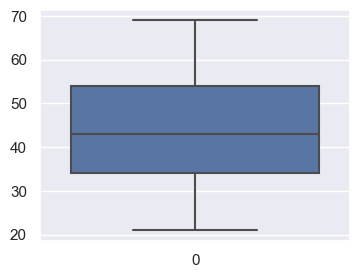

In [33]:
plt.figure(figsize = (4,3))
sns.boxplot(application_data['Age_Years']);

In [34]:
application_data.Age_Years.describe()

count   307511.00
mean        43.94
std         11.96
min         21.00
25%         34.00
50%         43.00
75%         54.00
max         69.00
Name: Age_Years, dtype: float64

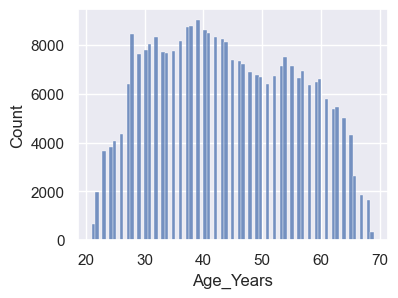

In [35]:
plt.figure(figsize = (4,3))
sns.histplot(application_data['Age_Years']);

In [36]:
# Drop DAYS_BIRTH column

application_data = application_data.drop (['DAYS_BIRTH'] , axis=1)


In [37]:
# Create age range for better understanding. 

def age_cat(years):
    if years <= 20:
        return '0-20'
    elif years > 20 and years <= 30:
        return '20-30'
    elif years > 30 and years <= 40:
        return '30-40'  
    elif years > 40 and years <= 50:
        return '40-50'
    elif years > 50 and years <= 60:
        return '50-60'
    elif years > 60 and years <= 70:
        return '60-70'
    elif years > 70:
        return '70+'

In [38]:
application_data['Age_Category'] = application_data.Age_Years.apply(age_cat)

In [39]:
application_data['Age_Category'].value_counts()

30-40    82770
40-50    75509
50-60    67955
20-30    48869
60-70    32408
Name: Age_Category, dtype: int64

In [40]:
application_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 54 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307511 non-null  int64  
 1   TARGET                       307511 non-null  int64  
 2   NAME_CONTRACT_TYPE           307511 non-null  object 
 3   CODE_GENDER                  307511 non-null  object 
 4   FLAG_OWN_CAR                 307511 non-null  object 
 5   FLAG_OWN_REALTY              307511 non-null  object 
 6   CNT_CHILDREN                 307511 non-null  int64  
 7   AMT_INCOME_TOTAL             307511 non-null  float64
 8   AMT_CREDIT                   307511 non-null  float64
 9   AMT_ANNUITY                  307499 non-null  float64
 10  AMT_GOODS_PRICE              307233 non-null  float64
 11  NAME_TYPE_SUITE              306219 non-null  object 
 12  NAME_INCOME_TYPE             307511 non-null  object 
 13 

#### DAYS_ID_PUBLISH

In [41]:
application_data.DAYS_ID_PUBLISH.describe()

count   307511.00
mean     -2994.20
std       1509.45
min      -7197.00
25%      -4299.00
50%      -3254.00
75%      -1720.00
max          0.00
Name: DAYS_ID_PUBLISH, dtype: float64

This columns has also all -ve values. So we will convert to positive and to Years intead of days 

In [42]:
application_data['Years_ID_PUBLISH'] =application_data.DAYS_ID_PUBLISH.apply(lambda x : round(abs(x)/365))

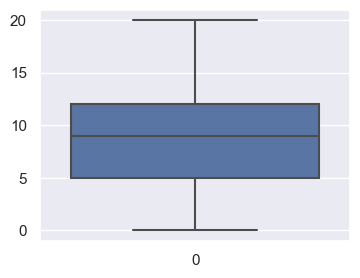

In [43]:
plt.figure(figsize = (4,3))
sns.boxplot(application_data.Years_ID_PUBLISH);

In [44]:
application_data.Years_ID_PUBLISH.describe()

count   307511.00
mean         8.20
std          4.15
min          0.00
25%          5.00
50%          9.00
75%         12.00
max         20.00
Name: Years_ID_PUBLISH, dtype: float64

In [45]:
# Drop extra column

application_data = application_data.drop (['DAYS_ID_PUBLISH'] , axis=1)


### DAYS_EMPLOYED

In [46]:
application_data.DAYS_EMPLOYED.describe()

count   307511.00
mean     63815.05
std     141275.77
min     -17912.00
25%      -2760.00
50%      -1213.00
75%       -289.00
max     365243.00
Name: DAYS_EMPLOYED, dtype: float64

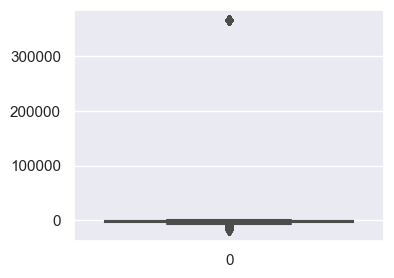

In [47]:
plt.figure(figsize = (4,3))
sns.boxplot(application_data.DAYS_EMPLOYED);

In [48]:
application_data.DAYS_EMPLOYED.quantile([0.25,0.5,0.75,0.99])

0.25    -2760.00
0.50    -1213.00
0.75     -289.00
0.99   365243.00
Name: DAYS_EMPLOYED, dtype: float64

In [49]:
# max value is 365243 days which is more than 1000 years which is impossible for someone be employed for more than 1000 years
# Other values are in -ve so should be converted to positive. Creating a column converting these days to years. 
# This column inidcates How many days before the application the person started current employment 
# There are 55K+ records (18% of the total data) with 365243 days employed which is more than 1000 years which are outliers
# we can check the income for this section for better understanding

In [50]:
application_data ['Years_EMPLOYED'] = application_data.DAYS_EMPLOYED.apply(lambda x : round(abs(x)/365))

In [51]:
application_data.Years_EMPLOYED.value_counts().head()

1001    55374
1       34796
2       30530
3       27721
4       22933
Name: Years_EMPLOYED, dtype: int64

In [52]:
application_data[application_data.DAYS_EMPLOYED == 365243].NAME_INCOME_TYPE.value_counts()

Pensioner     55352
Unemployed       22
Name: NAME_INCOME_TYPE, dtype: int64

In [53]:
# The people who are showed as employed for 365243 days are actually in Pensioner and Unemployed income category
# We can find the average days excluding this value 365243 and impute the same for Pensioners and impute 0 for unemployed
# or ignore these while doing analysis as these are outliers.

In [54]:
# Drop DAYS_EMPLOYED

application_data = application_data.drop (['DAYS_EMPLOYED'] , axis=1)

### DAYS_REGISTRATION

In [55]:
application_data.DAYS_REGISTRATION.describe()

count   307511.00
mean     -4986.12
std       3522.89
min     -24672.00
25%      -7479.50
50%      -4504.00
75%      -2010.00
max          0.00
Name: DAYS_REGISTRATION, dtype: float64

In [56]:
# Similar data in this column as well. Will convert to positive and years. 
application_data.Years_REGISTRATION = application_data.DAYS_REGISTRATION.apply(lambda x : round(abs(x)/365))

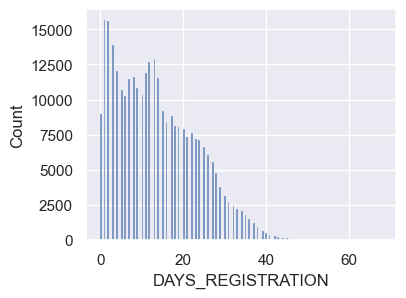

In [57]:
plt.figure(figsize = (4,3))
sns.histplot(application_data.Years_REGISTRATION);

In [58]:
# Drop DAYS_REGISTRATION
application_data = application_data.drop (['DAYS_REGISTRATION'] , axis=1)

#### CODE_GENDER

In [59]:
application_data.CODE_GENDER.value_counts(normalize = True)

F     0.66
M     0.34
XNA   0.00
Name: CODE_GENDER, dtype: float64

In [60]:
# XNA seems like missing value as Gender will be M or F so imputing with mode F

In [61]:
application_data.CODE_GENDER = application_data.CODE_GENDER.replace('XNA' , 'F')

In [62]:
application_data.dtypes

SK_ID_CURR                       int64
TARGET                           int64
NAME_CONTRACT_TYPE              object
CODE_GENDER                     object
FLAG_OWN_CAR                    object
FLAG_OWN_REALTY                 object
CNT_CHILDREN                     int64
AMT_INCOME_TOTAL               float64
AMT_CREDIT                     float64
AMT_ANNUITY                    float64
AMT_GOODS_PRICE                float64
NAME_TYPE_SUITE                 object
NAME_INCOME_TYPE                object
NAME_EDUCATION_TYPE             object
NAME_FAMILY_STATUS              object
NAME_HOUSING_TYPE               object
REGION_POPULATION_RELATIVE     float64
FLAG_MOBIL                       int64
FLAG_EMP_PHONE                   int64
FLAG_WORK_PHONE                  int64
FLAG_CONT_MOBILE                 int64
FLAG_PHONE                       int64
FLAG_EMAIL                       int64
OCCUPATION_TYPE                 object
CNT_FAM_MEMBERS                float64
REGION_RATING_CLIENT     

# Analysing Target

In [63]:
# Total Clients

application_data.TARGET.count()

307511

In [64]:
# Client with Payment Difficulties

(application_data.TARGET==0).sum()

282686

In [65]:
# Client without Payment Difficulties

(application_data.TARGET==1).sum()

24825

### Data Imbalance

In [66]:
(application_data.TARGET==0).sum()/(application_data.TARGET==1).sum()

11.387150050352467

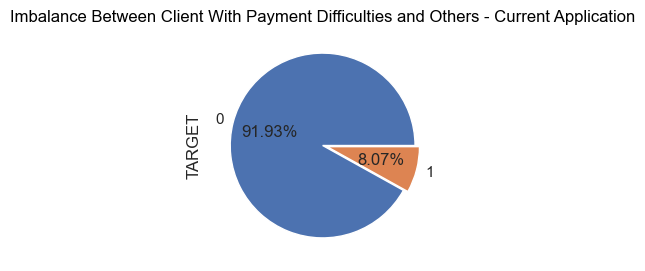

In [67]:
plt.figure (figsize = [4,3])
plt.title ('Imbalance Between Client With Payment Difficulties and Others - Current Application' , color = 'black' )
application_data.TARGET.value_counts(normalize = True).plot.pie(autopct= '%2.2f%%' , explode=[0,0.05]);

In [68]:
# ~92% clients have no payment difficulty. 8% are clients with payment difficulties 
# High imbalance 11.39%


# Analysing Categorical Data

In [69]:
# Due to data imbalance we will separate the data into 2 , with Target 0 and with Target 1 and analyse separately to find out any relation

df0 = application_data[application_data.TARGET ==0]
df1 = application_data[application_data.TARGET ==1]
print(df0.shape)
print(df1.shape)

(282686, 53)
(24825, 53)


In [70]:
df_cat = application_data.select_dtypes(include=['object']).columns

In [71]:
df_cat

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'Age_Category'],
      dtype='object')

# Univariate Analysis of Categorical Data

In [72]:
# Creating different Plot for analysis

def funcplot(application_data, df0, df1, column):
    
    df_app = application_data
    df0 = df0
    df1 = df1
    col = column
    
    fig = plt.figure(figsize=(13,10))
    
    ax1 = plt.subplot(221)
    df_app[col].value_counts().plot.pie(autopct = "%1.0f%%", ax=ax1)
    plt.title('Plot for '+ column , color = 'b')
    
    ax2 = plt.subplot(222)
    sns.countplot(x= column, hue = 'TARGET', data = df_app, ax = ax2)
    plt.xticks(rotation=90)
    plt.title('Plot for Target as per Total Count' , color = 'b')


    ax3 = plt.subplot(223)
    df0[col].value_counts().plot.pie(autopct = "%1.0f%%", ax=ax3)
    plt.title('Plot for Non-Defaulters Based on '+ column , color = 'b')

    ax4 = plt.subplot(224)
    df1[col].value_counts().plot.pie(autopct = "%1.0f%%", ax=ax4 )
    plt.title('Plot for Defaulters Based on '+ column , color = 'b')

    fig.tight_layout() # Or equivalently,  "plt.tight_layout()"

    plt.show()

In [73]:
df1.NAME_CONTRACT_TYPE.value_counts()

Cash loans         23221
Revolving loans     1604
Name: NAME_CONTRACT_TYPE, dtype: int64

Plot for NAME_CONTRACT_TYPE


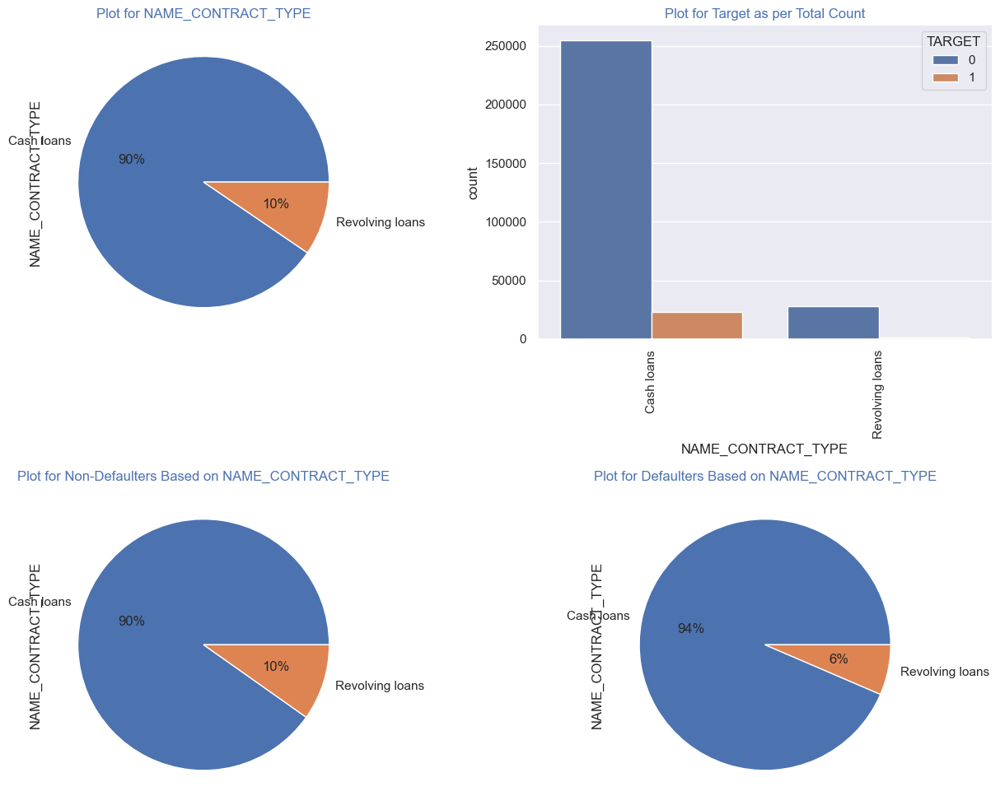

****************************************************************************
Plot for CODE_GENDER


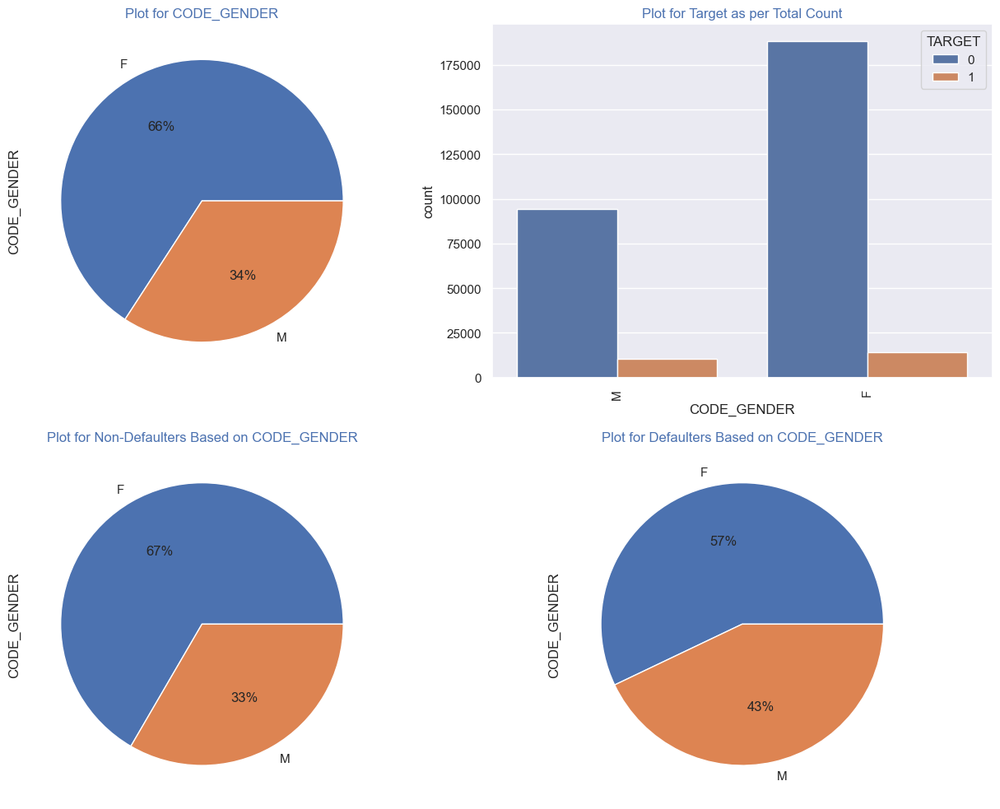

****************************************************************************
Plot for FLAG_OWN_CAR


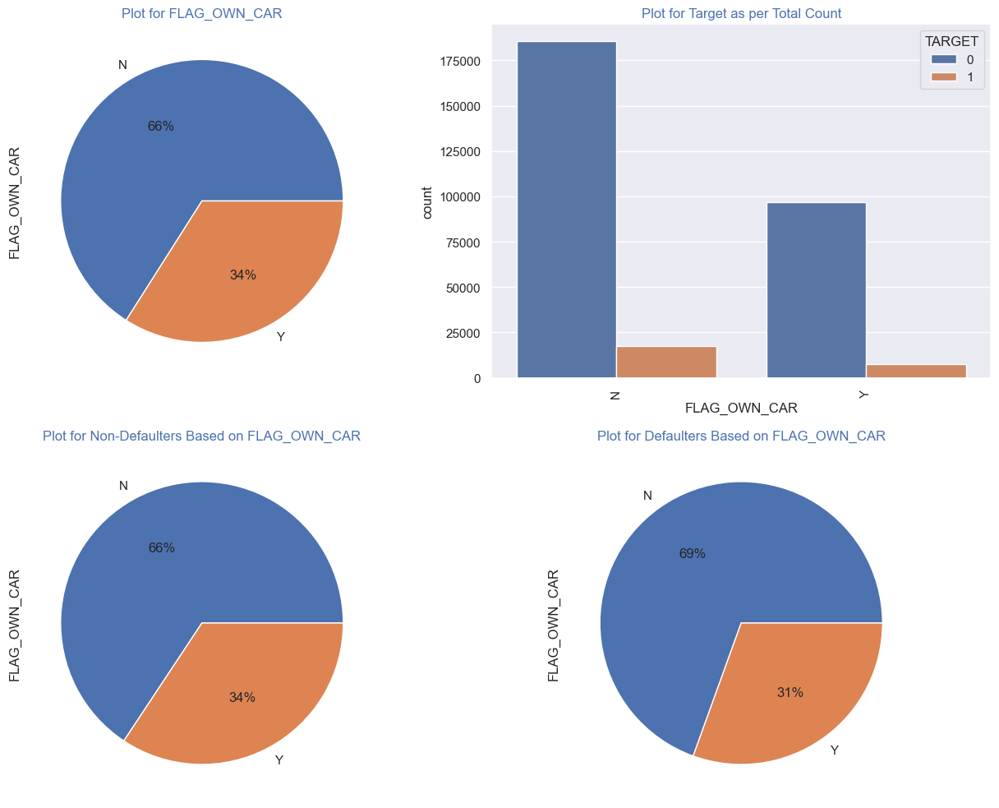

****************************************************************************
Plot for FLAG_OWN_REALTY


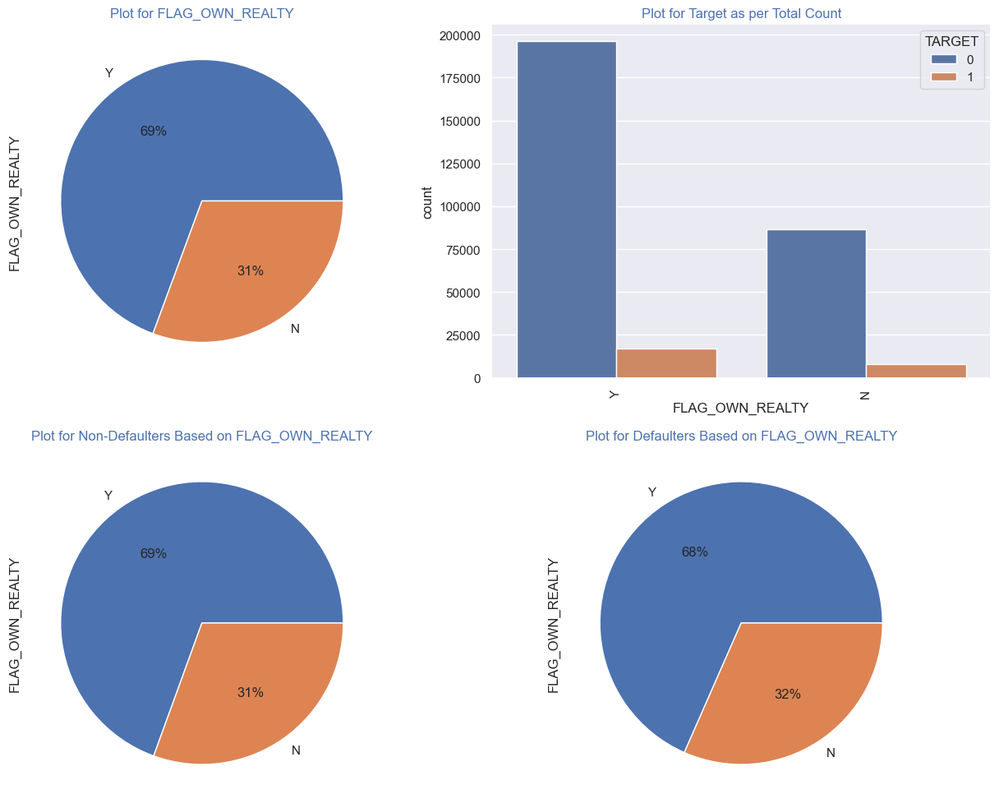

****************************************************************************
Plot for NAME_TYPE_SUITE


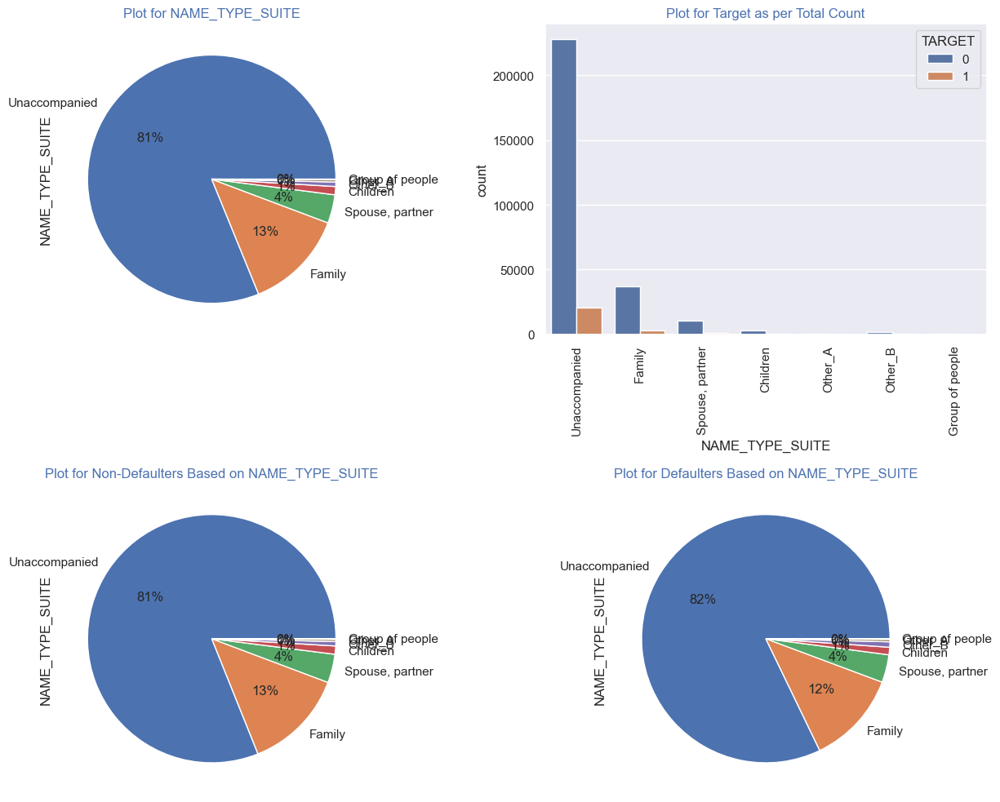

****************************************************************************
Plot for NAME_INCOME_TYPE


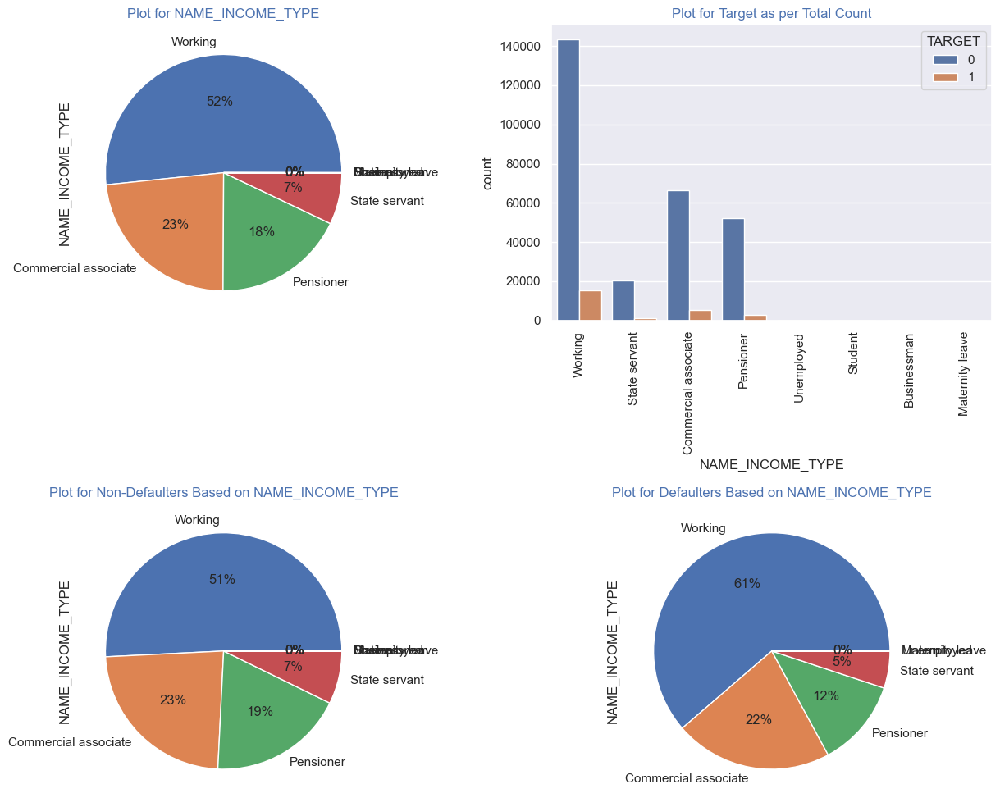

****************************************************************************
Plot for NAME_EDUCATION_TYPE


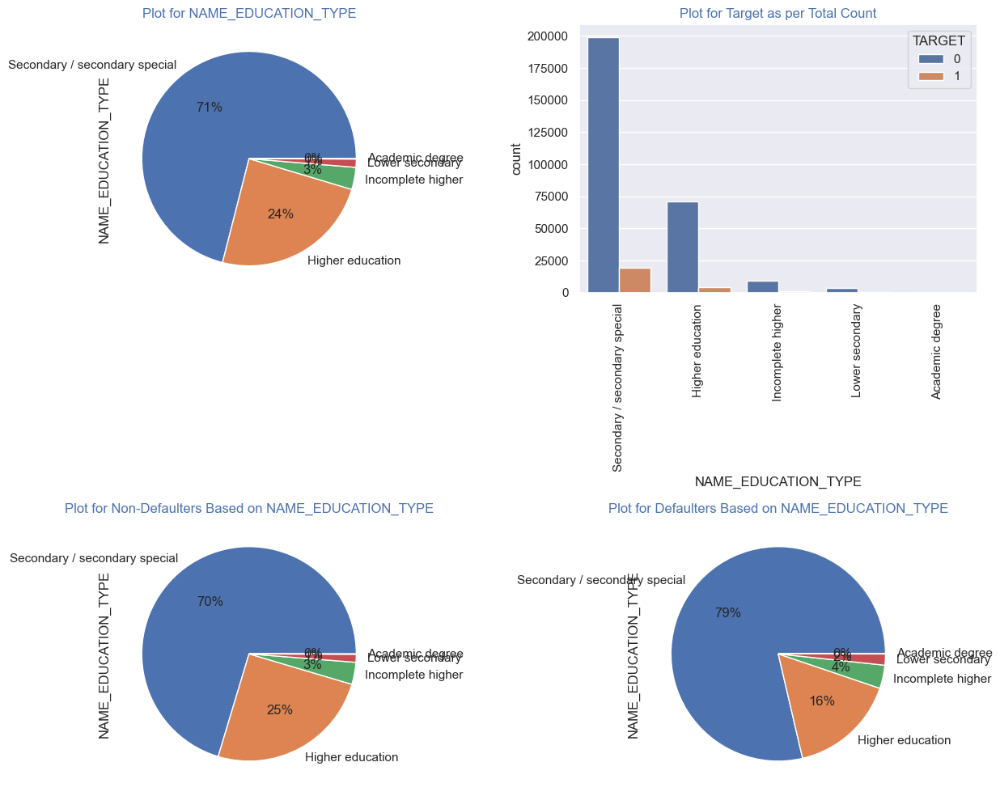

****************************************************************************
Plot for NAME_FAMILY_STATUS


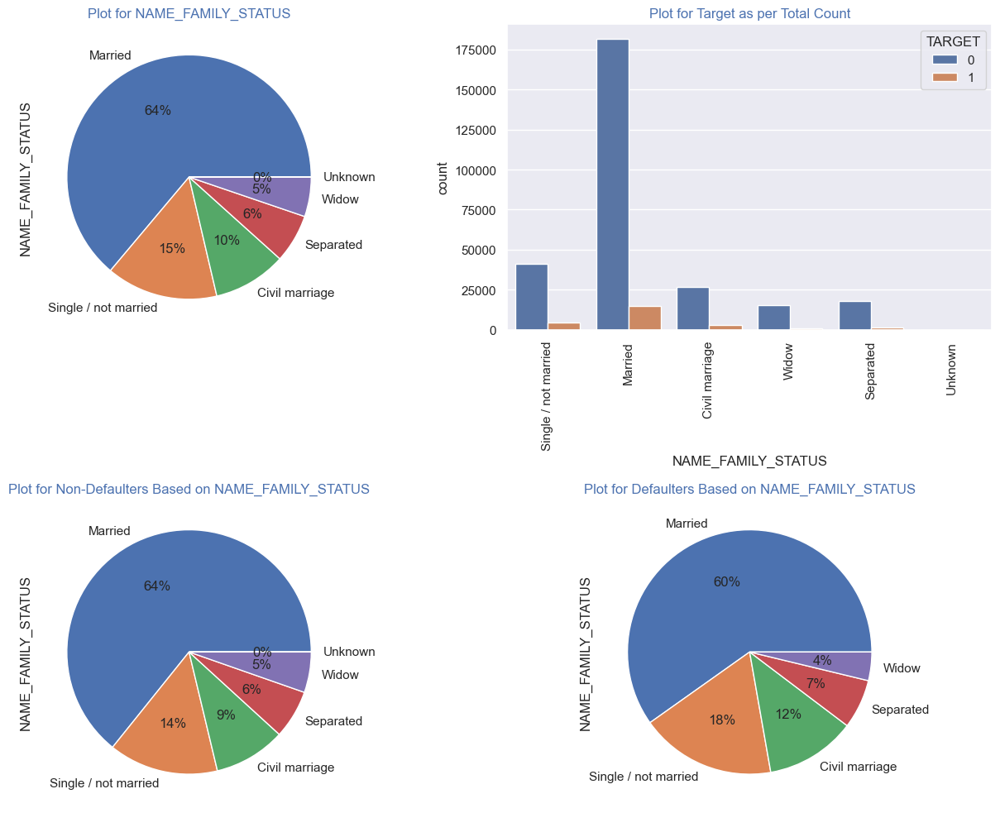

****************************************************************************
Plot for NAME_HOUSING_TYPE


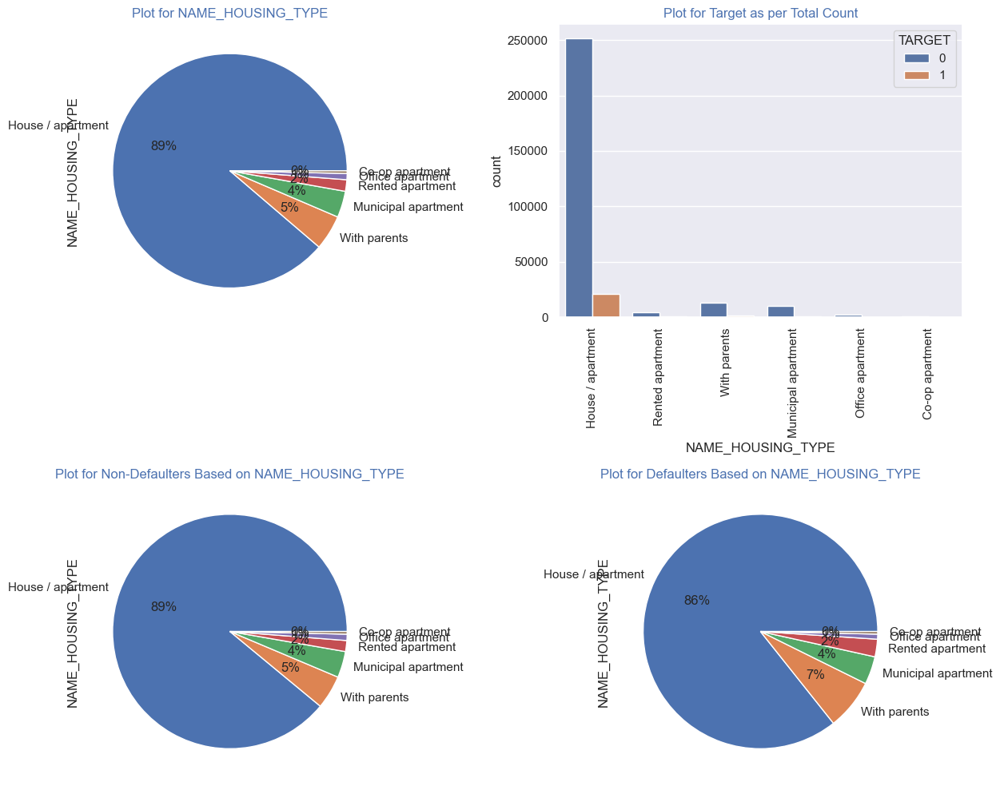

****************************************************************************
Plot for OCCUPATION_TYPE


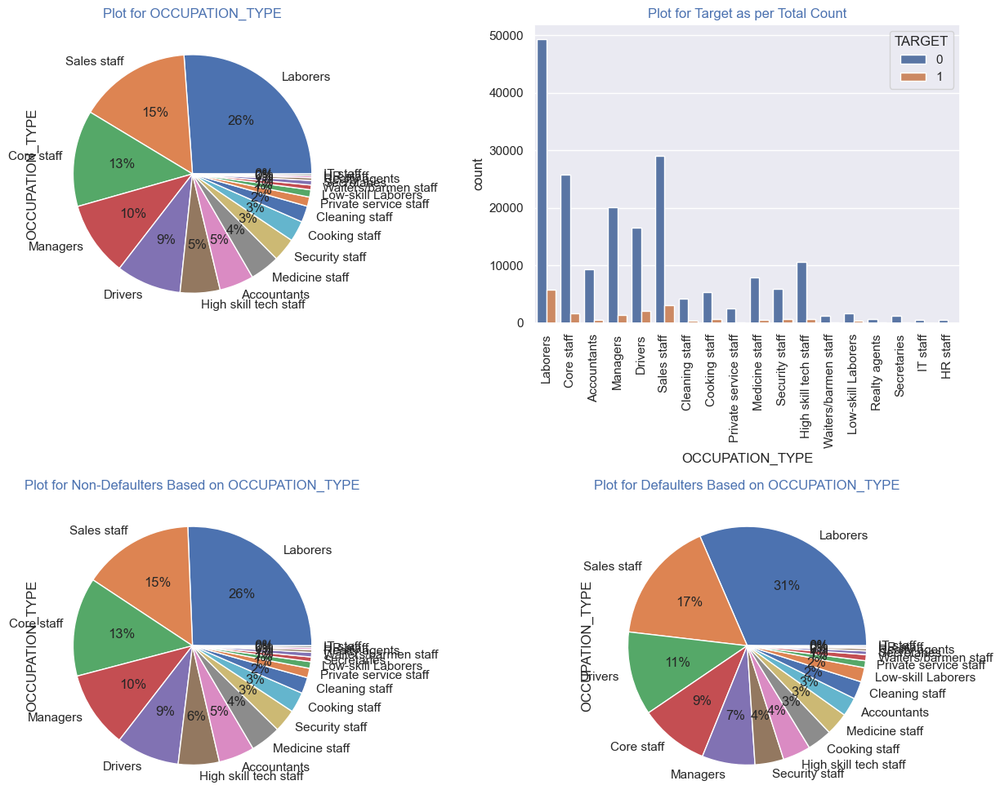

****************************************************************************
Plot for WEEKDAY_APPR_PROCESS_START


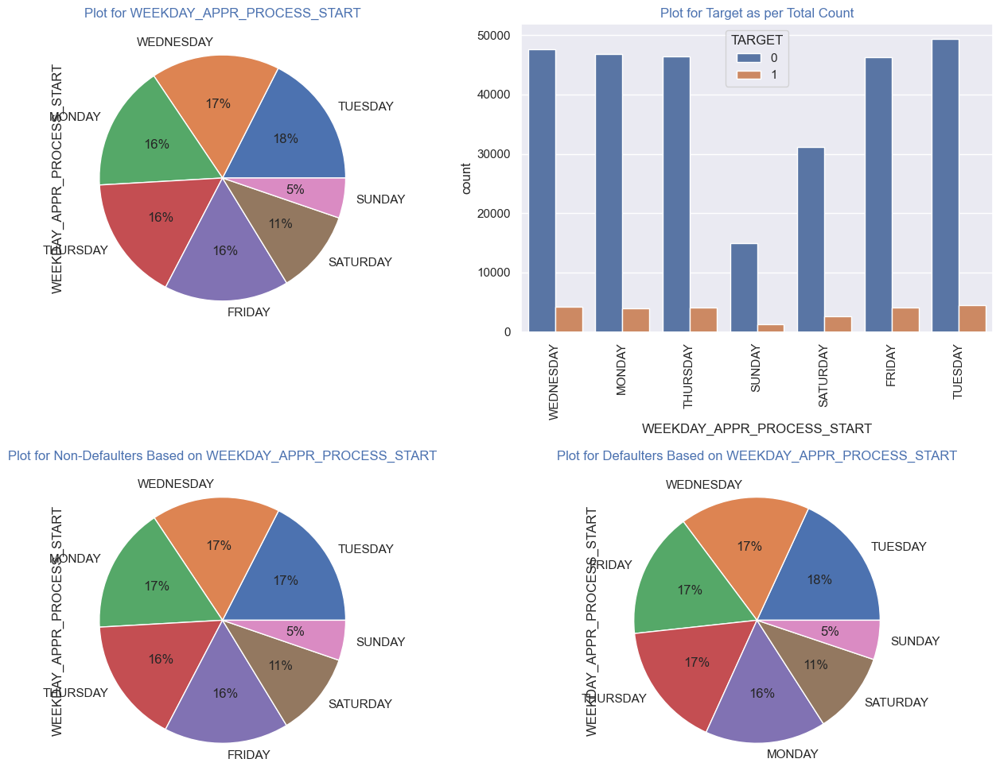

****************************************************************************
Plot for ORGANIZATION_TYPE


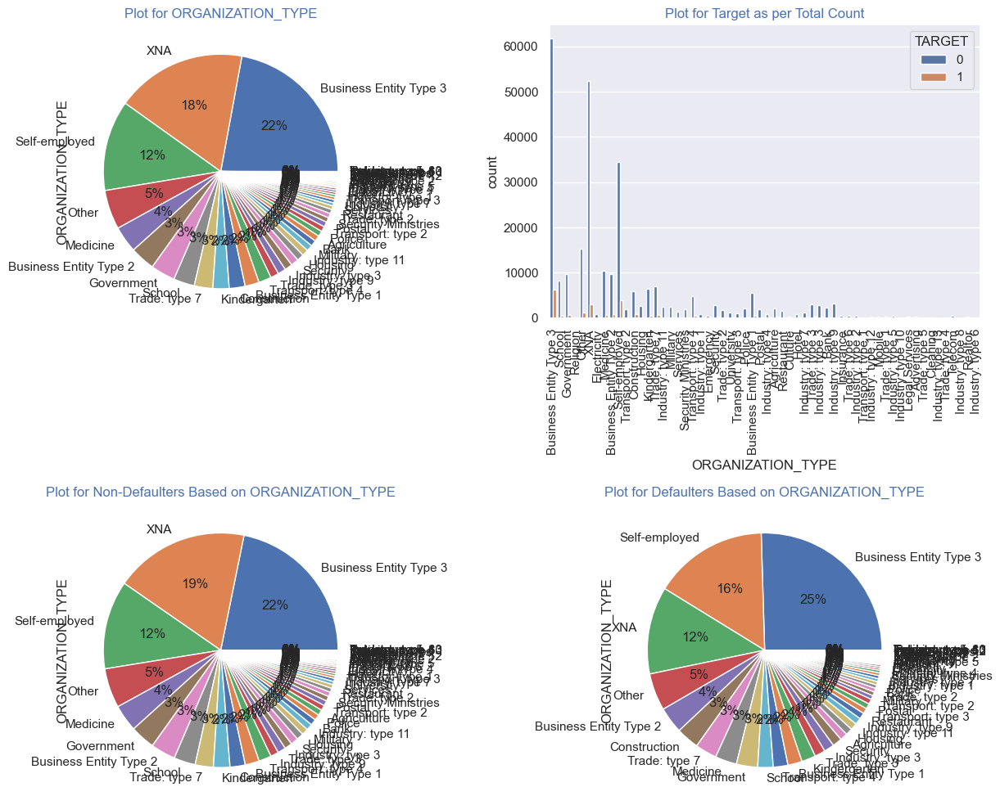

****************************************************************************
Plot for Age_Category


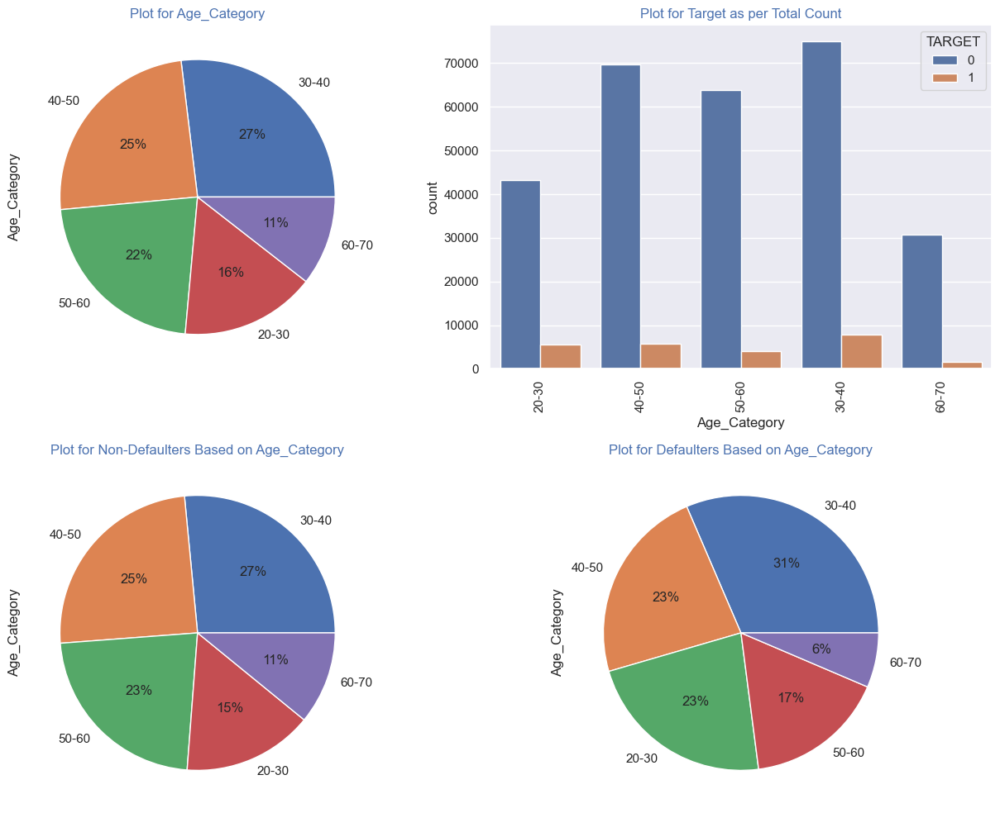

****************************************************************************


In [74]:
for column in df_cat:
    print('Plot for', column)
    funcplot(application_data, df0, df1, column)
    print('****************************************************************************')
    
    #Inference from each column is mentioned below. 

- NAME_CONTRACT_TYPE : 90% of the total loans are Cash Loans and 10% are Revolving loans. There are ~25000 cash loans in Target= 0 section and ~ 2500 cash loans in Target= 1 section. 94% of defaulters are for Cash Loans and 6% are for Revolving Loans
<br/> <br/>
- CODE_GENDER : 66% Females take loans against 34% Male. However defaulter% is higher for Male , 43% of the total defaulters are Male while Non-Defaulter Males are just 33% of the total Non-defaulters.
<br/><br/>
- FLAG_OWN_CAR : 66% clients do not own a car. The % of payment difficulty is almost similar for car owners and others. No specific relation to Own car and payment.
<br/><br/>
- FLAG_OWN_REALTY : No significant difference in repayment for people who Own propepry compared to others 
<br/><br/>
- NAME_TYPE_SUITE : 81% of the applicants were Unaccompanied , 82% of total defaulters were unaccompanied , looking at the graph this column doesnt give any valid inference
<br/><br/>
- NAME_INCOME_TYPE : Working people takes the most number of loans (52%) and they are the highest defaulters. Working defaulters(61%)are more than Non defaulters (51%). Pensioner defaulter (12%) is less than non defaulter (19%).
<br/><br/>
- NAME_EDUCATION_TYPE :Maximum loan (71%) are taken by clients with Secondary Education followed by Higher education (24%). The defaulter % is quite high for clients with Secondary Education (79%) For higher education the defaulter% is much lower (16%)
<br/><br/>
- NAME_FAMILY_STATUS :Married people take the most loans. The defaulter% is almost similar. A bit low for married compared to Non defaulters, but other Family type has higher defaulter% than Non-defaulter. Single and civil marriage turns out to be more in defaulter%.
<br/><br/>
- NAME_HOUSING_TYPE : Maximum Loans are taken by clients staying in House/Apartment. 
<br/><br/>
- OCCUPATION_TYPE : Laborers take highest loan and they are the highest defaulters followed by sales staff and Core staff. Core staff defaulter % is less compared to non defaulters. Mangers and High skill tech staff are paying loans on time mostly, their default % is less.
<br/><br/>
- WEEKDAY_APPR_PROCESS_START : No significant obeservation. 
<br/>
<br/>
- ORGANIZATION_TYPE : _* XNA seems to be missing *_. XNA section contains 19% of the data we should keep it as it is or create a separate category as unknown and should not impute values with any existing value. It will distort the data. Overall the Organization type Business Entity Type 3 has the most loans taken. The defaulters are 25% of the total defaulters compared to non-defaulters(22%)
<br/>
<br/>
- Age_Category : Maximum loan taken by 30-50 age group followed by 40-50 and 50-60 range. The defaulters are also highest in 30-40 age range followed by 40-50 and 50-60 range. As we have seen earlier that pensioners are less defaulters , the same can be confirmed here also as the age range 60-70 constitute least defaulter%.

##### The impotant variables seems affecting the targets are CODE_GENDER , NAME_INCOME_TYPE , NAME_EDUCATION_TYPE , NAME_FAMILY_STATUS , OCCUPATION_TYPE , ORGANIZATION_TYPE and Age_Category

In [75]:
# import pandas_profiling as pp
# from pandas_profiling import ProfileReport
# profile = ProfileReport(application_data)
# profile.to_file(output_file = "Profile Appl.html")

#  Analysing Numerical Columns

### Non-Defaulter Correlation

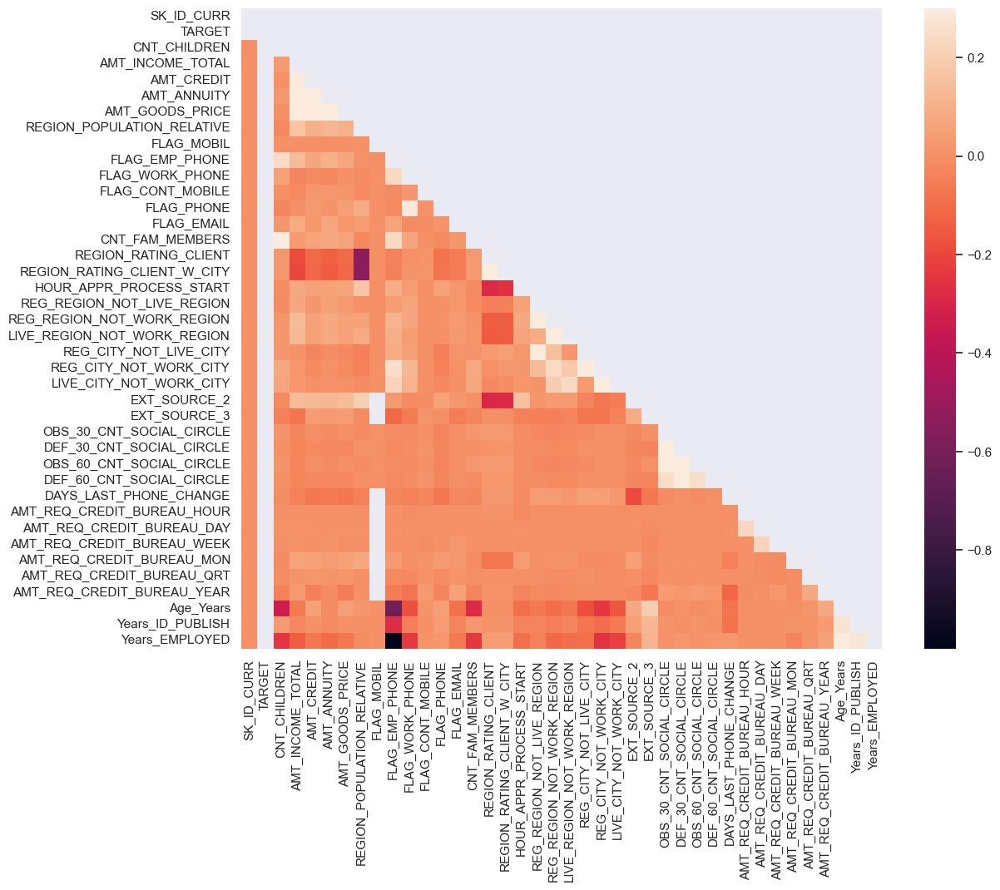

In [76]:

corr = df0.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(13, 10))
with sns.axes_style("white"):
    ax = sns.heatmap(corr, mask=mask, vmax=.3, square=True , )

### Finding top Correlations for Non -Defaulters

In [77]:
corr0 = df0.corr().abs()
corr0 = corr0.unstack().sort_values(kind="quicksort")
corr0 = corr0.dropna()
corr0 = corr0[corr0 != 1.0]

print((corr0).tail(15))

REG_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY       0.83
DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE      0.86
DEF_30_CNT_SOCIAL_CIRCLE     DEF_60_CNT_SOCIAL_CIRCLE      0.86
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION   0.86
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION    0.86
CNT_CHILDREN                 CNT_FAM_MEMBERS               0.88
CNT_FAM_MEMBERS              CNT_CHILDREN                  0.88
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT          0.95
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY   0.95
AMT_GOODS_PRICE              AMT_CREDIT                    0.99
AMT_CREDIT                   AMT_GOODS_PRICE               0.99
OBS_30_CNT_SOCIAL_CIRCLE     OBS_60_CNT_SOCIAL_CIRCLE      1.00
OBS_60_CNT_SOCIAL_CIRCLE     OBS_30_CNT_SOCIAL_CIRCLE      1.00
FLAG_EMP_PHONE               Years_EMPLOYED                1.00
Years_EMPLOYED               FLAG_EMP_PHONE                1.00
dtype: float64


###  Defaulter Correlation


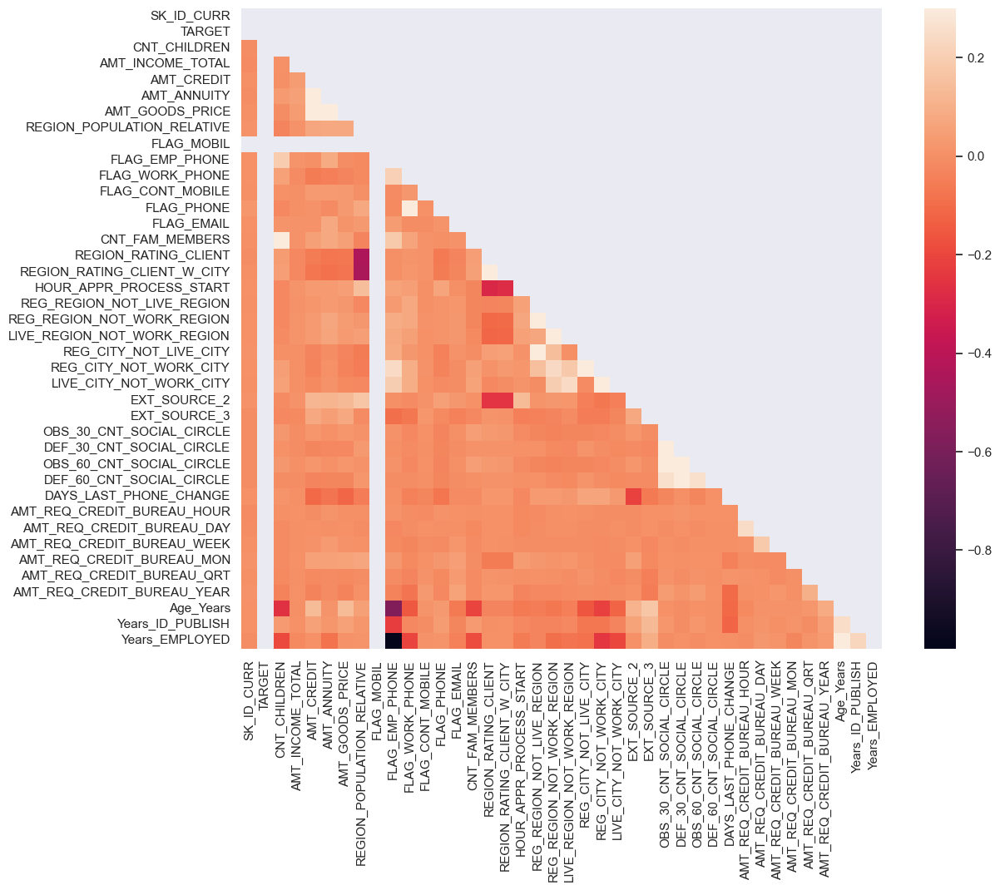

In [78]:

corr = df1.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(13, 10))
with sns.axes_style("white"):
    ax = sns.heatmap(corr, mask=mask, vmax=.3, square=True)

### Finding top Correlations for Defaulters

In [79]:
corr1 = df1.corr().abs()
corr1 = corr1.unstack().sort_values(kind="quicksort")
corr1 = corr1.dropna()
corr1 = corr1[corr1 != 1.0]

print((corr1).tail(15))

LIVE_CITY_NOT_WORK_CITY      REG_CITY_NOT_WORK_CITY        0.78
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION    0.85
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION   0.85
DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE      0.87
DEF_30_CNT_SOCIAL_CIRCLE     DEF_60_CNT_SOCIAL_CIRCLE      0.87
CNT_CHILDREN                 CNT_FAM_MEMBERS               0.89
CNT_FAM_MEMBERS              CNT_CHILDREN                  0.89
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT          0.96
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY   0.96
AMT_GOODS_PRICE              AMT_CREDIT                    0.98
AMT_CREDIT                   AMT_GOODS_PRICE               0.98
OBS_60_CNT_SOCIAL_CIRCLE     OBS_30_CNT_SOCIAL_CIRCLE      1.00
OBS_30_CNT_SOCIAL_CIRCLE     OBS_60_CNT_SOCIAL_CIRCLE      1.00
Years_EMPLOYED               FLAG_EMP_PHONE                1.00
FLAG_EMP_PHONE               Years_EMPLOYED                1.00
dtype: float64


### Outlier Analysis (Distplot + BoxPlot) - Numerical columns

In [80]:
def outlier(dataset,column):
    plt.subplots(1,2 ,figsize = (25,8))

    plt.subplot(121)
    sns.distplot(dataset[column], color = 'blue')
    pltname = 'Distplot of ' + column
    plt.ticklabel_format(style='plain', axis='x')
    plt.title(pltname)
    

    plt.subplot(122)
#     sns.boxplot(y = column, data = dataset, fliersize = 10)
    red_diamond = dict(markerfacecolor='r', marker='D')
    sns.boxplot(y = column, data = dataset, flierprops = red_diamond)
#     plt.boxplot(dataset[column], flierprops = red_diamond)
    pltname = 'Boxplot of ' + column
    plt.title(pltname)

    plt.tight_layout(pad = 4)
    plt.show()

In [81]:
numerical = application_data.select_dtypes(include=['int64','float64']).columns
numerical

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE',
       'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR', 'Age_Years', 'Years_ID_PUBLISH',
       

#### Analysis for CNT_CHILDREN

In [82]:
application_data.CNT_CHILDREN.describe()

count   307511.00
mean         0.42
std          0.72
min          0.00
25%          0.00
50%          0.00
75%          1.00
max         19.00
Name: CNT_CHILDREN, dtype: float64

In [83]:
IQR = 1.000000- 0.000000
IQR

1.0

In [84]:
# Values before (Q1 - 1.5 IQR) and (Q3 + 1.5 IQR) are outliers
#Min_Value
0-(1.5*1)

-1.5

In [85]:
#Max_Value
1+(1.5*1)

2.5

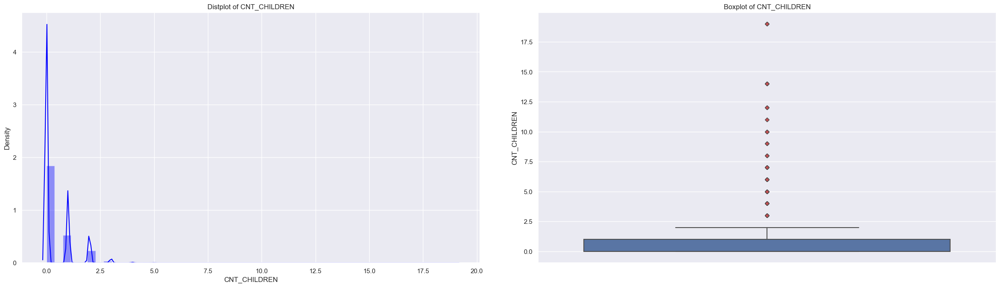

In [86]:
outlier(application_data, 'CNT_CHILDREN')

In [87]:
application_data.CNT_CHILDREN.skew()

1.9746044696947922

- A skewness value greater than 1 or less than -1 indicates a highly skewed distribution. A value between 0.5 and 1 or -0.5 and -1 is moderately skewed. A value between -0.5 and 0.5 indicates that the distribution is fairly symmetrical.
- Use median to impute highly skewed data. For symmetrical data we can use Mean

In [88]:
application_data[application_data.CNT_CHILDREN==19]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,Age_Years,Age_Category,Years_ID_PUBLISH,Years_EMPLOYED
155369,280108,0,Cash loans,F,N,Y,19,112500.00,269550.00,13891.50,225000.00,Family,Working,Secondary / secondary special,Single / not married,House / apartment,0.01,1,1,1,1,1,0,Waiters/barmen staff,20.00,2,2,SUNDAY,11,0,0,0,0,0,0,Restaurant,0.55,NaN,1.00,1.00,1.00,1.00,-744.00,0.00,0.00,0.00,0.00,0.00,4.00,30,20-30,2,5
265784,407877,0,Cash loans,F,N,Y,19,112500.00,135000.00,8788.50,135000.00,Unaccompanied,Working,Higher education,Single / not married,House / apartment,0.02,1,1,0,1,1,0,Core staff,20.00,2,2,THURSDAY,15,0,0,0,0,0,0,Kindergarten,0.17,0.57,1.00,0.00,1.00,0.00,-2495.00,0.00,0.00,0.00,0.00,0.00,2.00,28,20-30,7,2


In [89]:
application_data[application_data.CNT_CHILDREN >=10]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,Age_Years,Age_Category,Years_ID_PUBLISH,Years_EMPLOYED
34545,140032,1,Cash loans,M,Y,N,11,315000.00,1007761.50,38515.50,927000.00,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.01,1,1,0,1,0,0,Managers,13.00,2,2,FRIDAY,17,0,0,0,0,1,1,Other,0.57,0.12,0.00,0.00,0.00,0.00,-3.00,0.00,0.00,0.00,0.00,0.00,0.00,47,40-50,2,1
80948,193853,0,Cash loans,F,N,Y,12,337500.00,746280.00,59094.00,675000.00,Family,Commercial associate,Secondary / secondary special,Married,House / apartment,0.05,1,1,0,1,0,0,Core staff,14.00,1,1,FRIDAY,13,0,0,0,0,0,0,Kindergarten,0.70,0.13,3.00,2.00,3.00,1.00,-357.00,0.00,0.00,0.00,1.00,0.00,3.00,39,30-40,11,7
132585,253779,0,Cash loans,F,N,Y,10,67500.00,92655.00,5301.00,76500.00,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,0.02,1,1,0,1,0,0,Core staff,12.00,2,2,FRIDAY,10,0,0,0,0,0,0,School,0.64,0.64,0.00,0.00,0.00,0.00,-1577.00,0.00,0.00,1.00,0.00,0.00,2.00,31,30-40,3,2
155369,280108,0,Cash loans,F,N,Y,19,112500.00,269550.00,13891.50,225000.00,Family,Working,Secondary / secondary special,Single / not married,House / apartment,0.01,1,1,1,1,1,0,Waiters/barmen staff,20.00,2,2,SUNDAY,11,0,0,0,0,0,0,Restaurant,0.55,NaN,1.00,1.00,1.00,1.00,-744.00,0.00,0.00,0.00,0.00,0.00,4.00,30,20-30,2,5
171125,298322,0,Revolving loans,F,N,Y,12,225000.00,202500.00,10125.00,202500.00,Family,Commercial associate,Secondary / secondary special,Married,House / apartment,0.05,1,1,1,1,1,0,Core staff,14.00,1,1,TUESDAY,13,0,0,0,0,0,0,Kindergarten,0.73,0.36,3.00,2.00,3.00,1.00,-158.00,0.00,0.00,0.00,0.00,0.00,0.00,38,30-40,10,7
176011,303956,0,Cash loans,M,Y,Y,14,225000.00,1085058.00,55530.00,891000.00,Children,Working,Secondary / secondary special,Separated,House / apartment,0.03,1,1,0,1,0,0,Drivers,15.00,2,2,FRIDAY,8,0,0,0,0,0,0,Self-employed,0.51,0.26,0.00,0.00,0.00,0.00,-1718.00,0.00,0.00,0.00,0.00,0.00,1.00,49,40-50,4,5
183878,313127,0,Cash loans,F,Y,N,14,45000.00,810000.00,23814.00,810000.00,Unaccompanied,Pensioner,Secondary / secondary special,Married,House / apartment,0.01,1,0,0,1,0,0,NaN,16.00,2,2,TUESDAY,14,0,0,0,1,0,0,XNA,0.73,0.67,1.00,0.00,1.00,0.00,-1785.00,0.00,0.00,0.00,0.00,0.00,1.00,56,50-60,10,1001
186820,316580,0,Cash loans,F,N,Y,10,67500.00,117162.00,12559.50,103500.00,Family,Working,Secondary / secondary special,Married,House / apartment,0.02,1,1,0,1,0,0,NaN,12.00,3,3,THURSDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.59,NaN,0.00,0.00,0.00,0.00,-2520.00,NaN,NaN,NaN,NaN,NaN,NaN,41,40-50,12,4
265784,407877,0,Cash loans,F,N,Y,19,112500.00,135000.00,8788.50,135000.00,Unaccompanied,Working,Higher education,Single / not married,House / apartment,0.02,1,1,0,1,1,0,Core staff,20.00,2,2,THURSDAY,15,0,0,0,0,0,0,Kindergarten,0.17,0.57,1.00,0.00,1.00,0.00,-2495.00,0.00,0.00,0.00,0.00,0.00,2.00,28,20-30,7,2
267998,410527,0,Cash loans,F,N,N,14,54000.00,604152.00,25596.00,540000.00,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.01,1,1,1,1,1,0,Managers,16.00,2,2,SUNDAY,14,0,0,0,0,0,0,Postal,0.71,0.57,0.00,0

- Values above 2.5 are outliers as per IQR Min and Max values 
- Clients with more than 19 children are from 20-30 age category which cannot be correct and seems to be an abberation
- clients with more than 10 children are mostly from 30-50 age range 
- Clients with more than 3 are outliers. 
- Skewness : 1.97 : Data is highly skewed

#### Analysis of AMT_INCOME_TOTAL

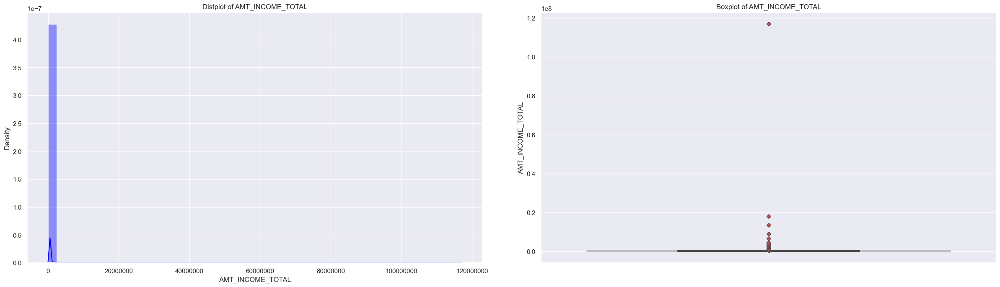

In [90]:
outlier(application_data,'AMT_INCOME_TOTAL')

In [91]:
# This plot is not giving much information as there is one outlier around ~120 Million and it is squeezing entire plot 

application_data.AMT_INCOME_TOTAL.describe(percentiles = [0.75,0.99,0.999]),2

(count      307511.00
 mean       168797.92
 std        237123.15
 min         25650.00
 50%        147150.00
 75%        202500.00
 99%        472500.00
 99.9%      900000.00
 max     117000000.00
 Name: AMT_INCOME_TOTAL, dtype: float64,
 2)

In [92]:
application_data.AMT_INCOME_TOTAL.quantile(q= [0.75,0.99,0.999])

0.75   202500.00
0.99   472500.00
1.00   900000.00
Name: AMT_INCOME_TOTAL, dtype: float64

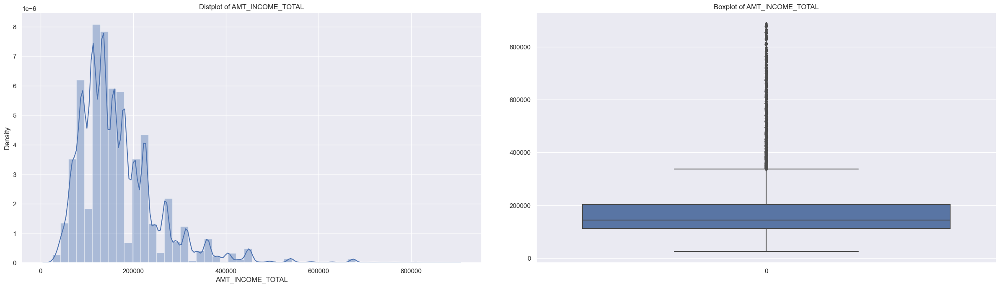

In [93]:
# Plotting for income under 99.9% value 900000.0

plt.subplots(1,2 ,figsize = (25,8))

plt.subplot(121)
sns.distplot(application_data[application_data['AMT_INCOME_TOTAL'] < 900000].AMT_INCOME_TOTAL)
pltname = 'Distplot of ' + 'AMT_INCOME_TOTAL'
plt.title(pltname)

plt.subplot(122)
sns.boxplot(application_data[application_data['AMT_INCOME_TOTAL'] < 900000].AMT_INCOME_TOTAL)
pltname = 'Boxplot of ' + 'AMT_INCOME_TOTAL'
plt.title(pltname)

plt.tight_layout(pad = 4)
plt.show()

In [94]:
application_data.AMT_INCOME_TOTAL.skew()
# Higly skewed Data 

391.5596541041876

- Now the plot looks much clearer, so the values above 900000 are clearly outliers

In [95]:
numerical= ['AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY','FLAG_MOBIL', 'FLAG_EMP_PHONE',
       'FLAG_WORK_PHONE', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'Age_Years',
       'Years_ID_PUBLISH', 'Years_EMPLOYED']

Plot for AMT_CREDIT


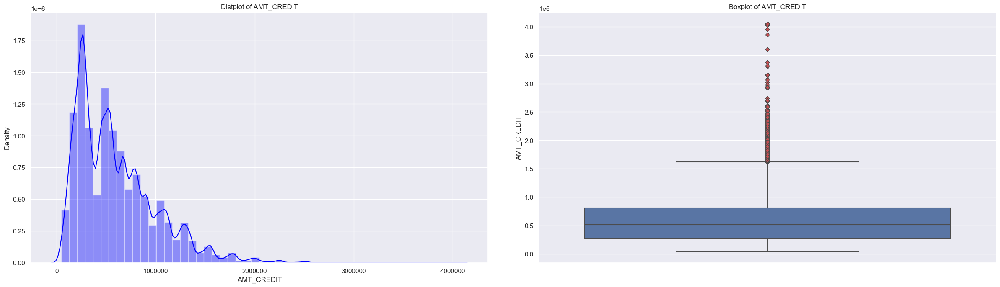

****************************************************************************
Plot for AMT_ANNUITY


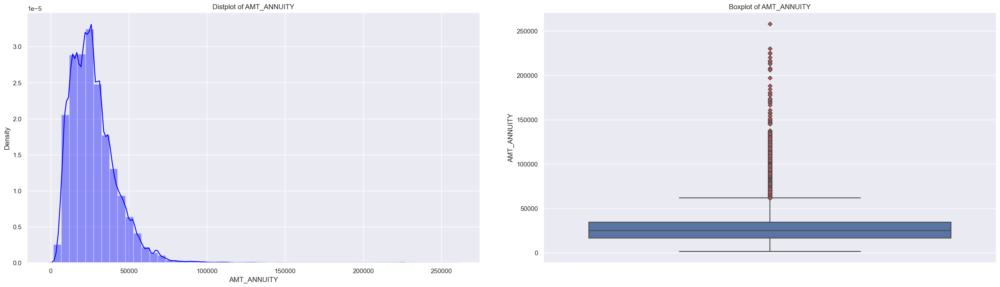

****************************************************************************
Plot for AMT_GOODS_PRICE


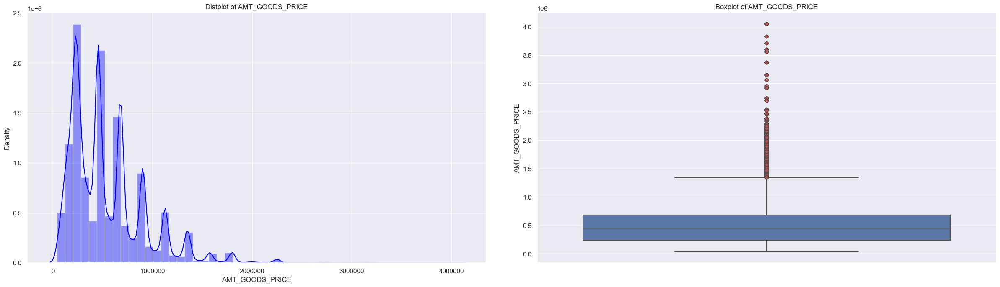

****************************************************************************
Plot for REGION_POPULATION_RELATIVE


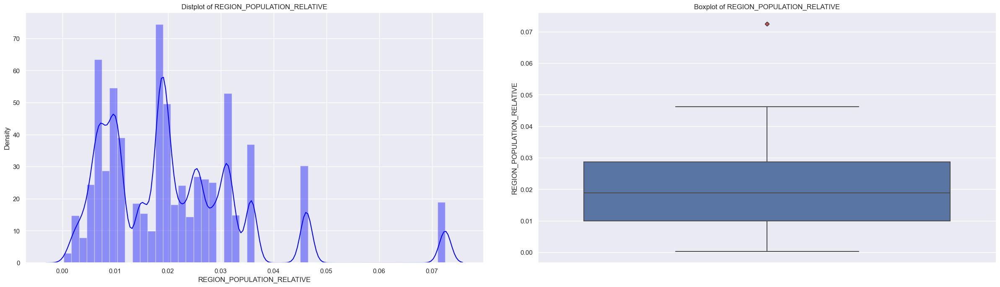

****************************************************************************
Plot for CNT_FAM_MEMBERS


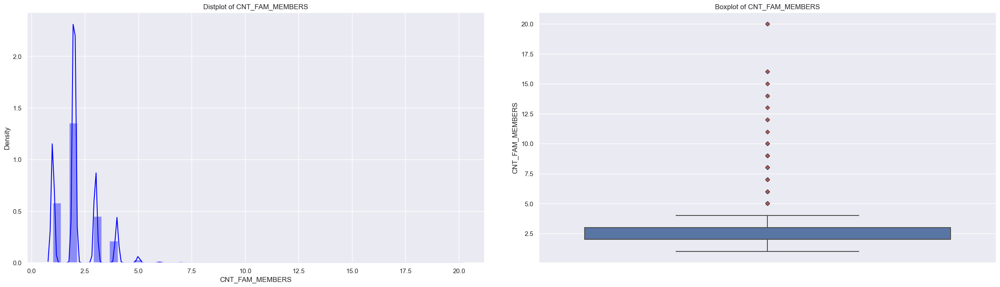

****************************************************************************
Plot for REGION_RATING_CLIENT


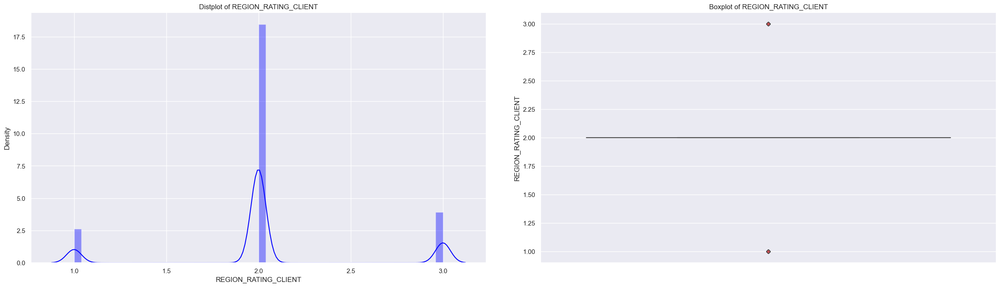

****************************************************************************
Plot for REGION_RATING_CLIENT_W_CITY


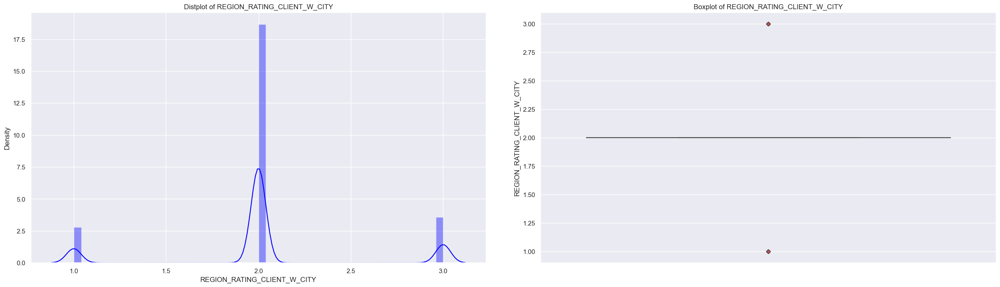

****************************************************************************
Plot for FLAG_MOBIL


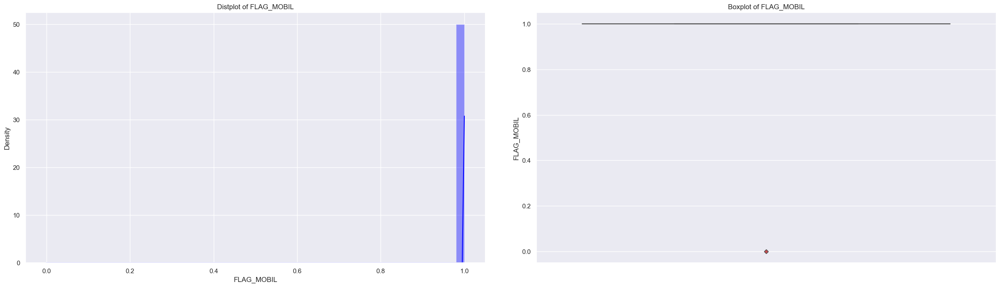

****************************************************************************
Plot for FLAG_EMP_PHONE


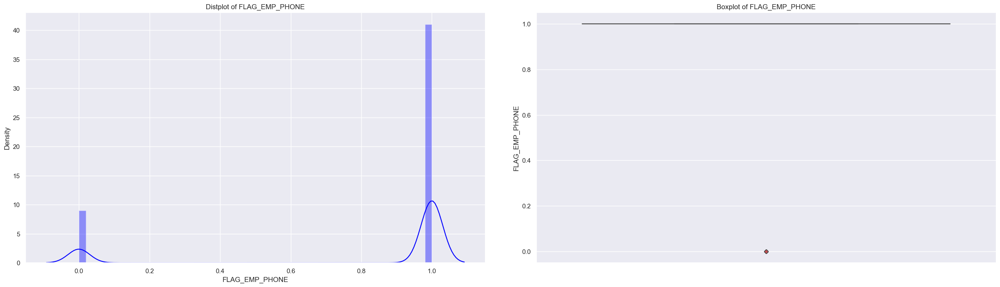

****************************************************************************
Plot for FLAG_WORK_PHONE


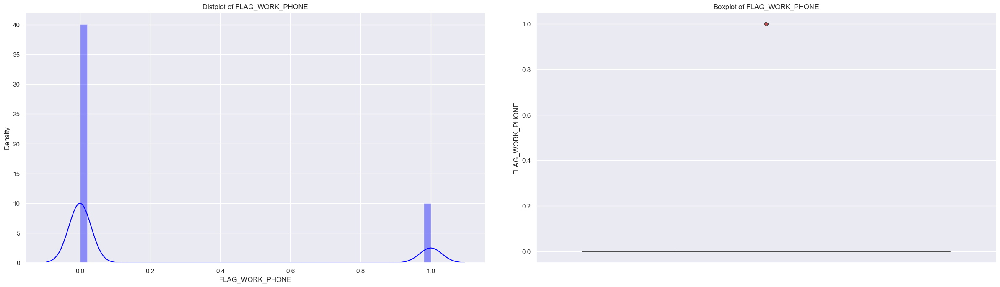

****************************************************************************
Plot for HOUR_APPR_PROCESS_START


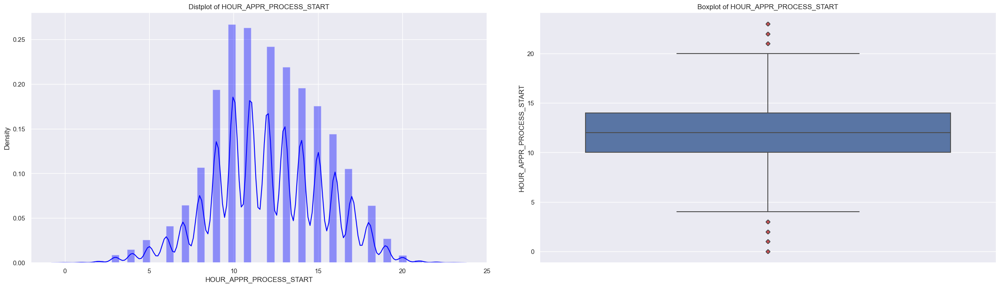

****************************************************************************
Plot for REG_REGION_NOT_LIVE_REGION


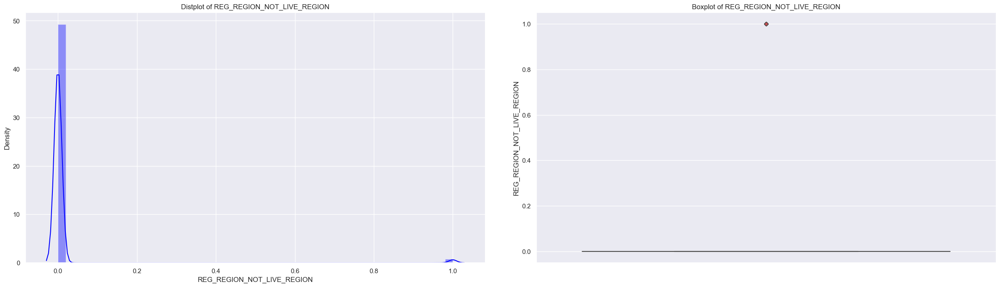

****************************************************************************
Plot for REG_REGION_NOT_WORK_REGION


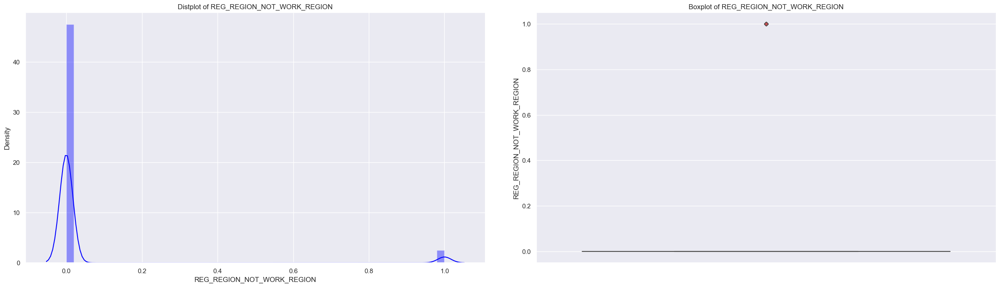

****************************************************************************
Plot for LIVE_REGION_NOT_WORK_REGION


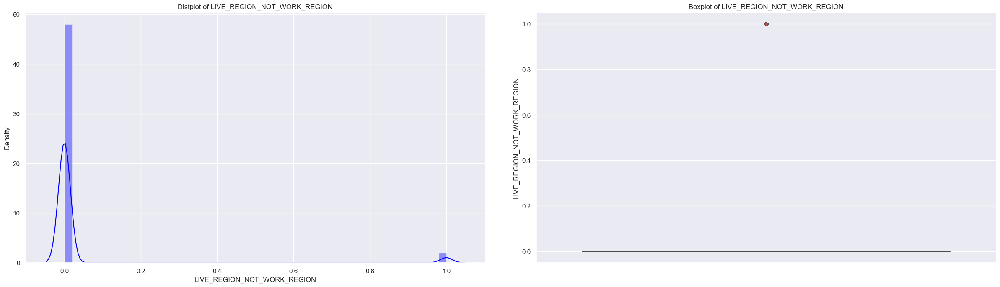

****************************************************************************
Plot for REG_CITY_NOT_LIVE_CITY


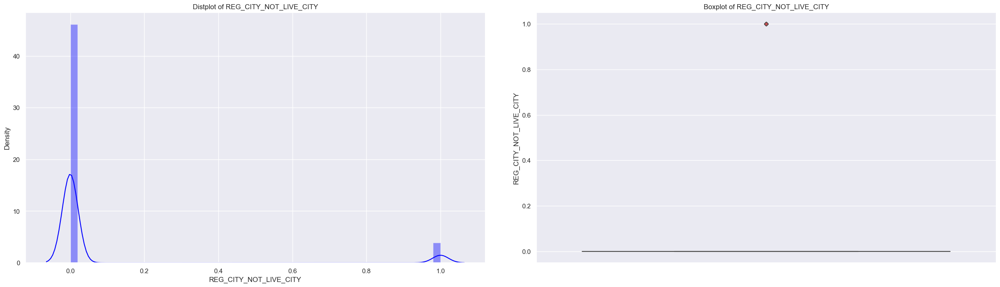

****************************************************************************
Plot for REG_CITY_NOT_WORK_CITY


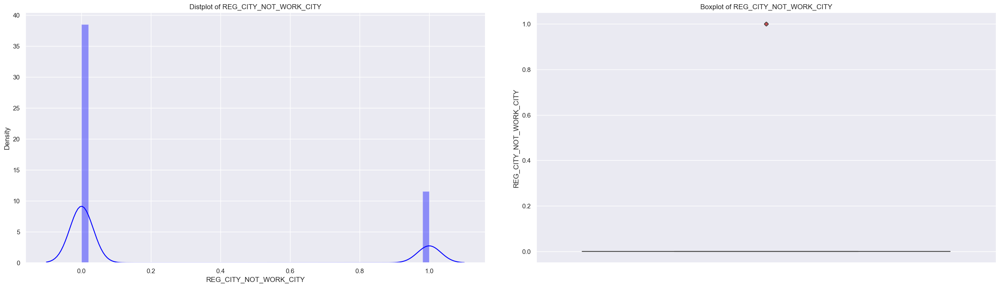

****************************************************************************
Plot for LIVE_CITY_NOT_WORK_CITY


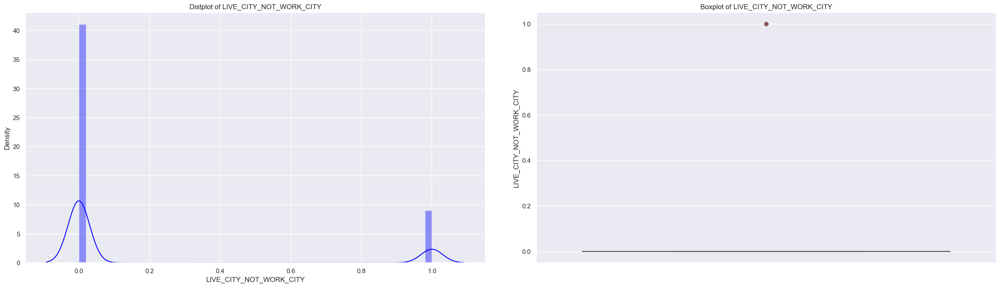

****************************************************************************
Plot for EXT_SOURCE_2


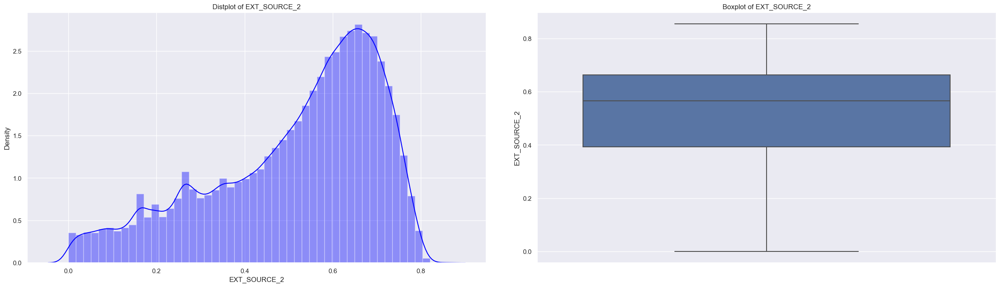

****************************************************************************
Plot for EXT_SOURCE_3


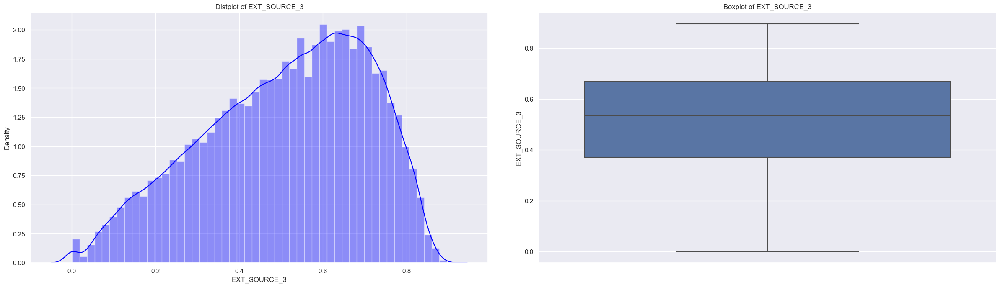

****************************************************************************
Plot for OBS_30_CNT_SOCIAL_CIRCLE


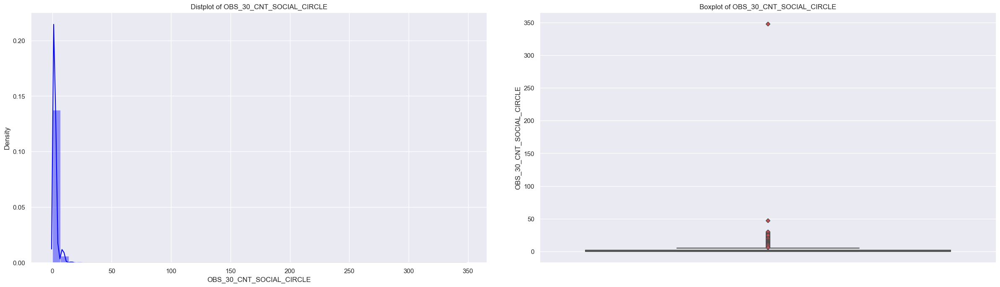

****************************************************************************
Plot for DEF_30_CNT_SOCIAL_CIRCLE


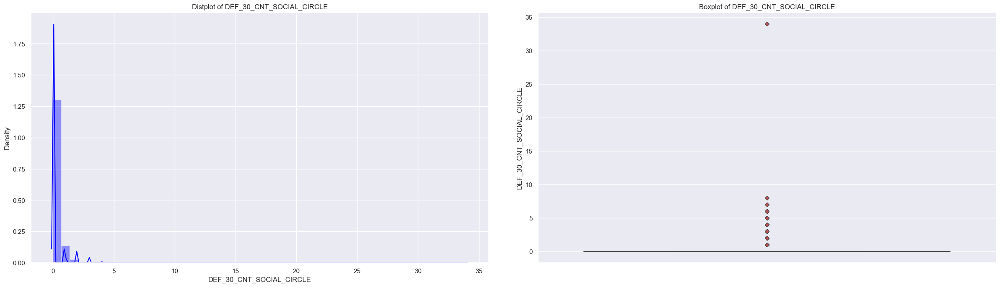

****************************************************************************
Plot for OBS_60_CNT_SOCIAL_CIRCLE


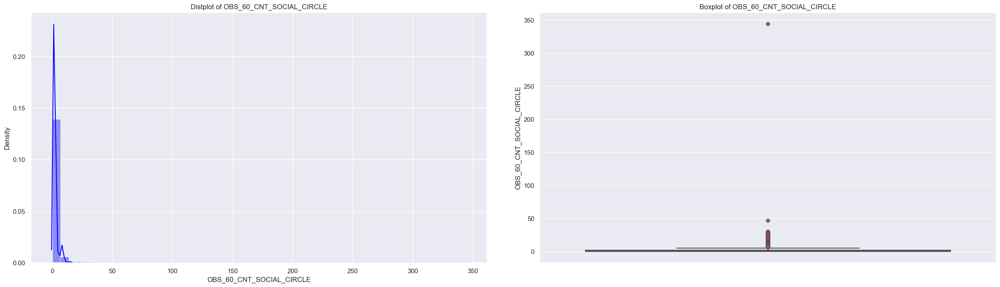

****************************************************************************
Plot for DEF_60_CNT_SOCIAL_CIRCLE


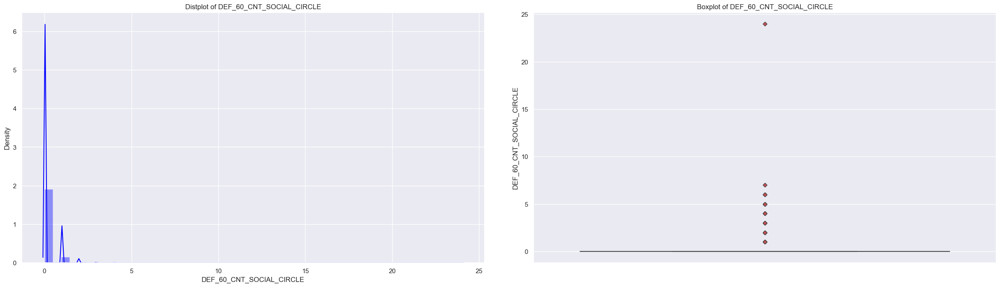

****************************************************************************
Plot for DAYS_LAST_PHONE_CHANGE


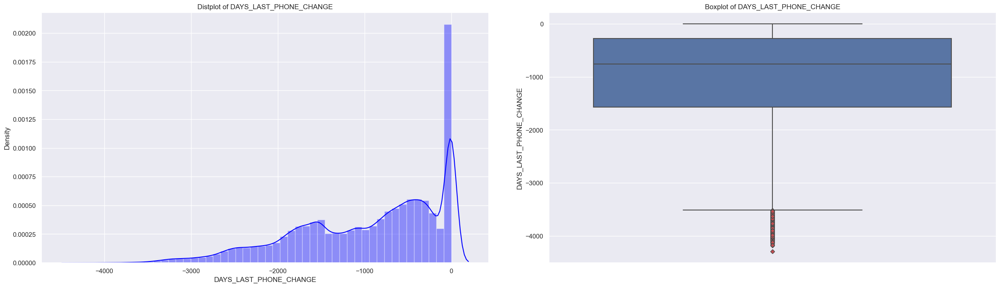

****************************************************************************
Plot for AMT_REQ_CREDIT_BUREAU_HOUR


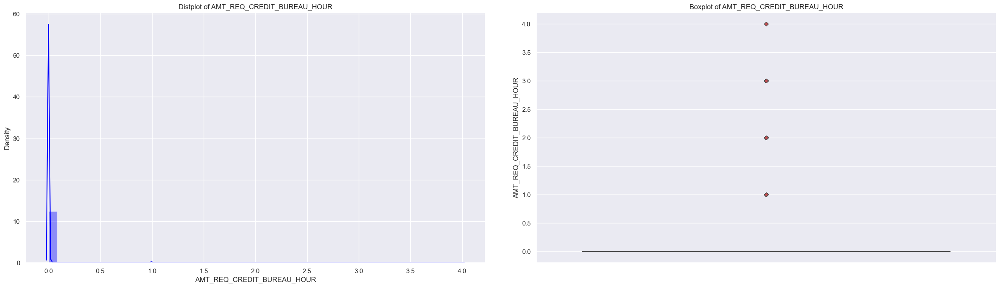

****************************************************************************
Plot for AMT_REQ_CREDIT_BUREAU_DAY


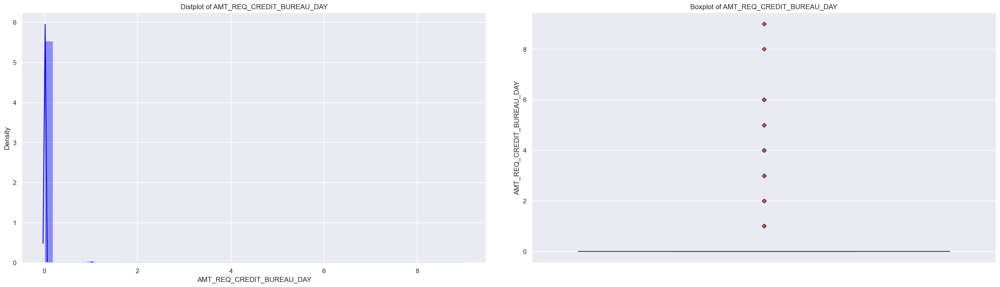

****************************************************************************
Plot for AMT_REQ_CREDIT_BUREAU_WEEK


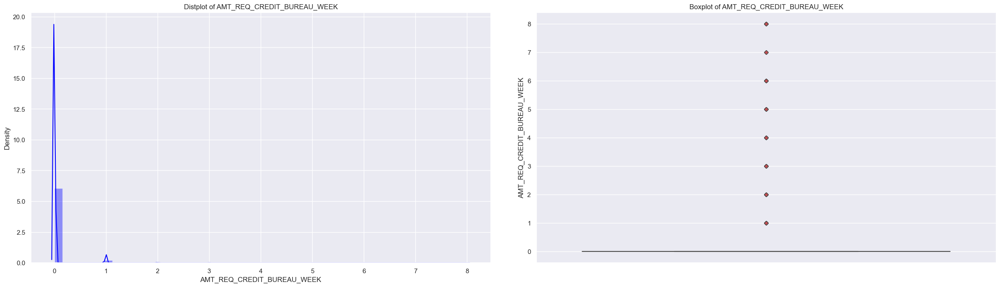

****************************************************************************
Plot for AMT_REQ_CREDIT_BUREAU_MON


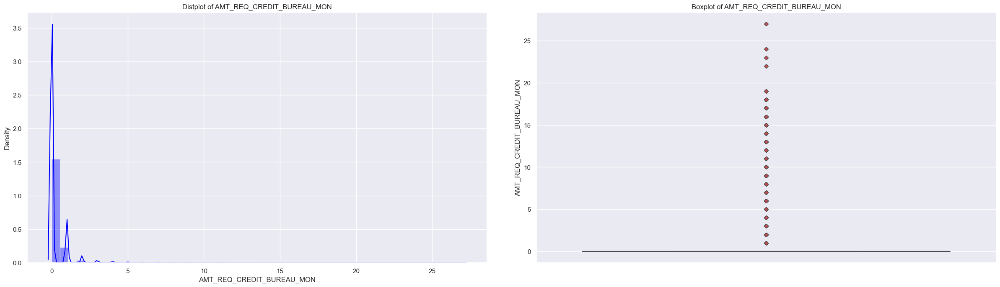

****************************************************************************
Plot for AMT_REQ_CREDIT_BUREAU_QRT


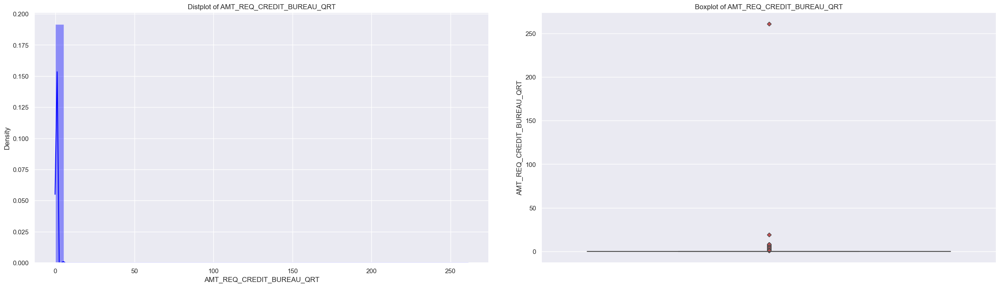

****************************************************************************
Plot for AMT_REQ_CREDIT_BUREAU_YEAR


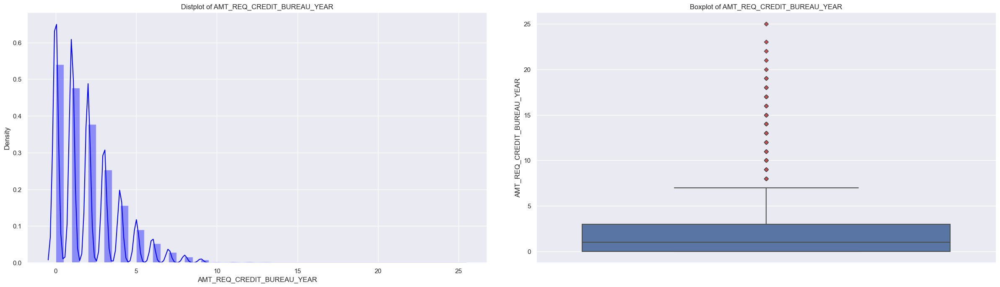

****************************************************************************
Plot for Age_Years


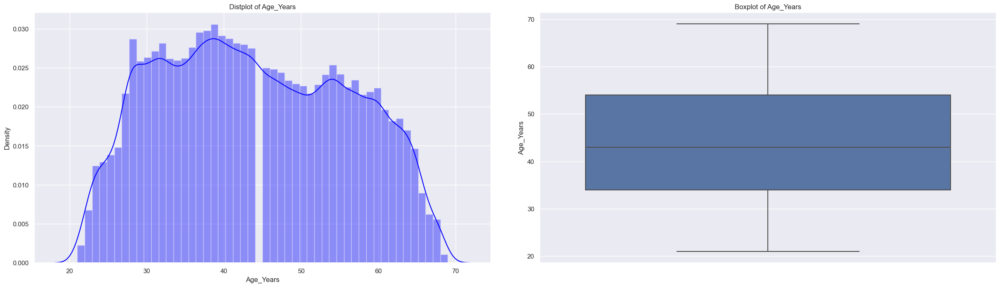

****************************************************************************
Plot for Years_ID_PUBLISH


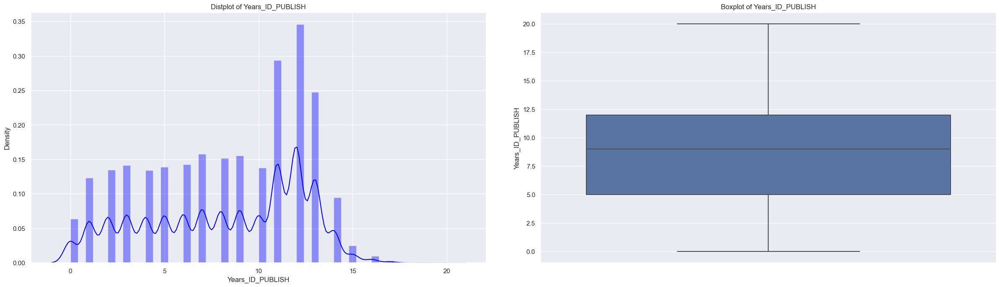

****************************************************************************
Plot for Years_EMPLOYED


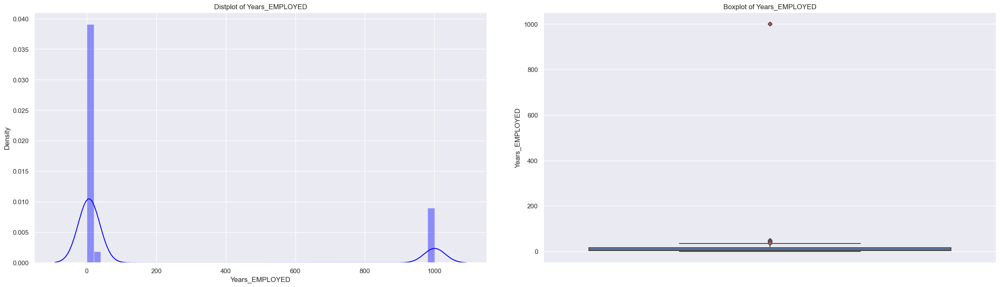

****************************************************************************


In [96]:
for column in numerical:
    print('Plot for', column)
    outlier(application_data,column)
    print('****************************************************************************')
    
    #Inference from each column is mentioned below. 

- AMT_CREDIT , AMT_ANNUITY , AMT_GOODS_PRICE : These seems to be continuous data 
<br/>
<br/>
- REGION_POPULATION_RELATIVE , REGION_RATING_CLIENT , REGION_RATING_CLIENT_W_CITY : This data set shows outliers 
<br/>
<br/>
- CNT_FAM_MEMBERS : This graph looks similar to count of children 
<br/>
<br/>
- FLAG_MOBIL : data with 0 may be the people who do not have a mobile phone 
- FLAG_EMP_PHONE,FLAG_WORK_PHONE, FLAG_CONT_MOBILE, FLAG_PHONE : These are all boolean values and 1 means they have these phone, 0 means no phone from Employer or self - No outliers 
<br/>
<br/>
- Most of the data point with 0,1 are boolean and can't be considered as outlier
<br/>
<br/>
- DAYS_LAST_PHONE_CHANGE : Has negative days it needs to be converted to positive 
<br/>
<br/>
- Years_EMPLOYED :  Has outliers as pensioners and few students is shown with 1000 years+ years employed. These are outliers. 

In [97]:
application_data.REGION_POPULATION_RELATIVE.describe()

count   307511.00
mean         0.02
std          0.01
min          0.00
25%          0.01
50%          0.02
75%          0.03
max          0.07
Name: REGION_POPULATION_RELATIVE, dtype: float64

In [98]:
application_data.DAYS_LAST_PHONE_CHANGE.describe()

count   307510.00
mean      -962.86
std        826.81
min      -4292.00
25%      -1570.00
50%       -757.00
75%       -274.00
max          0.00
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

In [99]:
application_data.DAYS_LAST_PHONE_CHANGE = application_data.DAYS_LAST_PHONE_CHANGE.apply(lambda x: abs(x))

In [100]:
application_data.DAYS_LAST_PHONE_CHANGE.describe()

count   307510.00
mean       962.86
std        826.81
min          0.00
25%        274.00
50%        757.00
75%       1570.00
max       4292.00
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

In [101]:
application_data.AMT_ANNUITY.describe()

count   307499.00
mean     27108.57
std      14493.74
min       1615.50
25%      16524.00
50%      24903.00
75%      34596.00
max     258025.50
Name: AMT_ANNUITY, dtype: float64

In [102]:
# Convert AMT_ANNUITY to different caterories 

def annuity (i):
    if i <= 25000:
        return 'Low'
    elif i<= 50000:
        return 'Medium'
    elif i <= 100000:
        return 'High'
    else:
        return 'Very High'
 
application_data['Annuity_Amt_Range'] = application_data.AMT_ANNUITY.apply(lambda i: annuity(i))

In [103]:
application_data.Annuity_Amt_Range.value_counts()

Low          154867
Medium       131335
High          20792
Very High       517
Name: Annuity_Amt_Range, dtype: int64

In [104]:
application_data.Annuity_Amt_Range.value_counts(normalize = True)*100

Low         50.36
Medium      42.71
High         6.76
Very High    0.17
Name: Annuity_Amt_Range, dtype: float64

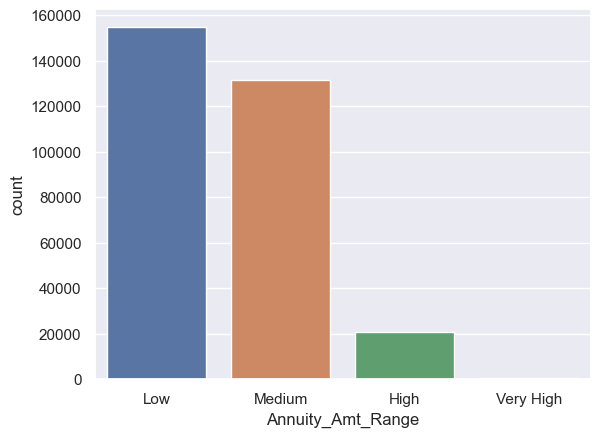

In [105]:
sns.countplot(data = application_data , x = 'Annuity_Amt_Range');

- More than 50% of the clients fall under low Annuity Amount Range and 42% under medium range.
<br/>
<br/>
- 6% fall under high annuity range and 0.1% under very high range which is greater than 100000


# Univariate Analysis - Numeric Data 

Plot of CNT_CHILDREN


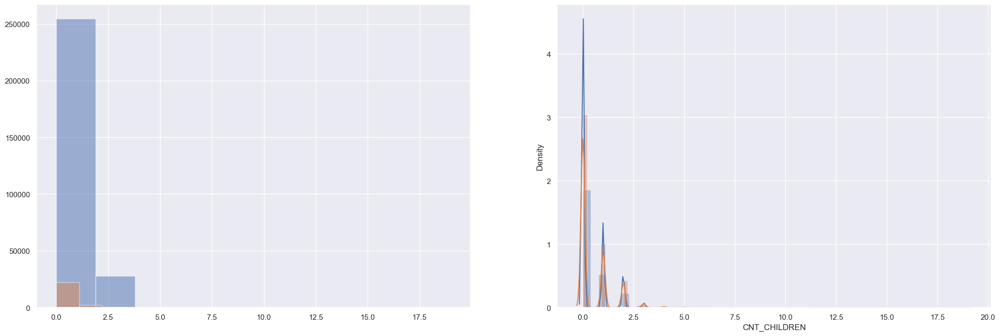

**************************************************************************************
Plot of AMT_INCOME_TOTAL


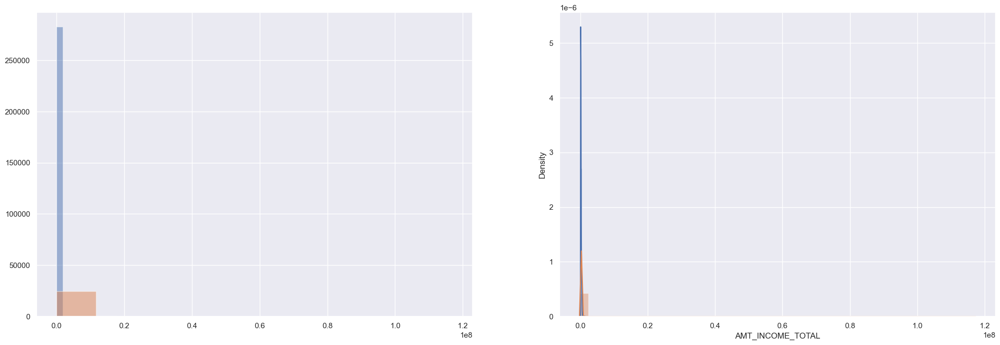

**************************************************************************************
Plot of AMT_CREDIT


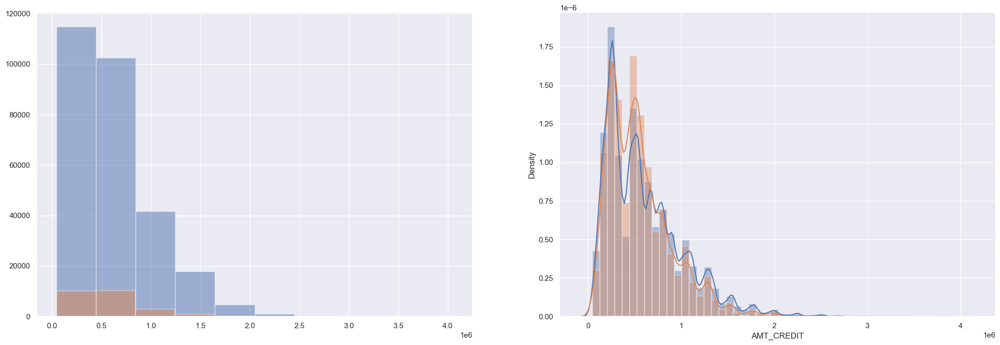

**************************************************************************************
Plot of AMT_ANNUITY


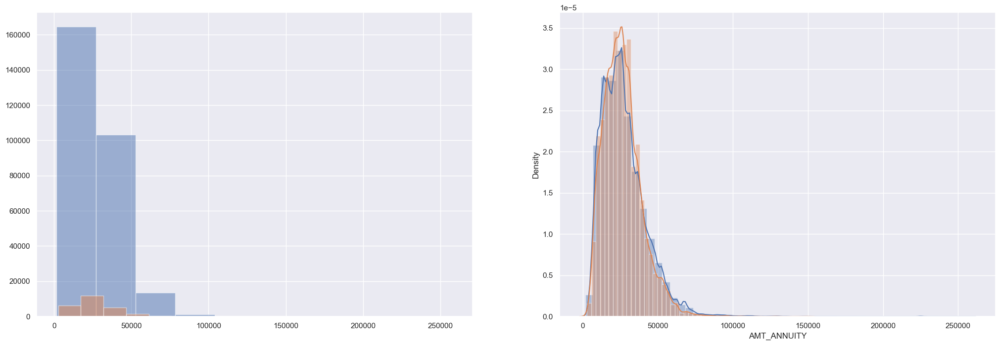

**************************************************************************************
Plot of AMT_GOODS_PRICE


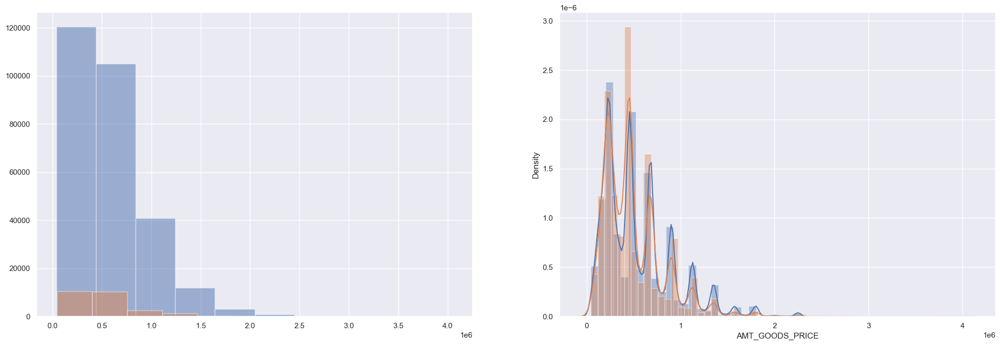

**************************************************************************************
Plot of REGION_POPULATION_RELATIVE


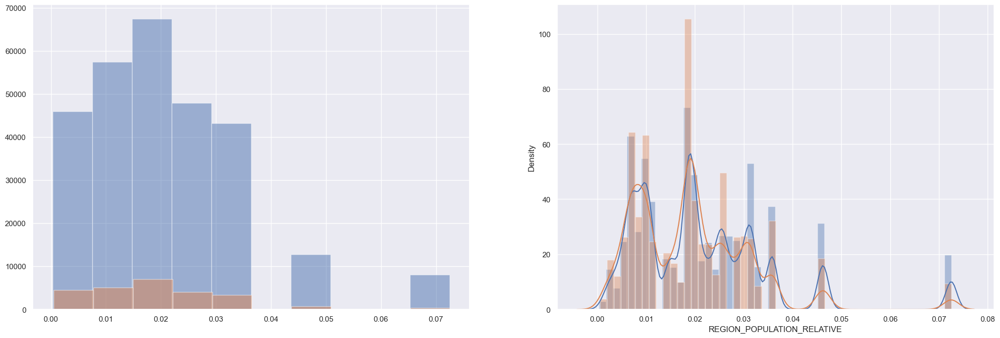

**************************************************************************************
Plot of CNT_FAM_MEMBERS


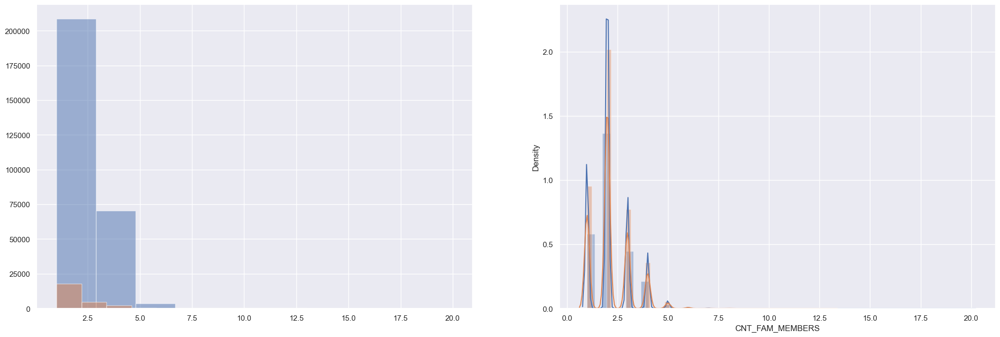

**************************************************************************************
Plot of REGION_RATING_CLIENT


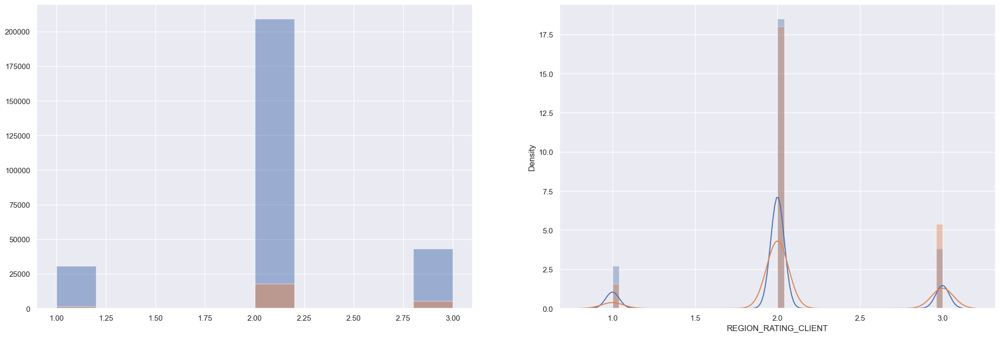

**************************************************************************************
Plot of REGION_RATING_CLIENT_W_CITY


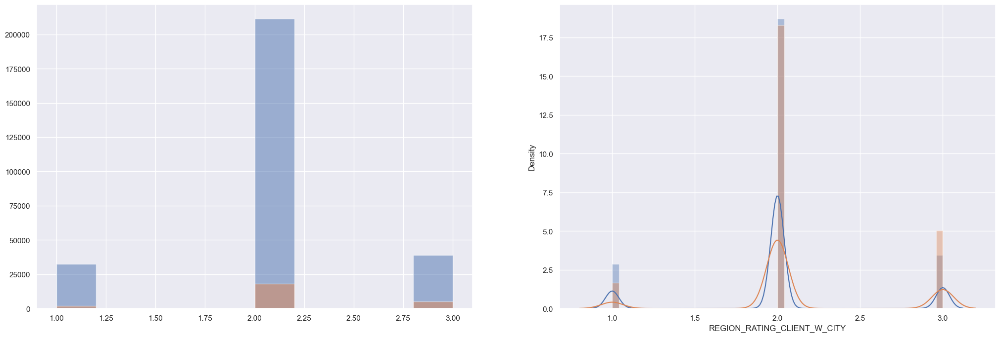

**************************************************************************************
Plot of FLAG_MOBIL


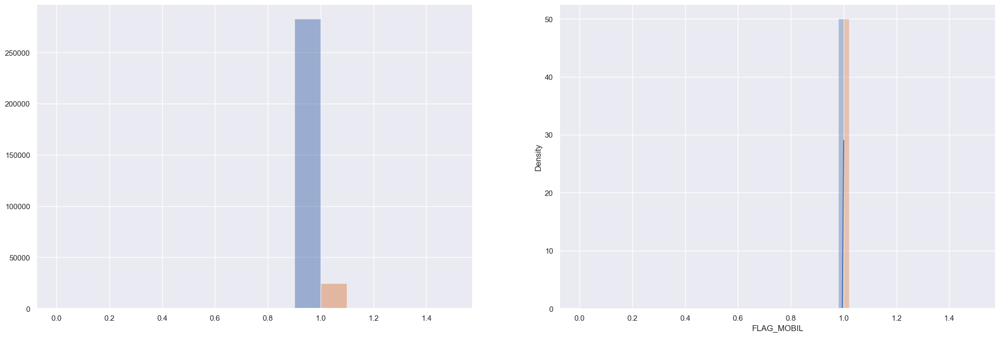

**************************************************************************************
Plot of FLAG_EMP_PHONE


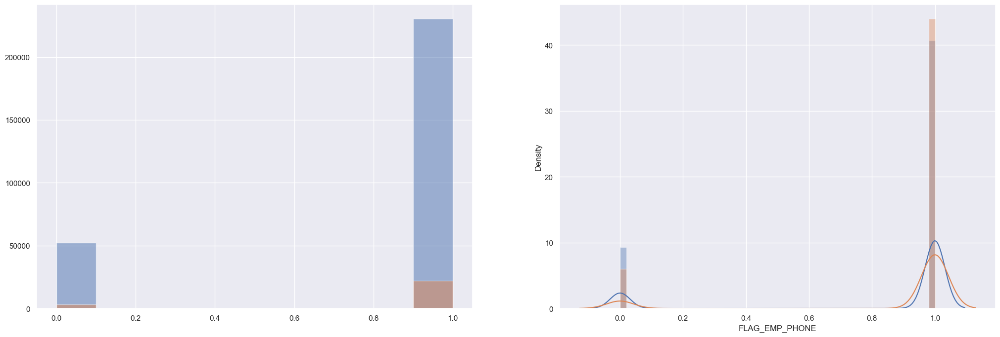

**************************************************************************************
Plot of FLAG_WORK_PHONE


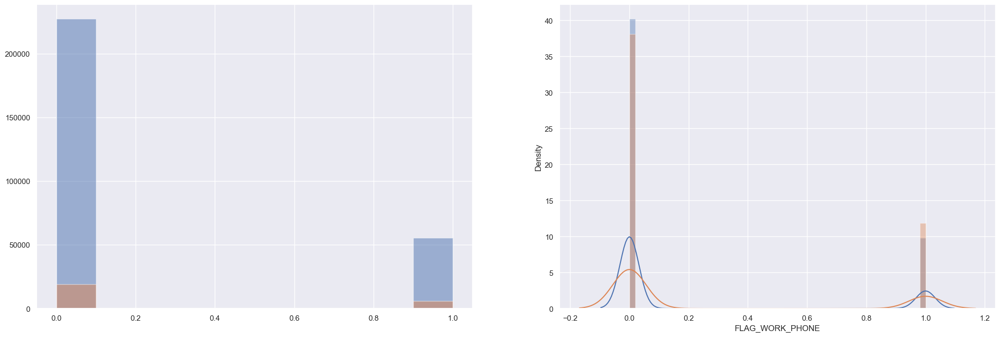

**************************************************************************************
Plot of HOUR_APPR_PROCESS_START


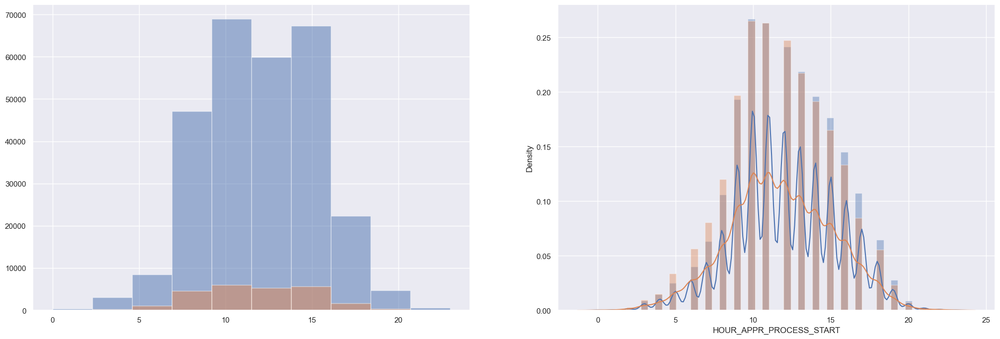

**************************************************************************************
Plot of REG_REGION_NOT_LIVE_REGION


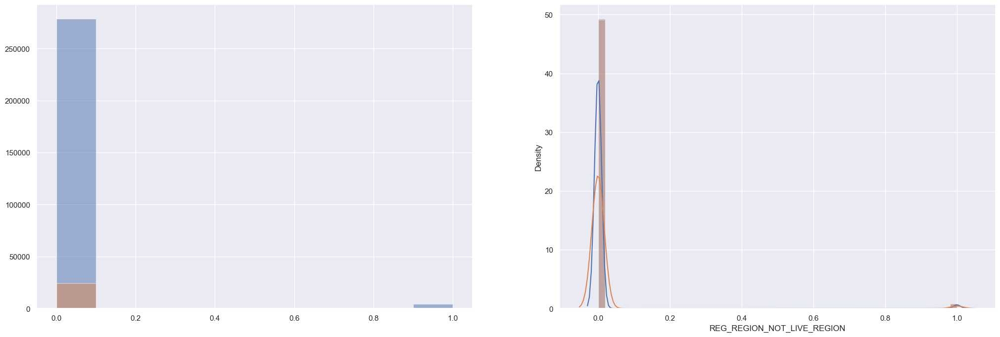

**************************************************************************************
Plot of REG_REGION_NOT_WORK_REGION


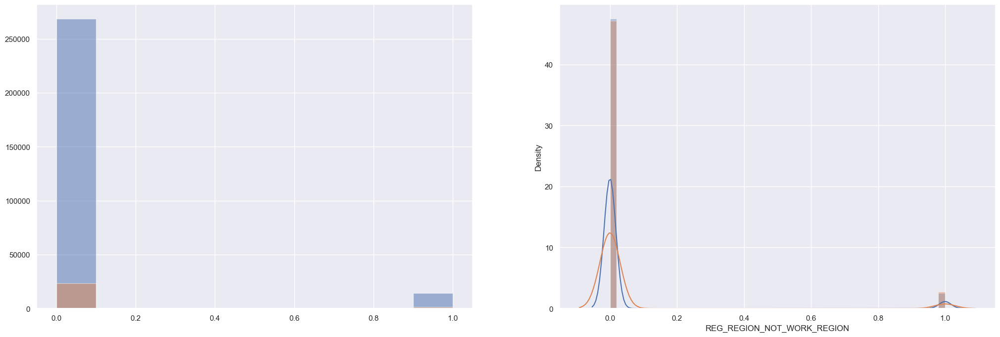

**************************************************************************************
Plot of LIVE_REGION_NOT_WORK_REGION


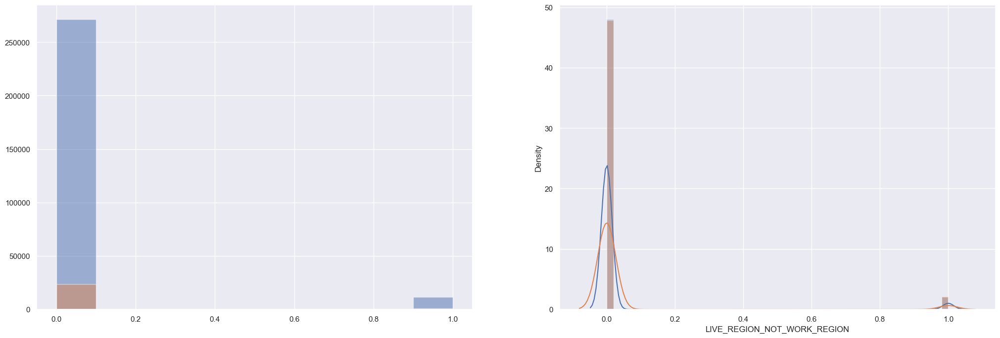

**************************************************************************************
Plot of REG_CITY_NOT_LIVE_CITY


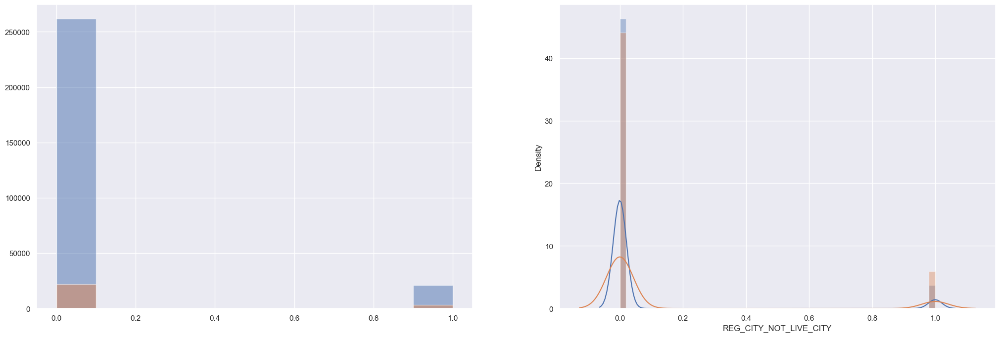

**************************************************************************************
Plot of REG_CITY_NOT_WORK_CITY


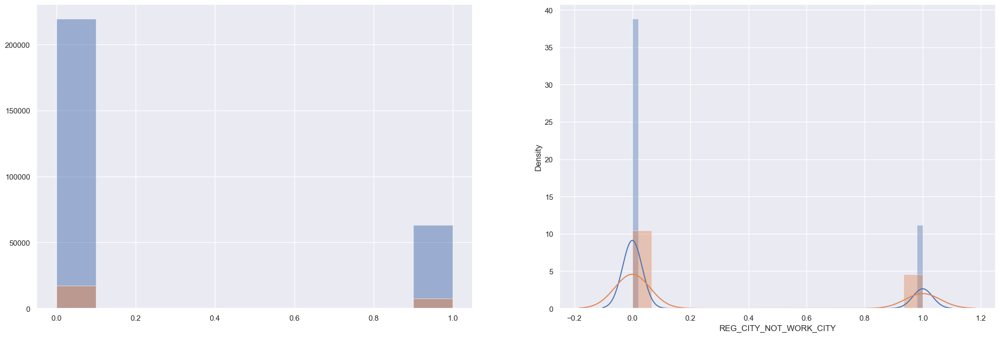

**************************************************************************************
Plot of LIVE_CITY_NOT_WORK_CITY


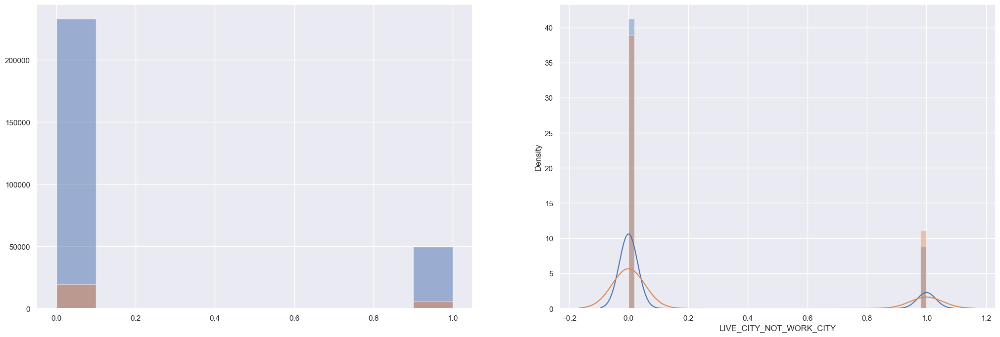

**************************************************************************************
Plot of EXT_SOURCE_2


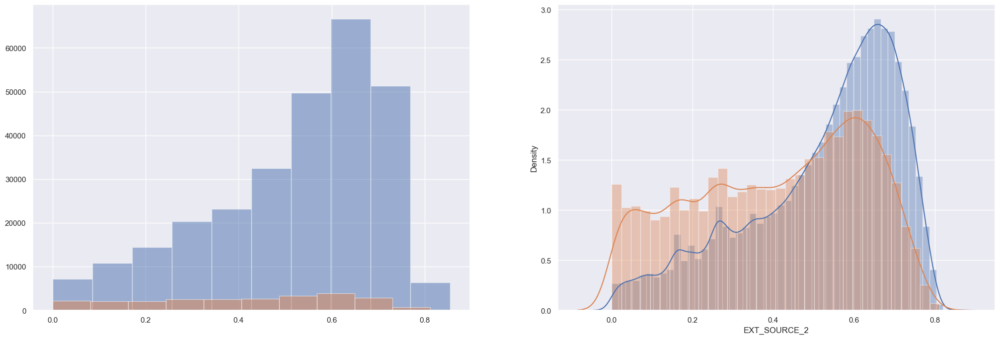

**************************************************************************************
Plot of EXT_SOURCE_3


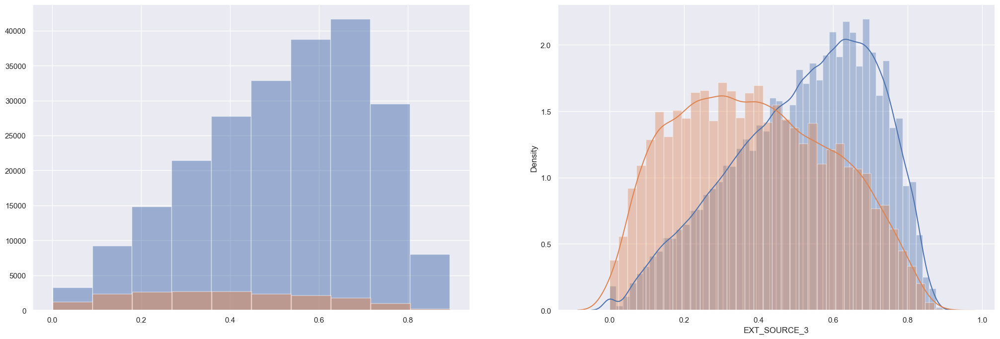

**************************************************************************************
Plot of OBS_30_CNT_SOCIAL_CIRCLE


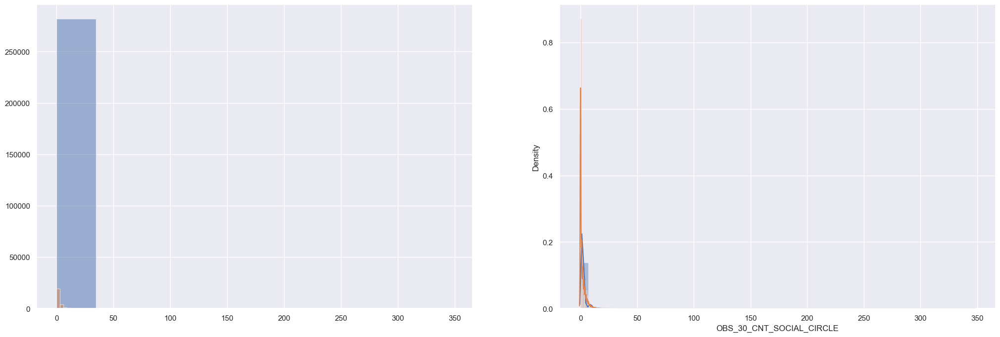

**************************************************************************************
Plot of DEF_30_CNT_SOCIAL_CIRCLE


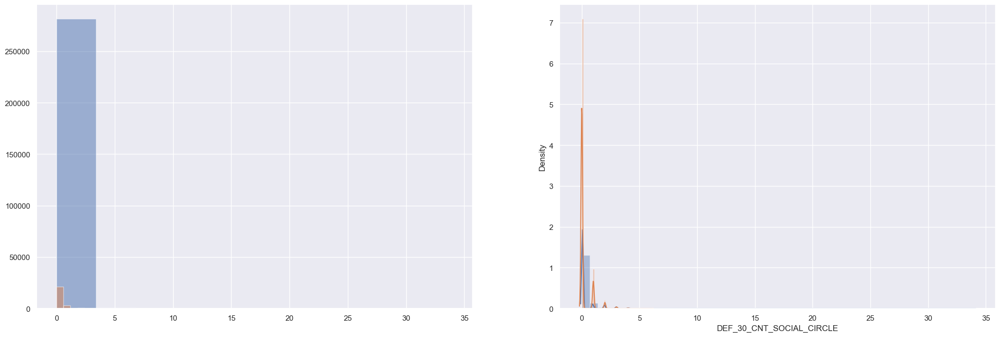

**************************************************************************************
Plot of OBS_60_CNT_SOCIAL_CIRCLE


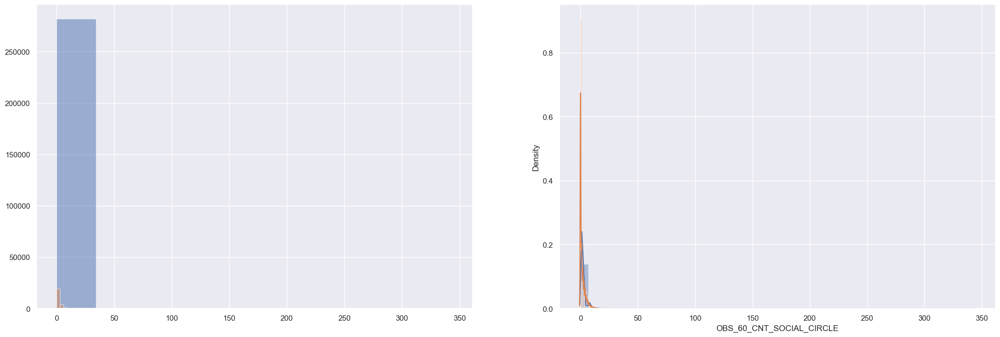

**************************************************************************************
Plot of DEF_60_CNT_SOCIAL_CIRCLE


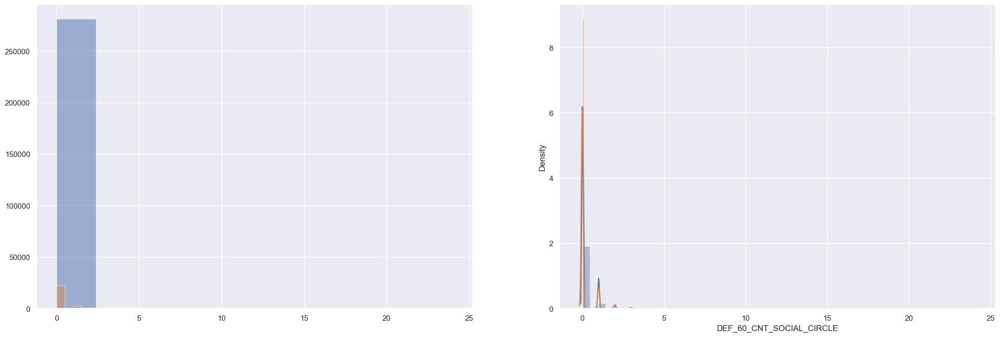

**************************************************************************************
Plot of DAYS_LAST_PHONE_CHANGE


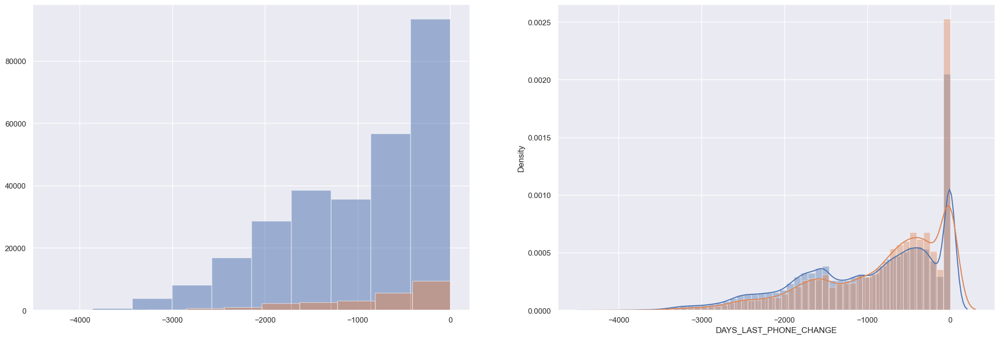

**************************************************************************************
Plot of AMT_REQ_CREDIT_BUREAU_HOUR


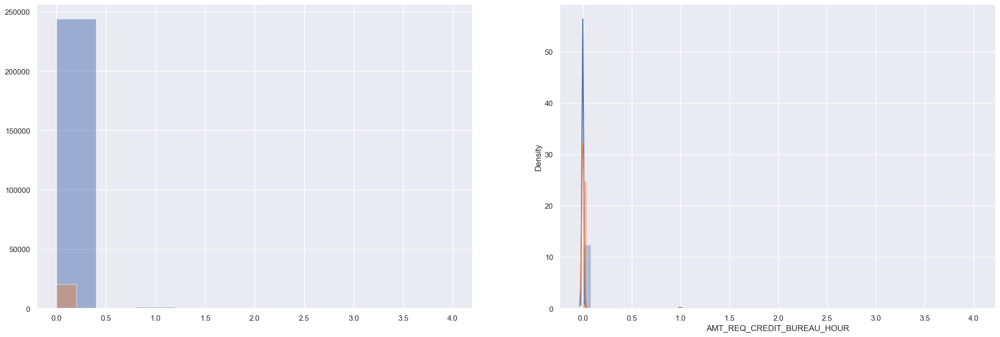

**************************************************************************************
Plot of AMT_REQ_CREDIT_BUREAU_DAY


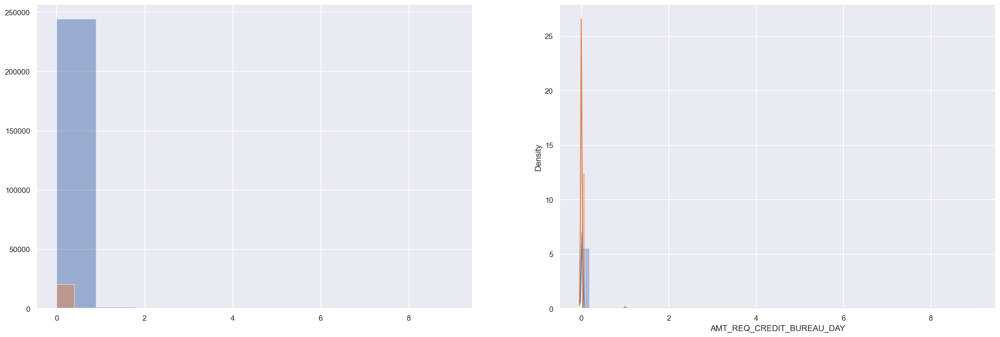

**************************************************************************************
Plot of AMT_REQ_CREDIT_BUREAU_WEEK


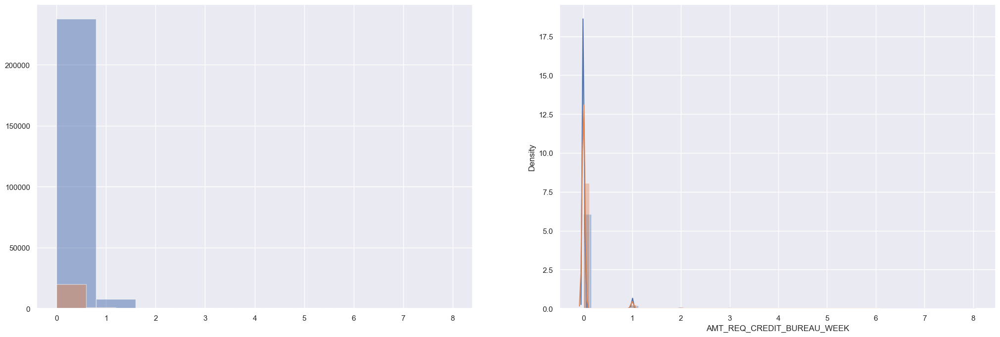

**************************************************************************************
Plot of AMT_REQ_CREDIT_BUREAU_MON


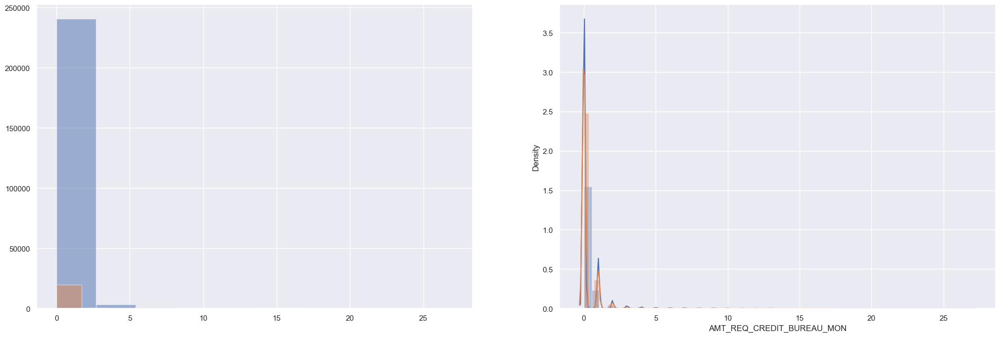

**************************************************************************************
Plot of AMT_REQ_CREDIT_BUREAU_QRT


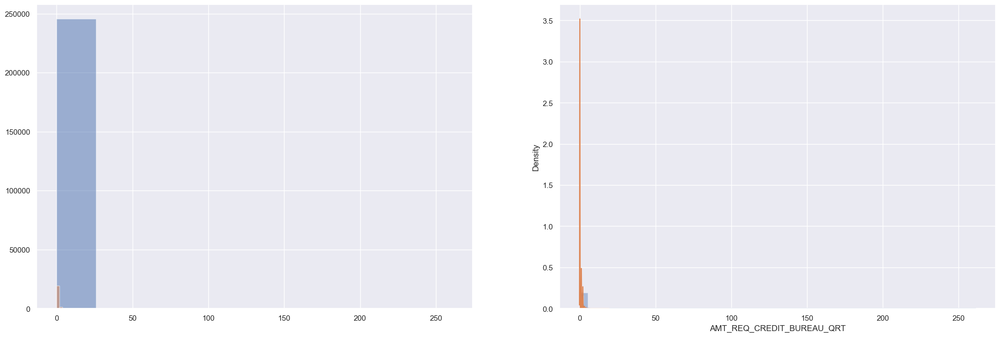

**************************************************************************************
Plot of AMT_REQ_CREDIT_BUREAU_YEAR


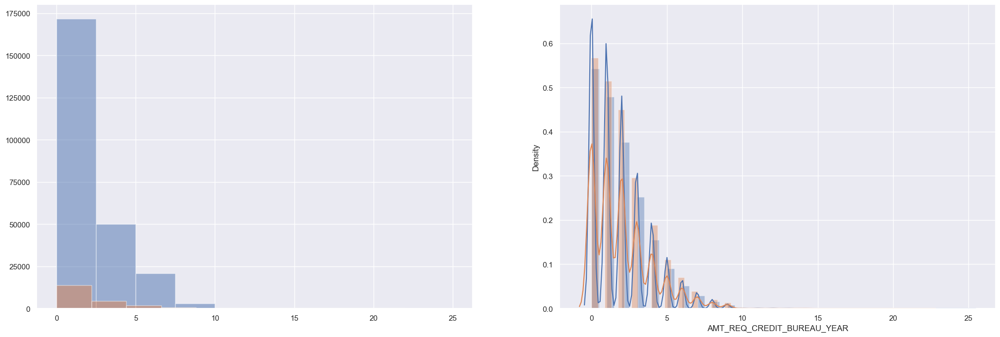

**************************************************************************************
Plot of Age_Years


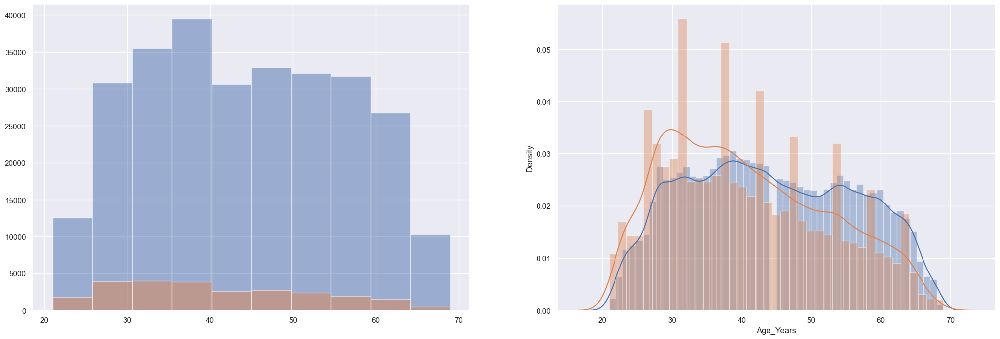

**************************************************************************************
Plot of Years_ID_PUBLISH


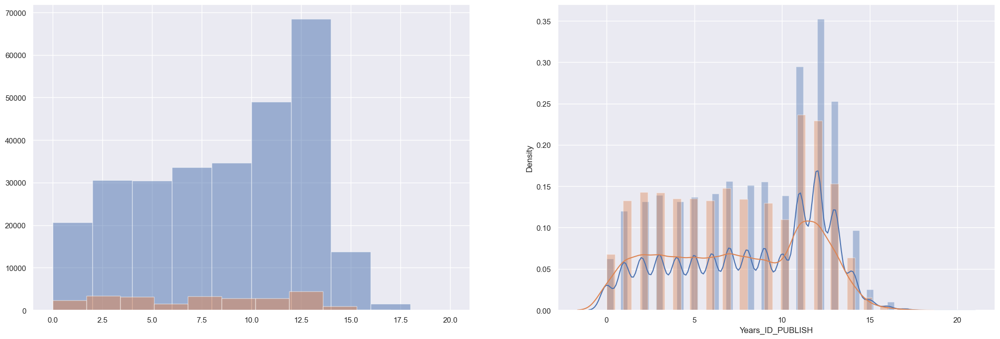

**************************************************************************************
Plot of Years_EMPLOYED


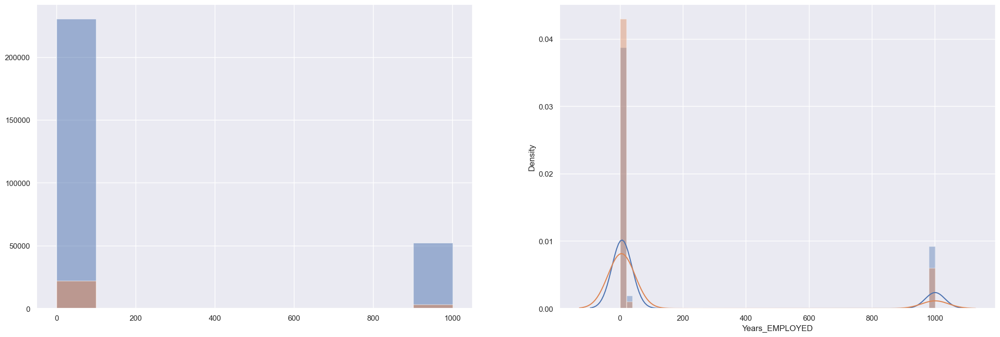

**************************************************************************************


In [106]:
numerical= ['CNT_CHILDREN', 'AMT_INCOME_TOTAL','AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY','FLAG_MOBIL', 'FLAG_EMP_PHONE',
       'FLAG_WORK_PHONE', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'Age_Years',
       'Years_ID_PUBLISH', 'Years_EMPLOYED']


for col in numerical:
    title = "Plot of "+col
    print(title)
    
    plt.subplots(1,2 ,figsize = (25,8))

    plt.subplot(121)
    plt.hist(df0[col], alpha=0.5, label='0')
    plt.hist(df1[col], alpha=0.5, label='1')
    
    
    plt.subplot(122)
    sns.distplot(df0[col].dropna(), label='0')
    sns.distplot(df1[col].dropna(),  label='1')
    
    plt.show()
    print("**************************************************************************************")

 - We can see difference in plots for the columns AMT_CREDIT , AMT_ANNUITY , AMT_GOODS_PRICE, REGION_POPULATION_RELATIVE , HOURS_APPR_PROCESS_START , EXT_SOUCE_2 , EXT_SOURCE_3 , AMT_REQ_CREDIT_BUREAU_YEAR and  Age_Years

# Analysing Previous Application Dataset

In [107]:
previous_application.shape

(1670214, 37)

In [108]:
previous_application.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.43,17145.00,17145.00,0.00,17145.00,SATURDAY,15,Y,1,0.00,0.18,0.87,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.00,middle,POS mobile with interest,365243.00,-42.00,300.00,-42.00,-37.00,0.00
1,2802425,108129,Cash loans,25188.62,607500.00,679671.00,NaN,607500.00,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.00,low_action,Cash X-Sell: low,365243.00,-134.00,916.00,365243.00,365243.00,1.00
2,2523466,122040,Cash loans,15060.74,112500.00,136444.50,NaN,112500.00,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,high,Cash X-Sell: high,365243.00,-271.00,59.00,365243.00,365243.00,1.00
3,2819243,176158,Cash loans,47041.33,450000.00,470790.00,NaN,450000.00,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,middle,Cash X-Sell: middle,365243.00,-482.00,-152.00,-182.00,-177.00,1.00
4,1784265,202054,Cash loans,31924.40,337500.00,404055.00,NaN,337500.00,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.00,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [109]:
# There are 2 SK_ID  (PREV and CURR)

previous_application.SK_ID_PREV.nunique()


1670214

In [110]:
previous_application.SK_ID_CURR.nunique()

338857

- The difference in unique entries of SK_ID in current and previous application shows that there are duplicate values , may be the client have multiple loans histories.
<br/>
- We will merge the data sets with the common column SK_ID_CURR , we will keep the duplicate SK_ID_PREV as well just to understand if get any pattern for client with multiple loans 

In [111]:
previous_application.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

### Treating missing value in previous application

In [112]:
previous_application.isnull().sum().sort_values(ascending=False)/len(previous_application.index)*100

RATE_INTEREST_PRIVILEGED      99.64
RATE_INTEREST_PRIMARY         99.64
AMT_DOWN_PAYMENT              53.64
RATE_DOWN_PAYMENT             53.64
NAME_TYPE_SUITE               49.12
NFLAG_INSURED_ON_APPROVAL     40.30
DAYS_TERMINATION              40.30
DAYS_LAST_DUE                 40.30
DAYS_LAST_DUE_1ST_VERSION     40.30
DAYS_FIRST_DUE                40.30
DAYS_FIRST_DRAWING            40.30
AMT_GOODS_PRICE               23.08
AMT_ANNUITY                   22.29
CNT_PAYMENT                   22.29
PRODUCT_COMBINATION            0.02
AMT_CREDIT                     0.00
NAME_YIELD_GROUP               0.00
NAME_PORTFOLIO                 0.00
NAME_SELLER_INDUSTRY           0.00
SELLERPLACE_AREA               0.00
CHANNEL_TYPE                   0.00
NAME_PRODUCT_TYPE              0.00
SK_ID_PREV                     0.00
NAME_GOODS_CATEGORY            0.00
NAME_CLIENT_TYPE               0.00
CODE_REJECT_REASON             0.00
SK_ID_CURR                     0.00
DAYS_DECISION               

### Delete columns with more than 40% missing value 

In [113]:
previous_application= previous_application.loc[:,(previous_application.isnull().sum().sort_values(ascending=False)/len(previous_application.index)*100)<40]

In [114]:
previous_application.isnull().sum().sort_values(ascending=False)/len(previous_application.index)*100

AMT_GOODS_PRICE               23.08
AMT_ANNUITY                   22.29
CNT_PAYMENT                   22.29
PRODUCT_COMBINATION            0.02
AMT_CREDIT                     0.00
CODE_REJECT_REASON             0.00
NAME_YIELD_GROUP               0.00
NAME_SELLER_INDUSTRY           0.00
SELLERPLACE_AREA               0.00
CHANNEL_TYPE                   0.00
NAME_PRODUCT_TYPE              0.00
NAME_PORTFOLIO                 0.00
NAME_GOODS_CATEGORY            0.00
NAME_CLIENT_TYPE               0.00
SK_ID_PREV                     0.00
NAME_PAYMENT_TYPE              0.00
SK_ID_CURR                     0.00
NAME_CONTRACT_STATUS           0.00
NAME_CASH_LOAN_PURPOSE         0.00
NFLAG_LAST_APPL_IN_DAY         0.00
FLAG_LAST_APPL_PER_CONTRACT    0.00
HOUR_APPR_PROCESS_START        0.00
WEEKDAY_APPR_PROCESS_START     0.00
AMT_APPLICATION                0.00
NAME_CONTRACT_TYPE             0.00
DAYS_DECISION                  0.00
dtype: float64

In [115]:
# Missin Value counts

# AMT_CREDIT                          1
# PRODUCT_COMBINATION               346
# CNT_PAYMENT                    372230
# AMT_ANNUITY                    372235
# AMT_GOODS_PRICE                385515

#### Analysis of AMT_GOODS_PRICE

In [116]:
round(previous_application.AMT_GOODS_PRICE.describe(),2)

count   1284699.00
mean     227847.28
std      315396.56
min           0.00
25%       50841.00
50%      112320.00
75%      234000.00
max     6905160.00
Name: AMT_GOODS_PRICE, dtype: float64

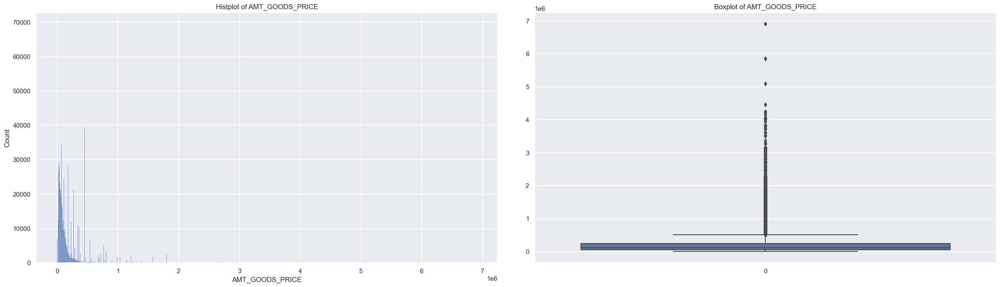

In [117]:
plt.subplots(1,2 ,figsize = (25,8))

plt.subplot(121)
sns.histplot(previous_application.AMT_GOODS_PRICE)
pltname = 'Histplot of ' + 'AMT_GOODS_PRICE'
plt.title(pltname)

plt.subplot(122)
sns.boxplot(previous_application.AMT_GOODS_PRICE)
pltname = 'Boxplot of ' + 'AMT_GOODS_PRICE'
plt.title(pltname)

plt.tight_layout(pad = 4)
plt.show()

In [118]:
previous_application.AMT_GOODS_PRICE.isnull().sum()

385515

- There are 23% missing values in AMT_GOODS_PRICE , we can impute with median 234000 if required. But as the missing % is more than 23% it will be better to leave it as it is.
- Data seems continuous as per the box plot , so we don't need to treat outliers

#### Analysis of AMT_ANNUITY

In [119]:
round(previous_application.AMT_ANNUITY.describe(),2)

count   1297979.00
mean      15955.12
std       14782.14
min           0.00
25%        6321.78
50%       11250.00
75%       20658.42
max      418058.14
Name: AMT_ANNUITY, dtype: float64

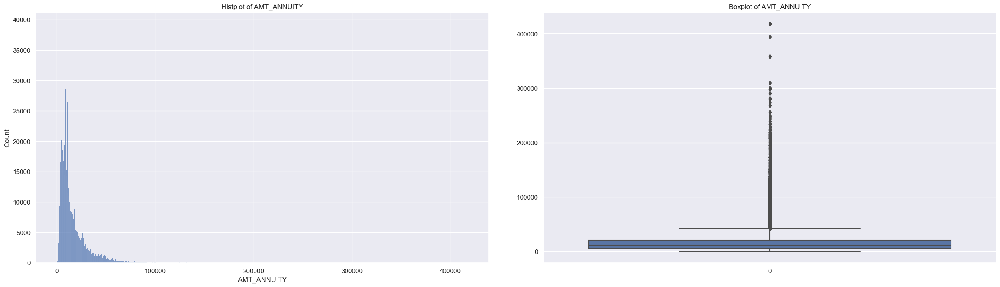

In [120]:
plt.subplots(1,2 ,figsize = (25,8))

plt.subplot(121)
sns.histplot(previous_application.AMT_ANNUITY)
pltname = 'Histplot of ' + 'AMT_ANNUITY'
plt.title(pltname)

plt.subplot(122)
sns.boxplot(previous_application.AMT_ANNUITY)
pltname = 'Boxplot of ' + 'AMT_ANNUITY'
plt.title(pltname)

plt.tight_layout(pad = 4)
plt.show()

- There are 22% missing values in AMT_ANNUITY , we can impute with median 11250 if required. But as the missing % is more than 22% it will be better to leave it as it is.
- Data seems continuous as per the box plot , so we don't need to treat outliers

#### Analysis of CNT_PAYMENT

Term of previous credit at application of the previous application

In [121]:
round(previous_application.CNT_PAYMENT.describe(),2)

count   1297984.00
mean         16.05
std          14.57
min           0.00
25%           6.00
50%          12.00
75%          24.00
max          84.00
Name: CNT_PAYMENT, dtype: float64

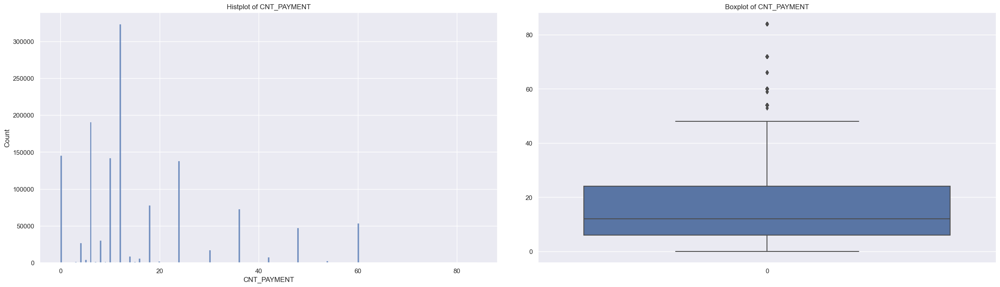

In [122]:
plt.subplots(1,2 ,figsize = (25,8))

plt.subplot(121)
sns.histplot(previous_application.CNT_PAYMENT)
pltname = 'Histplot of ' + 'CNT_PAYMENT'
plt.title(pltname)

plt.subplot(122)
sns.boxplot(previous_application.CNT_PAYMENT)
pltname = 'Boxplot of ' + 'CNT_PAYMENT'
plt.title(pltname)

plt.tight_layout(pad = 4)
plt.show()

- There are 22% missing data in CNT_PAYMENT, since term of previous application will be specific to every client and the misisng % is more than 22% it is better not to impute. If required median(12) van be used for imputation. 
- Data seems continuos and no outlier. 


#### Analysis of PRODUCT_COMBINATION

In [123]:
previous_application.PRODUCT_COMBINATION.value_counts()

Cash                              285990
POS household with interest       263622
POS mobile with interest          220670
Cash X-Sell: middle               143883
Cash X-Sell: low                  130248
Card Street                       112582
POS industry with interest         98833
POS household without interest     82908
Card X-Sell                        80582
Cash Street: high                  59639
Cash X-Sell: high                  59301
Cash Street: middle                34658
Cash Street: low                   33834
POS mobile without interest        24082
POS other with interest            23879
POS industry without interest      12602
POS others without interest         2555
Name: PRODUCT_COMBINATION, dtype: int64

- Looking at all the different product combinations Cash is the highest so we can impute the missing values with Cash

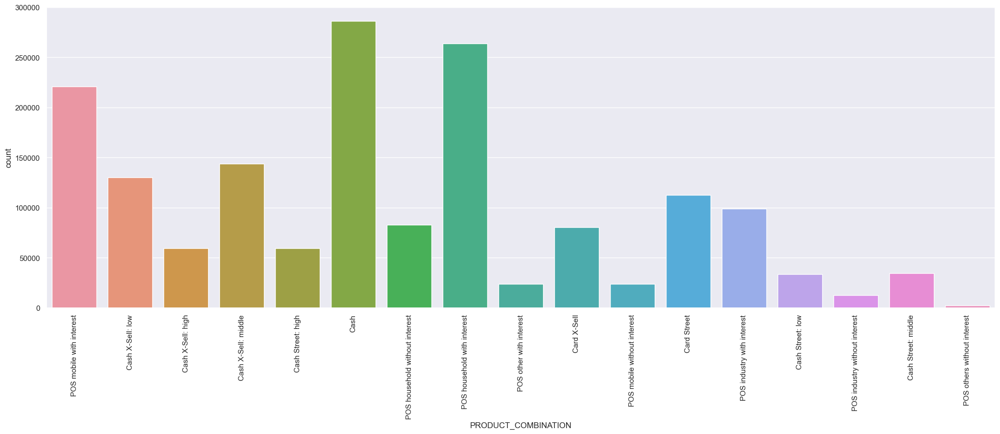

In [124]:
plt.figure(figsize = (25,8))
sns.countplot(data = previous_application, x= 'PRODUCT_COMBINATION')
plt.xticks(rotation=90);

In [125]:
previous_application.AMT_CREDIT.value_counts()

0.00         336768
45000.00      35051
225000.00     21094
450000.00     19954
135000.00     18720
              ...  
262768.50         1
354213.00         1
438817.50         1
253111.50         1
436370.22         1
Name: AMT_CREDIT, Length: 86803, dtype: int64

In [126]:
round(previous_application.AMT_CREDIT.describe(),2)

count   1670213.00
mean     196114.02
std      318574.62
min           0.00
25%       24160.50
50%       80541.00
75%      216418.50
max     6905160.00
Name: AMT_CREDIT, dtype: float64

In [127]:
previous_application.AMT_CREDIT.mode()

0   0.00
Name: AMT_CREDIT, dtype: float64

- In AMT_CREDIT column maximum count of values is 0 , it may mean the people who applied but the amount was not approved. So if needed we can impute the missing value with 0 

### Checking other columns for incorrect data type or missing values

In [128]:
previous_application.CODE_REJECT_REASON.value_counts(normalize= True)*100

XAP      81.01
HC       10.49
LIMIT     3.33
SCO       2.24
CLIENT    1.58
SCOFR     0.77
XNA       0.31
VERIF     0.21
SYSTEM    0.04
Name: CODE_REJECT_REASON, dtype: float64

#### CODE_REJECT_REASON
- XAP and XNA are the maximum values in this column - these are missing values , probably not available or not applicable 
- This is more than 80% missing values , so can drop this column or leave it as it is. 

In [129]:
previous_application.NAME_YIELD_GROUP.value_counts(normalize= True)*100

XNA          30.97
middle       23.08
high         21.15
low_normal   19.28
low_action    5.51
Name: NAME_YIELD_GROUP, dtype: float64

#### NAME_YIELD_GROUP
- Maximum data (30%) is Not available (XNA). We can leave it as it is. 

In [130]:
previous_application.NAME_SELLER_INDUSTRY.value_counts(normalize= True)*100

XNA                    51.23
Consumer electronics   23.85
Connectivity           16.53
Furniture               3.46
Construction            1.78
Clothing                1.43
Industry                1.15
Auto technology         0.30
Jewelry                 0.16
MLM partners            0.07
Tourism                 0.03
Name: NAME_SELLER_INDUSTRY, dtype: float64

#### NAME_SELLER_INDUSTRY
- Maximum data (51%) is Not available (XNA). We can leave it as it is.

In [131]:
previous_application.CHANNEL_TYPE.value_counts(normalize= True)*100

Credit and cash offices      43.11
Country-wide                 29.62
Stone                        12.70
Regional / Local              6.50
Contact center                4.27
AP+ (Cash loan)               3.42
Channel of corporate sales    0.37
Car dealer                    0.03
Name: CHANNEL_TYPE, dtype: float64

In [132]:
previous_application.NAME_PRODUCT_TYPE.value_counts(normalize= True)*100


XNA       63.68
x-sell    27.32
walk-in    9.00
Name: NAME_PRODUCT_TYPE, dtype: float64

#### NAME_PRODUCT_TYPE
- 63% missing values (XNA). Will leave as it is. 

In [133]:
previous_application.NAME_PORTFOLIO.value_counts(normalize= True)*100


POS     41.37
Cash    27.63
XNA     22.29
Cards    8.68
Cars     0.03
Name: NAME_PORTFOLIO, dtype: float64

#### NAME_PORTFOLIO
- It has 22% missing values as XNA. Will be better not to impute

In [134]:
previous_application.NAME_PORTFOLIO.mode()

0    POS
Name: NAME_PORTFOLIO, dtype: object

In [135]:
previous_application.NAME_GOODS_CATEGORY.value_counts(normalize= True)*100

XNA                        56.93
Mobile                     13.45
Consumer Electronics        7.28
Computers                   6.33
Audio/Video                 5.95
Furniture                   3.21
Photo / Cinema Equipment    1.50
Construction Materials      1.50
Clothing and Accessories    1.41
Auto Accessories            0.44
Jewelry                     0.38
Homewares                   0.30
Medical Supplies            0.23
Vehicles                    0.20
Sport and Leisure           0.18
Gardening                   0.16
Other                       0.15
Office Appliances           0.14
Tourism                     0.10
Medicine                    0.09
Direct Sales                0.03
Fitness                     0.01
Additional Service          0.01
Education                   0.01
Weapon                      0.00
Insurance                   0.00
Animals                     0.00
House Construction          0.00
Name: NAME_GOODS_CATEGORY, dtype: float64

#### NAME_GOODS_CATEGORY
- 56% data is missing or unavailable 

In [136]:
previous_application.NAME_CLIENT_TYPE.value_counts(normalize= True)*100

Repeater    73.72
New         18.04
Refreshed    8.12
XNA          0.12
Name: NAME_CLIENT_TYPE, dtype: float64

#### NAME_CLIENT_TYPE
- 0.12% missing values as XNA. Can impute with Repeater which is the mode. As there is no data available they may also be new clients without any previous data. Then imputing with New will be better.  

In [137]:
previous_application.NAME_PAYMENT_TYPE.value_counts(normalize= True)*100

Cash through the bank                       61.88
XNA                                         37.56
Non-cash from your account                   0.49
Cashless from the account of the employer    0.06
Name: NAME_PAYMENT_TYPE, dtype: float64

#### NAME_PAYMENT_TYPE
- 37% missing values (XNA). As the % is quite high better not to impute. 
-  Cash through bank is the most frequent payment type used by clients

In [138]:
previous_application.NAME_CONTRACT_STATUS.value_counts(normalize= True)*100

Approved       62.07
Canceled       18.94
Refused        17.40
Unused offer    1.58
Name: NAME_CONTRACT_STATUS, dtype: float64

#### NAME_CONTRACT_STATUS
- No missing values
- Maximum loans are approved (62%)
- 1.5% loan offers are ununsed by the clients

In [139]:
previous_application.NAME_CASH_LOAN_PURPOSE.value_counts(normalize= True)*100

XAP                                55.24
XNA                                40.59
Repairs                             1.42
Other                               0.93
Urgent needs                        0.50
Buying a used car                   0.17
Building a house or an annex        0.16
Everyday expenses                   0.14
Medicine                            0.13
Payments on other loans             0.12
Education                           0.09
Journey                             0.07
Purchase of electronic equipment    0.06
Buying a new car                    0.06
Wedding / gift / holiday            0.06
Buying a home                       0.05
Car repairs                         0.05
Furniture                           0.04
Buying a holiday home / land        0.03
Business development                0.03
Gasification / water supply         0.02
Buying a garage                     0.01
Hobby                               0.00
Money for a third person            0.00
Refusal to name 

##### NAME_CASH_LOAN_PURPOSE
- 95% of the clients didn't specify the purpose if taking loan. This column is not useful in analysis

In [140]:
previous_application.NFLAG_LAST_APPL_IN_DAY.value_counts(normalize= True)*100

1   99.65
0    0.35
Name: NFLAG_LAST_APPL_IN_DAY, dtype: float64

In [141]:
previous_application.FLAG_LAST_APPL_PER_CONTRACT.value_counts(normalize= True)*100

Y   99.49
N    0.51
Name: FLAG_LAST_APPL_PER_CONTRACT, dtype: float64

In [142]:
previous_application.HOUR_APPR_PROCESS_START.value_counts(normalize= True)*100

11   11.54
12   11.14
10   10.88
13   10.31
14    9.44
15    8.56
9     7.60
16    7.27
17    5.69
8     4.38
18    3.84
7     2.73
19    2.04
6     1.54
5     0.92
20    0.87
4     0.56
3     0.30
21    0.24
2     0.07
22    0.04
1     0.01
23    0.01
0     0.01
Name: HOUR_APPR_PROCESS_START, dtype: float64

In [143]:
previous_application.WEEKDAY_APPR_PROCESS_START.value_counts(normalize= True)*100

TUESDAY     15.27
WEDNESDAY   15.27
MONDAY      15.18
FRIDAY      15.09
THURSDAY    14.91
SATURDAY    14.41
SUNDAY       9.86
Name: WEEKDAY_APPR_PROCESS_START, dtype: float64

In [144]:
previous_application.AMT_APPLICATION.value_counts(normalize= True)*100

0.00        23.49
45000.00     2.86
225000.00    2.61
135000.00    2.44
450000.00    2.33
             ... 
185292.00    0.00
225054.00    0.00
156212.55    0.00
99896.31     0.00
267295.50    0.00
Name: AMT_APPLICATION, Length: 93885, dtype: float64

In [145]:
previous_application.NAME_CONTRACT_TYPE.value_counts(normalize= True)*100

Cash loans        44.76
Consumer loans    43.66
Revolving loans   11.57
XNA                0.02
Name: NAME_CONTRACT_TYPE, dtype: float64

#### NAME_CONTRACT_TYPE
- 0.02% missing , can impute with Cash Loan which in the mode. 

In [146]:
previous_application.DAYS_DECISION.value_counts(normalize= True)*100

-245    0.15
-238    0.14
-210    0.14
-273    0.14
-196    0.14
        ... 
-2882   0.01
-2922   0.01
-2921   0.01
-2902   0.01
-1      0.00
Name: DAYS_DECISION, Length: 2922, dtype: float64

In [147]:
previous_application.DAYS_DECISION = previous_application.DAYS_DECISION.apply(lambda x: abs(x))

In [148]:
round(previous_application.DAYS_DECISION.describe(),2)

count   1670214.00
mean        880.68
std         779.10
min           1.00
25%         280.00
50%         581.00
75%        1300.00
max        2922.00
Name: DAYS_DECISION, dtype: float64

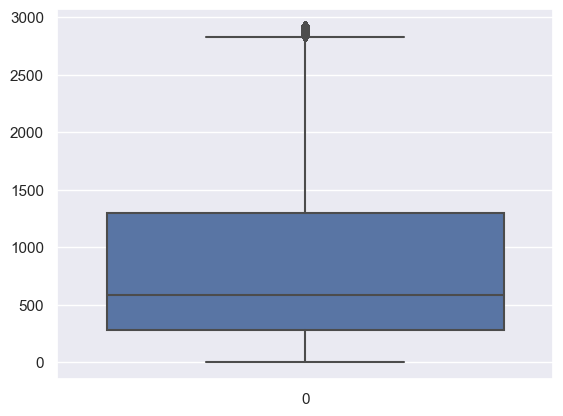

In [149]:
sns.boxplot(previous_application.DAYS_DECISION);

In [150]:
previous_application.DAYS_DECISION.skew()

1.0530796747910551

#### DAYS_DECISION
- These values are negative and should be converted to positive.
- No outlier 
- highly skewed data , Skewness 1.05

In [151]:
merged = pd.merge(application_data,previous_application, on= 'SK_ID_CURR', how='inner')
merged.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START_x,HOUR_APPR_PROCESS_START_x,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,Age_Years,Age_Category,Years_ID_PUBLISH,Years_EMPLOYED,Annuity_Amt_Range,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,WEEKDAY_APPR_PROCESS_START_y,HOUR_APPR_PROCESS_START_y,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,100002,1,Cash loans,M,N,Y,0,202500.00,406597.50,24700.50,351000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.02,1,1,0,1,1,0,Laborers,1.00,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.26,0.14,2.00,2.00,2.00,2.00,1134.00,0.00,0.00,0.00,0.00,0.00,1.00,26,20-30,6,2,Low,1038818,Consumer loans,9251.77,179055.00,179055.00,179055.00,SATURDAY,9,Y,1,XAP,Approved,606,XNA,XAP,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.00,low_normal,POS other with interest
1,100003,0,Cash loans,F,N,N,0,270000.00,1293502.50,35698.50,1129500.00,Family,State servant,Higher education,Married,House / apartment,0.00,1,1,0,1,1,0,Core staff,2.00,1,1,MONDAY,11,0,0,0,0,0,0,School,0.62,NaN,1.00,0.00,1.00,0.00,828.00,0.00,0.00,0.00,0.00,0.00,0.00,46,40-50,1,3,Medium,1810518,Cash loans,98356.99,900000.00,1035882.00,900000.00,FRIDAY,12,Y,1,XNA,Approved,746,XNA,XAP,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,low_normal,Cash X-Sell: low
2,100003,0,Cash loans,F,N,N,0,270000.00,1293502.50,35698.50,1129500.00,Family,State servant,Higher education,Married,House / apartment,0.00,1,1,0,1,1,0,Core staff,2.00,1,1,MONDAY,11,0,0,0,0,0,0,School,0.62,NaN,1.00,0.00,1.00,0.00,828.00,0.00,0.00,0.00,0.00,0.00,0.00,46,40-50,1,3,Medium,2636178,Consumer loans,64567.67,337500.00,348637.50,337500.00,SUNDAY,17,Y,1,XAP,Approved,828,Cash through the bank,XAP,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.00,middle,POS industry with interest
3,100003,0,Cash loans,F,N,N,0,270000.00,1293502.50,35698.50,1129500.00,Family,State servant,Higher education,Married,House / apartment,0.00,1,1,0,1,1,0,Core staff,2.00,1,1,MONDAY,11,0,0,0,0,0,0,School,0.62,NaN,1.00,0.00,1.00,0.00,828.00,0.00,0.00,0.00,0.00,0.00,0.00,46,40-50,1,3,Medium,2396755,Consumer loans,6737.31,68809.50,68053.50,68809.50,SATURDAY,15,Y,1,XAP,Approved,2341,Cash through the bank,XAP,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200,Consumer electronics,12.00,middle,POS household with interest
4,100004,0,Revolving loans,M,Y,Y,0,67500.00,135000.00,6750.00,135000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.01,1,1,1,1,1,0,Laborers,1.00,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.56,0.73,0.00,0.00,0.00,0.00,815.00,0.00,0.00,0.00,0.00,0.00,0.00,52,50-60,7,1,Low,1564014,Consumer loans,5357.25,24282.00,20106.00,24282.00,FRIDAY,5,Y,1,XAP,Approved,815,Cash through the bank,XAP,New,Mobile,POS,XNA,Regional / Local,30,Connectivity,4.00,m

In [152]:
merged.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE_x', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT_x', 'AMT_ANNUITY_x', 'AMT_GOODS_PRICE_x', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START_x', 'HOUR_APPR_PROCESS_START_x',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_

In [153]:
merged.SK_ID_CURR.nunique()

291057

In [154]:
merged.SK_ID_CURR.value_counts()

265681    73
173680    72
242412    68
206783    67
389950    64
          ..
184932     1
361258     1
361256     1
184935     1
100002     1
Name: SK_ID_CURR, Length: 291057, dtype: int64

In [155]:
merged.shape

(1413701, 79)

- In the merged data frame there are only 291057 unique SK_ID_CURR, rest 1122644 are duplicate entries (which may be because of multiple loan request by same client)

In [156]:
1413701-291057

1122644

### Segregating the data based on Target=0 and Target=1

In [157]:
df0 = application_data[application_data.TARGET ==0]
df1 = application_data[application_data.TARGET ==1]

mf0= merged[merged.TARGET == 0]
mf1= merged[merged.TARGET == 1]

In [158]:
mf0.shape

(1291341, 79)

In [159]:
mf1.shape

(122360, 79)

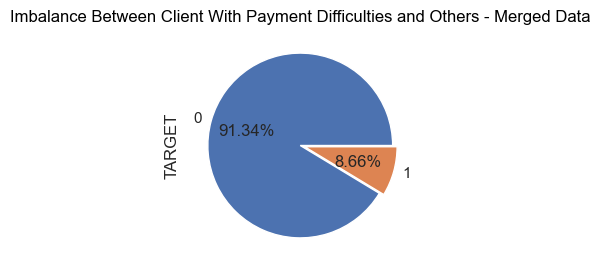

In [160]:
plt.figure (figsize = [4,3])
plt.title ('Imbalance Between Client With Payment Difficulties and Others - Merged Data' , color = 'black' )
merged.TARGET.value_counts(normalize = True).plot.pie(autopct= '%2.2f%%' , explode=[0,0.05]);

In [161]:
# Imbalance in data is similar to the application_data set

# Plotting Graphs

In [162]:
def plots(column, hue):
    col = column
    hue = hue
    fig = plt.figure(figsize=(20,8))

    ax1 = plt.subplot(221)
    merged[col].value_counts().plot.pie(autopct = "%1.0f%%", ax=ax1)
    plt.title('Plot for the column: '+ column + ' on overall data')


    ax2 = plt.subplot(222)
    df = pd.DataFrame()
    df['0']= ((mf0[col].value_counts())/len(mf0))
    df['1']= ((mf1[col].value_counts())/len(mf1))
    df.plot.bar(ax=ax2)
    plt.title('Plotting data for target in terms of total count')


    ax3 = plt.subplot(223)
    sns.countplot(x=col, hue=hue, data=mf0, ax = ax3)
    plt.xticks(rotation=90)
    plt.title('Plotting data for Non-Defaulter in terms of percentage')

    ax4 = plt.subplot(224)
    sns.countplot(x=col, hue=hue, data=mf1, ax = ax4)
    plt.xticks(rotation=90)
    plt.title('Plotting data for Defaulter in terms of percentage')



    fig.tight_layout()

    plt.show()

# Bivariate Analysis

#### Doing Bivariate analysis on Loan approval status with respect to few other columns 

- In the initial application data set analysis the following columns were found to be important. 
CODE_GENDER , NAME_INCOME_TYPE , NAME_EDUCATION_TYPE , NAME_FAMILY_STATUS , OCCUPATION_TYPE and Age_Category
so will plot those columns 

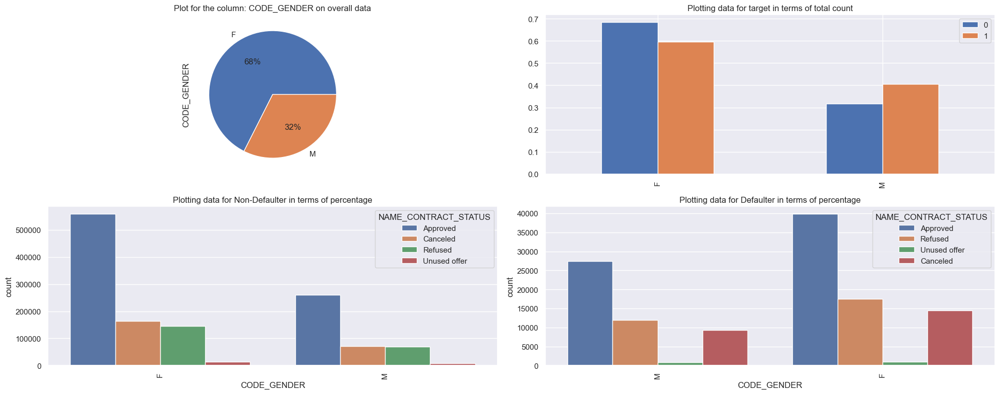

In [163]:
plots('CODE_GENDER','NAME_CONTRACT_STATUS')

- Female got highest amount of loans approved and they are highest repayers

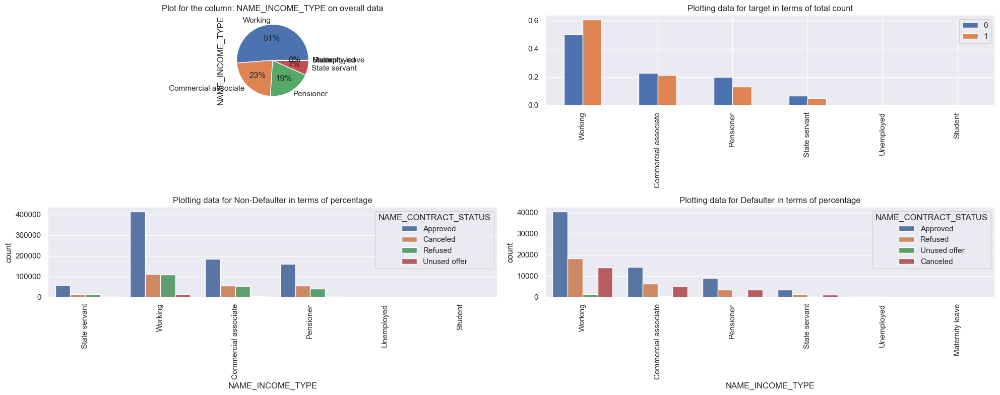

In [164]:
plots('NAME_INCOME_TYPE','NAME_CONTRACT_STATUS')

- Working people got highest loans approved, but they are the highest defaulters too. So bank should offer them less loans. 
- Bank should offer loan to other categories like Students , Pensioners and Commercial associates more , as they are better repayers. 
- Clients on maternity leave should not be targeted. They have no history of repayment. 

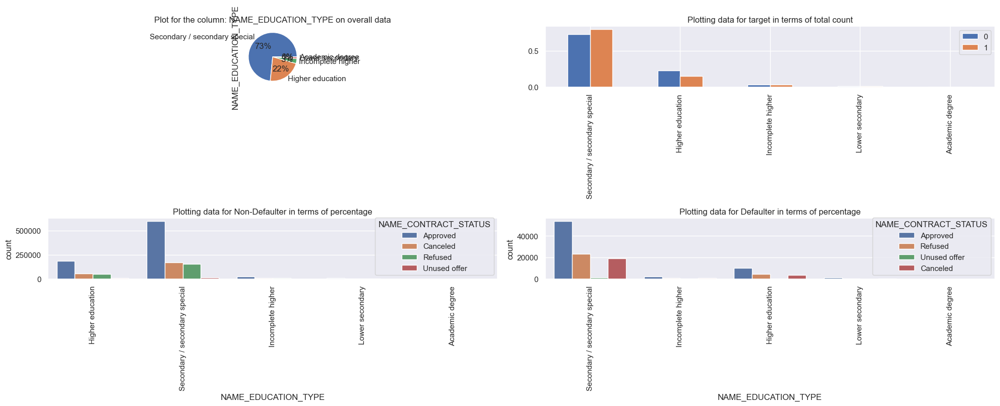

In [165]:
plots('NAME_EDUCATION_TYPE','NAME_CONTRACT_STATUS')

- Clients with Secondary/secondary special education has highest loans, but the defaulters are higher than non-defaulters.
- Clients with higher eductaion are better repayers, so bank can offer them loans.

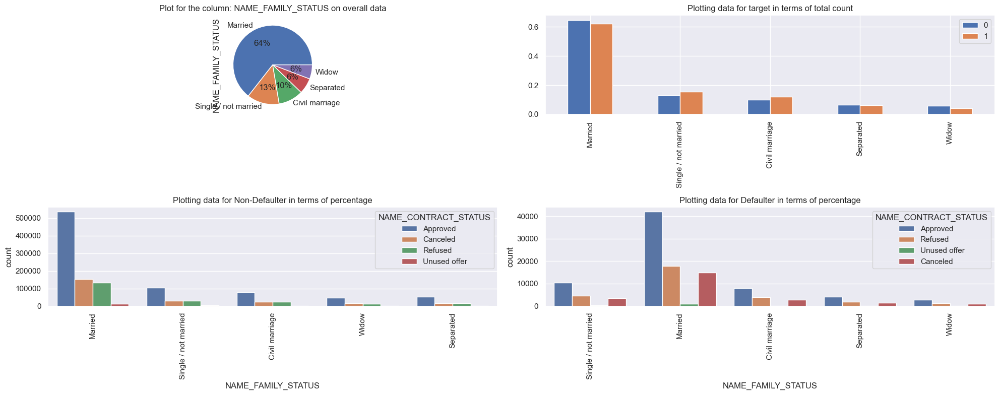

In [166]:
plots('NAME_FAMILY_STATUS','NAME_CONTRACT_STATUS')

- Married clients take more loans and repayment is also good.
- Single/Not married and Civil Marriage categories have higher defaulters, so bank should offer less loan to these categories.

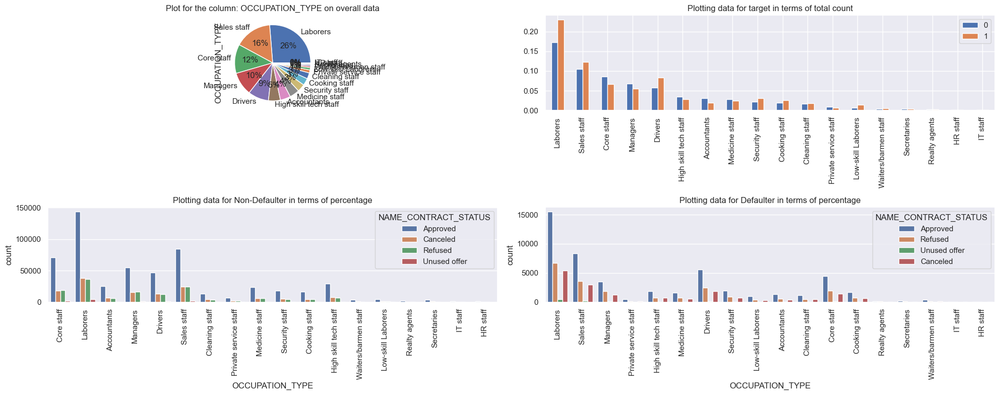

In [167]:
plots('OCCUPATION_TYPE','NAME_CONTRACT_STATUS')

- Laborer Occupation type is the highest defaulter followed by Sales Staff.
- Core Staff, Managers, High skill tech staff and accountants are high repayers. Bank should offer them more loans.

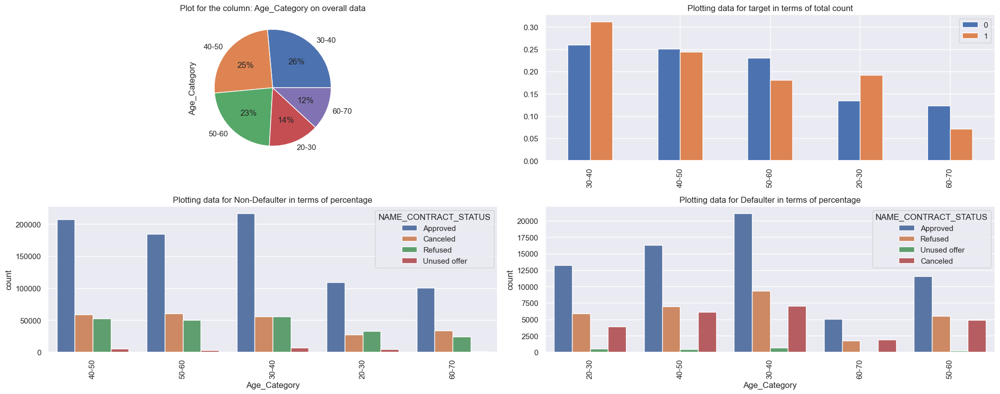

In [168]:
plots('Age_Category','NAME_CONTRACT_STATUS')

- Age range 30-40 and 20-30 has highest defaulters.
- Age range 40-60 are better repayers so bank should offer loans to this category.

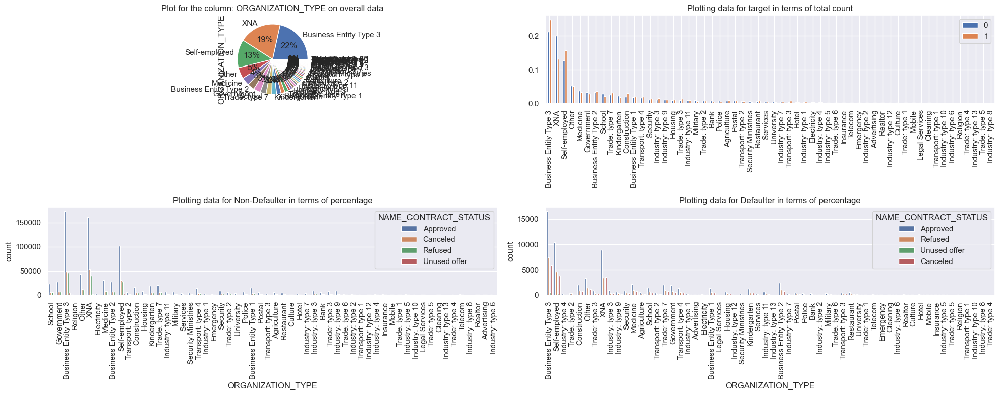

In [169]:
plots('ORGANIZATION_TYPE','NAME_CONTRACT_STATUS')

In [170]:
merged.NAME_CLIENT_TYPE.value_counts()

Repeater     1037682
New           259540
Refreshed     114936
XNA             1543
Name: NAME_CLIENT_TYPE, dtype: int64

In [171]:
previous_application.NAME_CLIENT_TYPE.value_counts()

Repeater     1231261
New           301363
Refreshed     135649
XNA             1941
Name: NAME_CLIENT_TYPE, dtype: int64

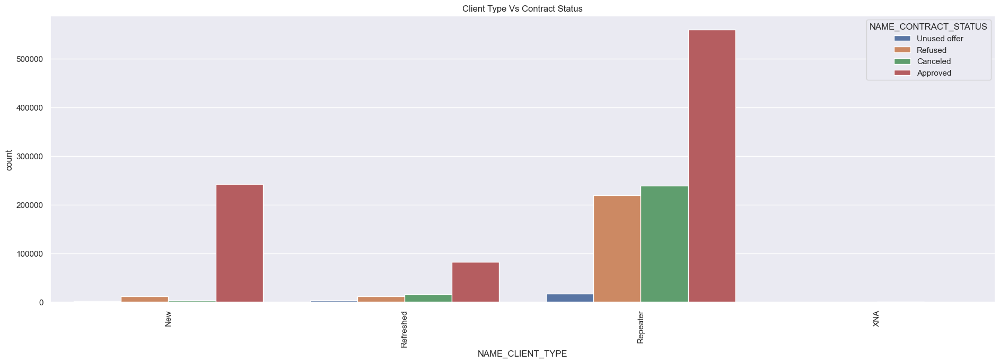

In [172]:
def merge_count(column,hue_column):
    plt.figure(figsize = [20,8])
    palt = sns.color_palette()

    sns.countplot(x = column, data = merged, 
                  order = sorted(merged[column].unique()), palette = palt,
                  hue = hue_column, hue_order = sorted(merged[hue_column].unique(), reverse = True))
    plt.xticks(rotation = 90)
    plt.title('Client Type Vs Contract Status')

    plt.tight_layout(pad = 4)
    plt.show()

merge_count('NAME_CLIENT_TYPE','NAME_CONTRACT_STATUS')

- Repeater clients got the most loan approvals followed by New

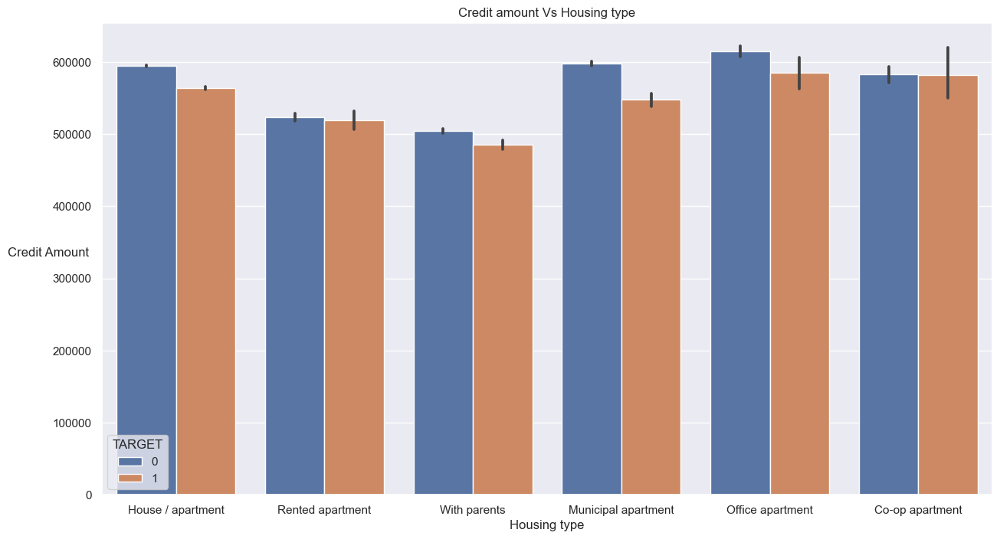

In [173]:
plt.figure(figsize = [15,8])
plt.title('Credit amount Vs Housing type')
sns.barplot(data = merged, x = 'NAME_HOUSING_TYPE', y = 'AMT_CREDIT_x', hue = 'TARGET', palette = "deep")
plt.xticks(rotation = 0)
plt.xlabel('Housing type')
plt.ylabel('Credit Amount', rotation = 0);

- Clients with Office apartment, municipal apartments and House/ apartment have the highest non defaulters. They should be considered for loans.
- Clients living with parents have the highest defaulters. 

# Correlation 

For Non defaulters

In [174]:
mf0.corr().unstack().sort_values(ascending= False).drop_duplicates().head(20)

SK_ID_CURR                   SK_ID_CURR                    1.00
AMT_GOODS_PRICE_y            AMT_APPLICATION               1.00
OBS_60_CNT_SOCIAL_CIRCLE     OBS_30_CNT_SOCIAL_CIRCLE      1.00
AMT_CREDIT_y                 AMT_GOODS_PRICE_y             0.99
AMT_GOODS_PRICE_x            AMT_CREDIT_x                  0.99
AMT_CREDIT_y                 AMT_APPLICATION               0.98
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT          0.94
CNT_FAM_MEMBERS              CNT_CHILDREN                  0.88
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION   0.88
DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE      0.86
REG_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY       0.84
AMT_GOODS_PRICE_y            AMT_ANNUITY_y                 0.82
AMT_CREDIT_y                 AMT_ANNUITY_y                 0.82
AMT_APPLICATION              AMT_ANNUITY_y                 0.81
AMT_ANNUITY_x                AMT_GOODS_PRICE_x             0.76
                             AMT_CREDIT_

### Creating a heatmap with only highly correlated columns

In [175]:
high_correlation = mf0[['AMT_CREDIT_y','AMT_GOODS_PRICE_y','AMT_APPLICATION', 'REGION_RATING_CLIENT_W_CITY','REGION_RATING_CLIENT',
                      'CNT_FAM_MEMBERS','REG_REGION_NOT_WORK_REGION','CNT_CHILDREN', 'LIVE_REGION_NOT_WORK_REGION','AMT_ANNUITY_y',
                      'CNT_PAYMENT','Age_Years','Years_EMPLOYED' ]].copy()

In [176]:
correlation_nd = high_correlation.corr()

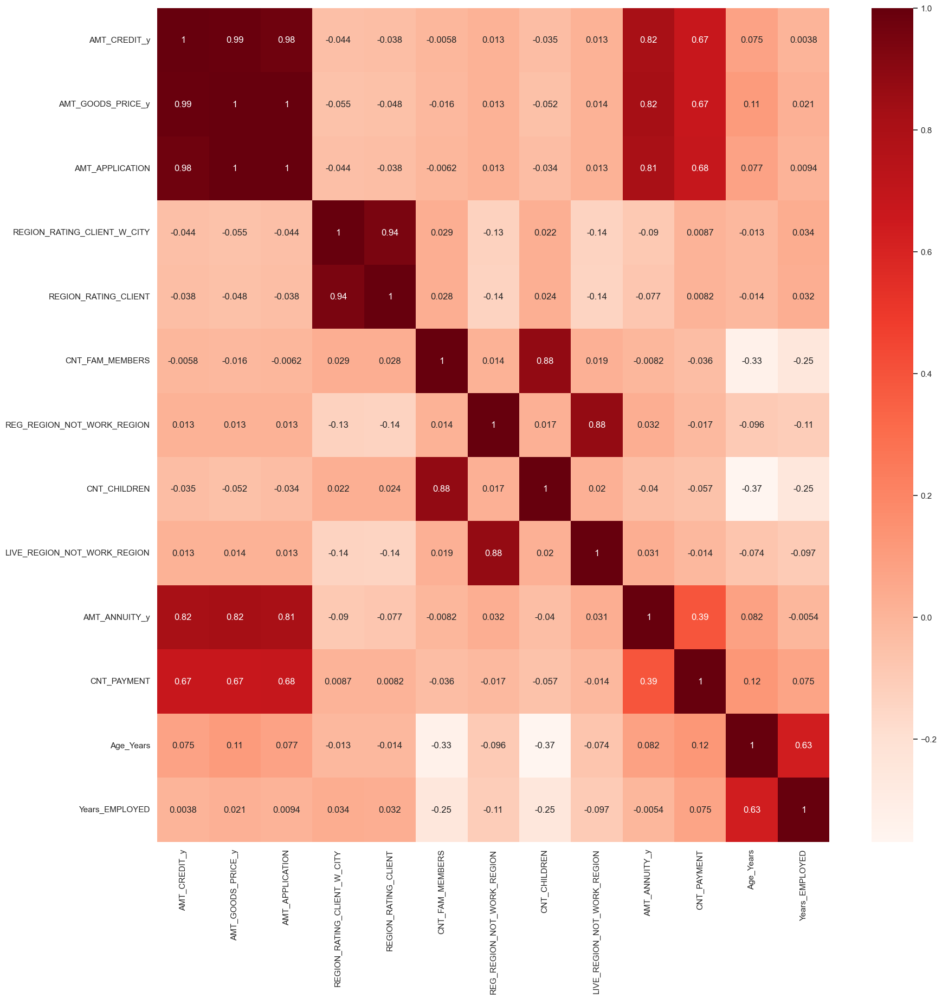

In [177]:
plt.figure(figsize = (20,20))
sns.heatmap(data=correlation_nd , cmap = 'Reds',annot=True);

- Credit Amount and Goods Price are highly positively co-related. More the credit amount more the Good's price , so is Amount application and Good's price. 
<br/>
<br/>
- Amount Annuity has high positive correlation with Credit Amount, Goods Price and Amount application
<br/>
<br/>
- CNT Family members and CNT children are highly correlated , more children means big family 
<br/>
<br/>
- Age and Annuity amount is highly correlated. 

##### Thank you!!!